In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
#from google.colab import drive
#drive.mount('/content/drive')

In [3]:
import pandas as pd
import numpy as np
#import os
#os.chdir('/content/drive/My Drive/MONOGRAFIA')

A base carregada contém 24 horas de amostras de 20 sensores de processo (pressão, vazão, temperatura, nível, abertura de válvulas), com amostras realizadas a cada 60 segundos. Resulta, assim, um total de 24 x 60 = 1440 registros para cada dia carregado.

A listagem de cada evento, como apresentado abaixo, indica o início e fim de cada um dos períodos relevantes ao evento: período de normalidade prévio, período de perturbação do processo, chamado de 1º indício, período de início de degradação, chamado de pré-cavitação, e o período de cavitação em si.

Dessa forma, considerou-se como base de treino do algoritmo os eventos de 25/04, 30/04, 02/05, 06/05, 14/05, 28/05, 03/06, 27/06 e 09/10, sendo o evento de 09/10 utilizado como teste.

In [4]:
base_completa = pd.read_csv('base_completa_v2.csv',sep=";")

In [5]:
base_completa.columns

Index(['TIMESTAMP', 'var1', 'var2', 'var3', 'var4', 'var5', 'var6', 'var7',
       'var8', 'var9', 'var10', 'var11', 'var12', 'var13', 'var14', 'var15',
       'var16', 'var17', 'var18', 'var19', 'var20'],
      dtype='object')

In [7]:
#TIMESTAMP dos eventos - Inicio NORMAL, Fim NORMAL, Inicio IND, Fim IND, Início PRE, Fim PRE, Início CAV, Fim CAV
evento_01 = ['2020-04-25 04:45:50','2020-04-25 05:07:30','2020-04-25 05:07:40','2020-04-25 05:20:20','2020-04-25 05:20:30','2020-04-25 05:24:30','2020-04-25 05:24:40','2020-04-25 05:25:10']
evento_02 = ['2020-04-30 21:05:30','2020-04-30 21:28:20','2020-04-30 21:28:30','2020-04-30 21:45:40','2020-04-30 21:45:50','2020-04-30 21:47:40','2020-04-30 21:47:50','2020-04-30 21:49:40']
evento_03 = ['2020-05-02 03:54:10','2020-05-02 04:45:50','2020-05-02 04:46:00','2020-05-02 05:33:30','2020-05-02 05:33:40','2020-05-02 05:35:10','2020-05-02 05:35:20','2020-05-02 05:35:58']
evento_04a = ['2020-05-06 03:52:50','2020-05-06 05:12:50','2020-05-06 05:13:00','2020-05-06 06:03:20','2020-05-06 06:03:30','2020-05-06 06:05:20','2020-05-06 06:05:30','2020-05-06 06:05:50']
#evento_04b = ['','','2020-05-06 06:49:00','2020-05-06 06:54:10','2020-05-06 06:54:20','2020-05-06 06:55:40','2020-05-06 06:55:50','2020-05-06 06:56:10']
#evento_04c = ['','','2020-05-06 08:27:00','2020-05-06 08:33:20','2020-05-06 08:33:30','2020-05-06 08:38:10','2020-05-06 08:38:20','2020-05-06 08:39:00']
evento_05 = ['2020-05-14 17:32:30','2020-05-14 18:03:00','2020-05-14 18:03:10','2020-05-14 18:27:40','2020-05-14 18:27:50','2020-05-14 18:29:40','2020-05-14 18:29:50','2020-05-14 18:31:50']
evento_06 = ['2020-05-28 13:52:50','2020-05-28 14:00:40','2020-05-28 14:00:50','2020-05-28 14:04:50','2020-05-28 14:05:00','2020-05-28 14:06:10','2020-05-28 14:06:20','2020-05-28 14:07:20']
evento_07 = ['2020-06-03 00:45:50','2020-06-03 01:12:00','2020-06-03 01:12:10','2020-06-03 01:33:40','2020-06-03 01:33:50','2020-06-03 01:35:30','2020-06-03 01:35:40','2020-06-03 01:36:30']
evento_08 = ['2020-06-27 14:52:50','2020-06-27 15:16:10','2020-06-27 15:16:20','2020-06-27 15:26:20','2020-06-27 15:26:30','2020-06-27 15:32:40','2020-06-27 15:32:50','2020-06-27 15:33:40']
evento_09 = ['2020-10-09 23:05:20','2020-10-09 23:23:50','2020-10-09 23:24:00','2020-10-09 23:38:40','2020-10-09 23:38:50','2020-10-09 23:40:10','2020-10-09 23:40:20','2020-10-09 23:41:10']

lista_eventos = [evento_01,evento_02,evento_03,evento_04a,evento_05,evento_06,evento_07,evento_08,evento_09]

base_completa = base_completa.set_index('TIMESTAMP')

base_treino = []
for i in [0,1,2,3,4,5,6,7]:
  base_treino.append(base_completa.loc[lista_eventos[i][0]:lista_eventos[i][7]])

for i in [0,1,2,3,4,5,6,7]:
  base_treino[i]['LABEL'] = ""

for i in [0,1,2,3,4,5,6,7]:
    base_treino[i].loc[lista_eventos[i][0]:lista_eventos[i][1]]['LABEL'] = 'NORMAL'
    base_treino[i].loc[lista_eventos[i][2]:lista_eventos[i][3]]['LABEL'] = 'INDICIO'
    base_treino[i].loc[lista_eventos[i][4]:lista_eventos[i][5]]['LABEL'] = 'PRÉ-CAVITAÇÃO'
    base_treino[i].loc[lista_eventos[i][6]:lista_eventos[i][7]]['LABEL'] = 'CAVITAÇÃO'

base_teste = base_completa.loc[lista_eventos[8][0]:lista_eventos[8][7]]
base_teste['LABEL'] = ""
base_teste.loc[lista_eventos[8][0]:lista_eventos[8][1]]['LABEL'] = 'NORMAL'
base_teste.loc[lista_eventos[8][2]:lista_eventos[8][3]]['LABEL'] = 'INDICIO'
base_teste.loc[lista_eventos[8][4]:lista_eventos[8][5]]['LABEL'] = 'PRÉ-CAVITAÇÃO'
base_teste.loc[lista_eventos[8][6]:lista_eventos[8][7]]['LABEL'] = 'CAVITAÇÃO'

In [8]:
print("Base treino:",len(base_treino))
print("Base teste:",len(base_teste))

Base treino: 8
Base teste: 36


Sabendo que dois instrumentos apresentaram problemas por um período extenso, removemos essas colunas da base e, posteriormente, removemos os NaNs:

In [9]:
for i in [0,1,2,3,4,5,6,7]:
    base_treino[i] = base_treino[i].drop(['var10','var11','var20'],axis=1)

base_teste = base_teste.drop(['var10','var11','var20'],axis=1)

for i in [0,1,2,3,4,5,6,7]:
    base_treino[i] = base_treino[i].dropna()

base_teste = base_teste.dropna()

In [10]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
flatui = ["#00b2a9", "#a8b400", "#e17000", "#fedf00"]
sns.set_palette(flatui)

Aqui criou-se uma função que transforma séries temporais em um conjunto de dados deslocados para utilização em treinamento supervisionado. Especifica-se a "quantidade" dos parâmetros de entrada (sequência t-n,...,t-1) e de previsão (t,t+1,...,t+n) através dos parâmetros n_in e n_out.

In [11]:
from pandas import DataFrame
from pandas import concat

def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # sequência de entrada (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # sequência "prevista" (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # juntando tudo num agregador
    agg = concat(cols, axis=1)
    agg.columns = names
    # deleta NaNs
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [12]:
# Configuração de quantos períodos prévios e posteriores serão gerados para o treinamento
n_previous = 5
n_next = 1

1.   Normalização
2.   Series-to-supervised
3.   Concat

In [13]:
from sklearn.preprocessing import MinMaxScaler

features_treino = pd.DataFrame()
for i in [0,1,2,3,4,5,6,7]:
  features_treino = pd.concat([features_treino,base_treino[i].drop('LABEL',axis=1)])

features_teste = base_teste.drop('LABEL',axis=1)

scaler = MinMaxScaler(feature_range=(0,1))
scaler.fit(pd.concat([features_treino,features_teste]).values)

scaled = []
reframed = []

for i in [0,1,2,3,4,5,6,7]:
  values = base_treino[i].drop('LABEL',axis=1).values
  scaled_unit = scaler.transform(values)
  scaled.append(scaled_unit)
  reframed.append(series_to_supervised(scaled_unit,n_previous,n_next))

features_treino_reframed = pd.concat([reframed[0],reframed[1],reframed[2],reframed[3],reframed[4],reframed[5],reframed[6],reframed[7]])

scaled = scaler.transform(base_teste.drop('LABEL',axis=1).values)
features_teste_reframed = series_to_supervised(scaled, n_previous, n_next)

print(features_treino_reframed.tail())
print(features_teste_reframed.head())

    var1(t-5)  var2(t-5)  var3(t-5)  var4(t-5)  var5(t-5)  var6(t-5)  \
36        0.0   0.926010   0.924740   0.852608   0.298090   0.497647   
37        0.0   0.932174   0.930362   0.835776   0.287532   0.497463   
38        0.0   0.936663   0.933647   0.813423   0.277573   0.493005   
39        0.0   0.930335   0.927916   0.828575   0.237335   0.459381   
40        0.0   0.927739   0.925613   0.829983   0.199358   0.429506   

    var7(t-5)  var8(t-5)  var9(t-5)  var10(t-5)  ...   var8(t)   var9(t)  \
36   0.330361   0.354653   0.083303         1.0  ...  0.391101  0.077525   
37   0.325957   0.382261   0.088941         1.0  ...  0.433814  0.023357   
38   0.321265   0.334484   0.094587         1.0  ...  0.647781  0.001350   
39   0.282700   0.405099   0.110499         1.0  ...  0.801200  0.000000   
40   0.228776   0.366467   0.111629         1.0  ...  1.000000  0.000000   

    var10(t)  var11(t)  var12(t)  var13(t)  var14(t)  var15(t)  var16(t)  \
36       1.0       1.0  0.612578  

Remove os cinco primeiros labels de cada set

In [14]:
labels_treino_reframed = []
for i in [0,1,2,3,4,5,6,7]:
  labels_treino_reframed.append(base_treino[i].iloc[n_previous:].LABEL)

labels_treino = pd.concat([labels_treino_reframed[0],labels_treino_reframed[1],labels_treino_reframed[2],labels_treino_reframed[3],labels_treino_reframed[4],labels_treino_reframed[5],labels_treino_reframed[6],labels_treino_reframed[7]])

labels_teste = base_teste.iloc[n_previous:].LABEL

Faz-se o encoding dos labels para que possam ser previstos pela RN:

In [15]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

values = np.array(labels_treino)
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(values)
enc = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
labels_treino_enc = enc.fit_transform(integer_encoded)

values = np.array(labels_teste)
integer_encoded = label_encoder.transform(values)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
labels_teste_enc = enc.transform(integer_encoded)

In [16]:
print(labels_treino.tail())
print(labels_treino_enc[-5:])

TIMESTAMP
2020-06-27 15:29:00    PRÉ-CAVITAÇÃO
2020-06-27 15:30:00    PRÉ-CAVITAÇÃO
2020-06-27 15:31:00    PRÉ-CAVITAÇÃO
2020-06-27 15:32:00    PRÉ-CAVITAÇÃO
2020-06-27 15:33:00        CAVITAÇÃO
Name: LABEL, dtype: object
[[0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]]


In [17]:
print(labels_teste.tail())
print(labels_teste_enc[-5:])

TIMESTAMP
2020-10-09 23:37:00          INDICIO
2020-10-09 23:38:00          INDICIO
2020-10-09 23:39:00    PRÉ-CAVITAÇÃO
2020-10-09 23:40:00    PRÉ-CAVITAÇÃO
2020-10-09 23:41:00        CAVITAÇÃO
Name: LABEL, dtype: object
[[0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]]


In [18]:
# Caso seja necessários ajustes, mantém-se o mapeamento original
features_treino_reframed_adj = features_treino_reframed

In [19]:
# Caso seja necessários ajustes, mantém-se o mapeamento original
features_teste_reframed_adj = features_teste_reframed

In [20]:
# Checando shapes
print(features_treino_reframed_adj.values.shape)
print(labels_treino_enc.shape)
print(features_teste_reframed_adj.values.shape)
print(labels_teste_enc.shape)

(444, 102)
(444, 4)
(31, 102)
(31, 4)


Definindo as entradas e saídas de treino e teste, ajustando o formato para 3 dimensões

In [21]:
# Define X e y para treino e teste, ajustando o formato
n_mins = n_previous + n_next
n_features = len(features_treino.columns)
n_obs = n_mins * n_features
train_X, train_y = features_treino_reframed_adj.values,labels_treino_enc
test_X, test_y = features_teste_reframed_adj.values,labels_teste_enc
print(train_X.shape, len(train_X), train_y.shape)
# Ajusta formato da entrada para 3D [amostras, intervalos, features]
train_X = train_X.reshape((train_X.shape[0], n_mins, n_features))
test_X = test_X.reshape((test_X.shape[0], n_mins, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(444, 102) 444 (444, 4)
(444, 6, 17) (444, 4) (31, 6, 17) (31, 4)


In [22]:
print(train_X.shape, train_y.shape)

(444, 6, 17) (444, 4)


In [23]:
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense,LSTM,Dropout,Conv1D,MaxPooling1D,GlobalAveragePooling1D
from keras.metrics import AUC,CategoricalAccuracy
from keras.losses import CategoricalCrossentropy

Using TensorFlow backend.


In [24]:
n_batch = 32
n_training = 100
n_epochs = 3000
import time

In [25]:
n_filters = 64
n_kernel = 6
n_pool = 3

Os mesmos ensaios, agora com dropout = 0.2 entre camadas LSTM

In [ ]:
scores_lstm_drop = []
models_lstm_drop = []
stories_lstm_drop = []
preds_lstm_drop = []

for i in range(0,n_training):
    my_loss = CategoricalCrossentropy()
    my_metric = CategoricalAccuracy()
    start_time = time.time()
    print("Rodada número ",i)
    # design network
    model = Sequential()

    # first layer
    model.add(LSTM(units=64,input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dropout(0.2))
    # output layer
    model.add(Dense(units=4,activation='softmax'))
    model.compile(loss=my_loss, optimizer='adam', metrics=[my_metric])
    # fit network
    history = model.fit(train_X, train_y, epochs=n_epochs, batch_size=n_batch,verbose=False, shuffle=True)
  
    stories_lstm_drop.append(history)
    scores_lstm_drop.append(history.history['categorical_accuracy'][-1])
    models_lstm_drop.append(model)

    pyplot.plot(stories_lstm_drop[i].history['categorical_accuracy'], label='acc')
    pyplot.plot(stories_lstm_drop[i].history['loss'],label='loss')
    pyplot.legend()
    pyplot.show()

    # make a prediction
    yhat = models_lstm_drop[i].predict(test_X)
    preds_lstm_drop.append(yhat)

    pyplot.plot(np.array(labels_teste_enc[:,2]))
    pyplot.plot(preds_lstm_drop[i][:,0],label="cavitação")
    pyplot.plot(preds_lstm_drop[i][:,1],label="indicio")
    pyplot.plot(preds_lstm_drop[i][:,2],label="normal")
    pyplot.plot(preds_lstm_drop[i][:,3],label="pré-cav")
    pyplot.legend()
    pyplot.show()
  
    print("--- %s segundos ---" % (time.time() - start_time))

In [ ]:
scores_lstm_2_drop = []
models_lstm_2_drop = []
stories_lstm_2_drop = []
preds_lstm_2_drop = []

for i in range(0,n_training):
    my_loss = CategoricalCrossentropy()
    my_metric = CategoricalAccuracy()
    start_time = time.time()
    print("Rodada número ",i)
    # design network
    model = Sequential()

    # first layer
    model.add(LSTM(units=64,return_sequences=True,input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dropout(0.2))
    # second layer
    model.add(LSTM(units=64))
    model.add(Dropout(0.2))
    # output layer
    model.add(Dense(units=4,activation='softmax'))
    model.compile(loss=my_loss, optimizer='adam', metrics=[my_metric])
    # fit network
    history = model.fit(train_X, train_y, epochs=n_epochs, batch_size=n_batch, verbose=False, shuffle=True)

    stories_lstm_2_drop.append(history)
    scores_lstm_2_drop.append(history.history['categorical_accuracy'][-1])
    models_lstm_2_drop.append(model)

    pyplot.plot(stories_lstm_2_drop[i].history['categorical_accuracy'], label='acc')
    pyplot.plot(stories_lstm_2_drop[i].history['loss'],label='loss')
    pyplot.legend()
    pyplot.show()

    # make a prediction
    yhat = models_lstm_2_drop[i].predict(test_X)
    preds_lstm_2_drop.append(yhat)

    pyplot.plot(np.array(labels_teste_enc[:,2]))
    pyplot.plot(preds_lstm_2_drop[i][:,0],label="cavitação")
    pyplot.plot(preds_lstm_2_drop[i][:,1],label="indicio")
    pyplot.plot(preds_lstm_2_drop[i][:,2],label="normal")
    pyplot.plot(preds_lstm_2_drop[i][:,3],label="pré-cav")
    pyplot.legend()
    pyplot.show()
  
    print("--- %s segundos ---" % (time.time() - start_time))

In [ ]:
scores_cnn_drop = []
models_cnn_drop = []
stories_cnn_drop = []
preds_cnn_drop = []

for i in range(0,n_training):
    print("Rodada número ",i)
    my_loss = CategoricalCrossentropy()
    my_metric = CategoricalAccuracy()
    start_time = time.time()
    # design network
    model = Sequential()

    model.add(Conv1D(filters=n_filters, kernel_size=n_kernel, padding='same', activation='relu',input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(MaxPooling1D(pool_size=n_pool))
    model.add(Dropout(0.2))
    # first layer
    model.add(LSTM(units=64))
    model.add(Dropout(0.2))
    # output layer
    model.add(Dense(units=4,activation='softmax'))
    model.compile(loss=my_loss, optimizer='adam', metrics=[my_metric])
  
    # fit network
    history = model.fit(train_X, train_y, epochs=n_epochs, verbose=False, batch_size=n_batch, shuffle=True)
    stories_cnn_drop.append(history)
    scores_cnn_drop.append(history.history['categorical_accuracy'][-1])
    models_cnn_drop.append(model)

    # plot history
    pyplot.plot(stories_cnn_drop[i].history['categorical_accuracy'], label='acc')
    pyplot.plot(stories_cnn_drop[i].history['loss'],label='loss')
    pyplot.legend()
    pyplot.show()

    # make a prediction
    yhat = models_cnn_drop[i].predict(test_X)
    preds_cnn_drop.append(yhat)

    pyplot.plot(np.array(labels_teste_enc[:,2]))
    pyplot.plot(preds_cnn_drop[i][:,0],label="cavitação")
    pyplot.plot(preds_cnn_drop[i][:,1],label="indicio")
    pyplot.plot(preds_cnn_drop[i][:,2],label="normal")
    pyplot.plot(preds_cnn_drop[i][:,3],label="pré-cav")
    pyplot.legend()
    pyplot.show()

    print("--- %s segundos ---" % (time.time() - start_time))

In [29]:
test_full = base_completa
test_full = test_full.drop(['var10','var11','var20'],axis=1)
test_full = test_full.loc['2020-10-09 00:00:00':'2020-10-09 23:59:59']
test_full_scaled = scaler.transform(test_full.values)
test_full_series = series_to_supervised(test_full_scaled,n_previous,n_next)
test_full_series = test_full_series.values.reshape((1435, n_mins, n_features))

LSTM_DROP_ 0


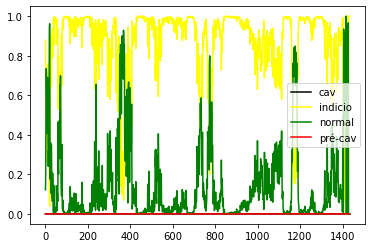

LSTM_DROP_ 1


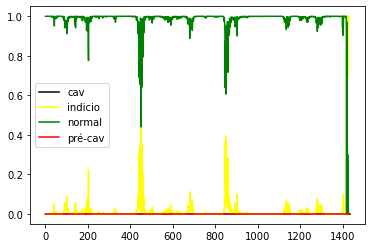

LSTM_DROP_ 2


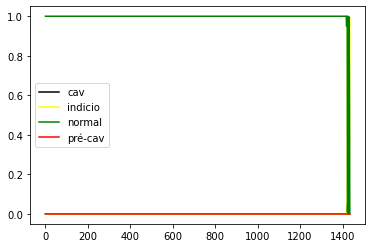

LSTM_DROP_ 3


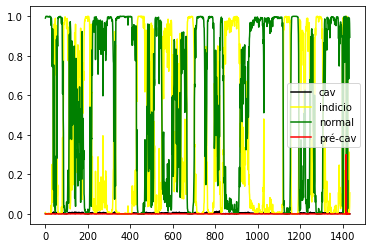

LSTM_DROP_ 4


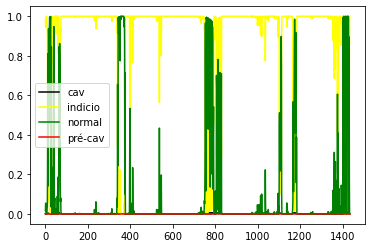

LSTM_DROP_ 5


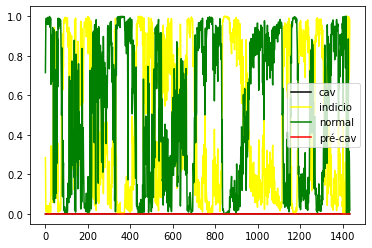

LSTM_DROP_ 6


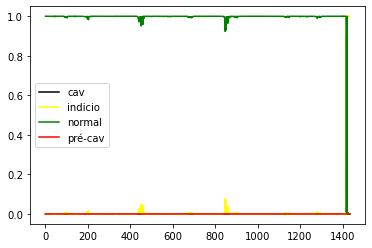

LSTM_DROP_ 7


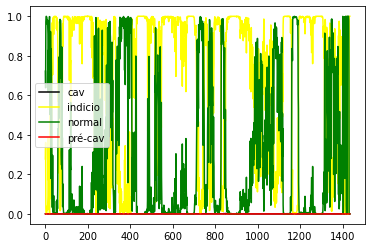

LSTM_DROP_ 8


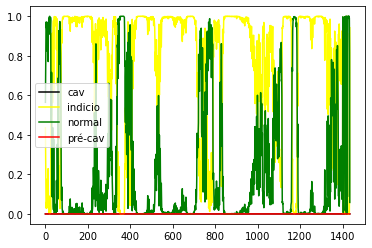

LSTM_DROP_ 9


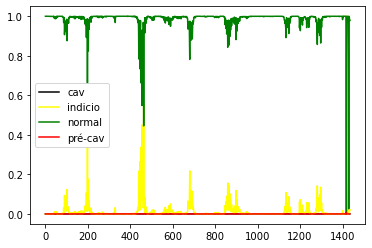

LSTM_DROP_ 10


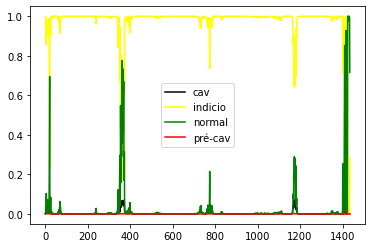

LSTM_DROP_ 11


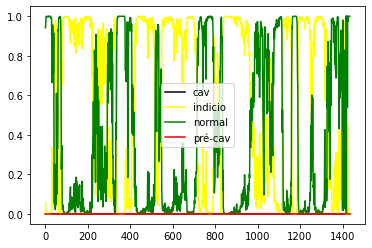

LSTM_DROP_ 12


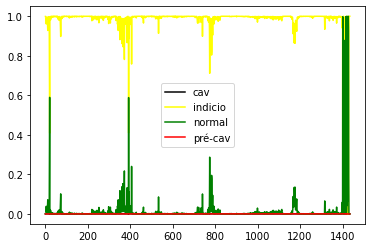

LSTM_DROP_ 13


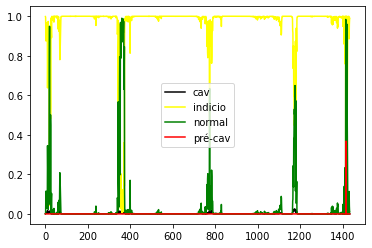

LSTM_DROP_ 14


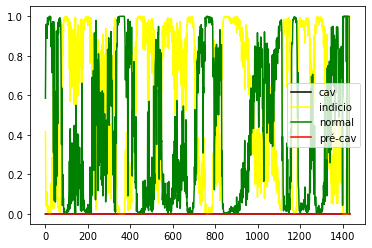

LSTM_DROP_ 15


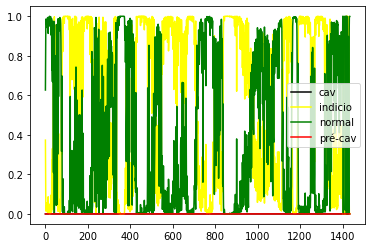

LSTM_DROP_ 16


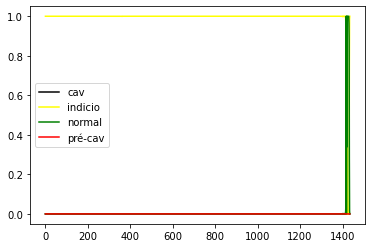

LSTM_DROP_ 17


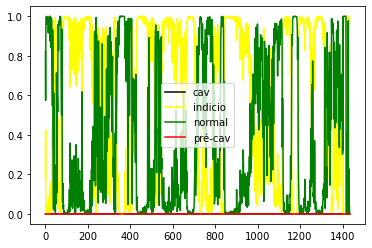

LSTM_DROP_ 18


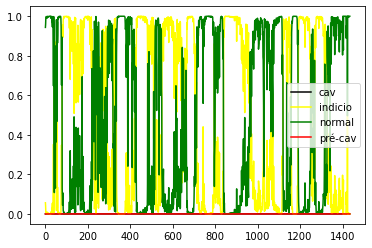

LSTM_DROP_ 19


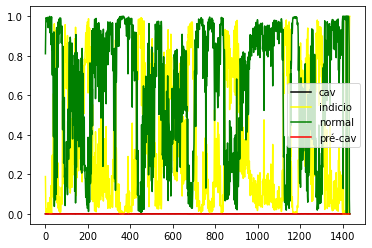

LSTM_DROP_ 20


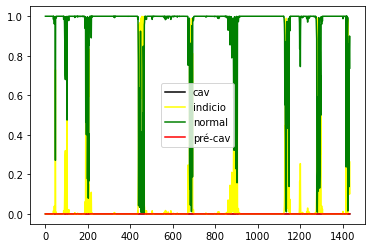

LSTM_DROP_ 21


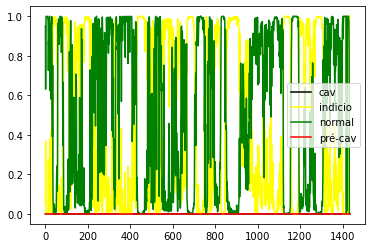

LSTM_DROP_ 22


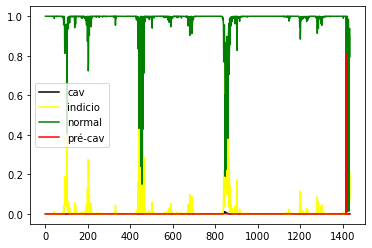

LSTM_DROP_ 23


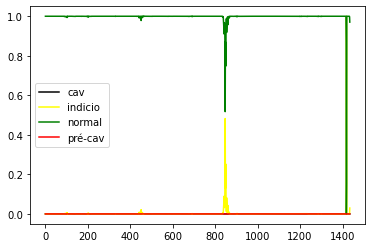

LSTM_DROP_ 24


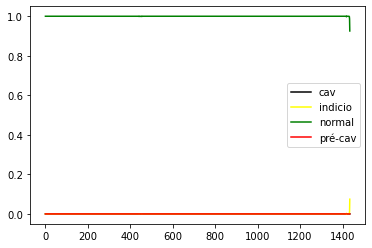

LSTM_DROP_ 25


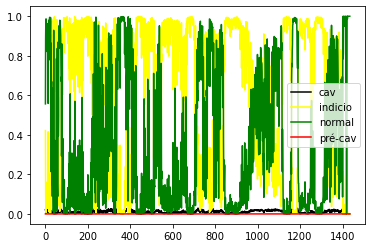

LSTM_DROP_ 26


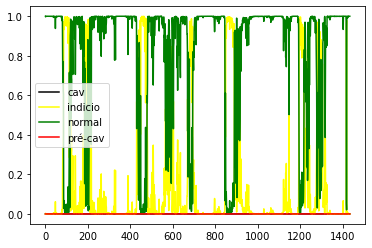

LSTM_DROP_ 27


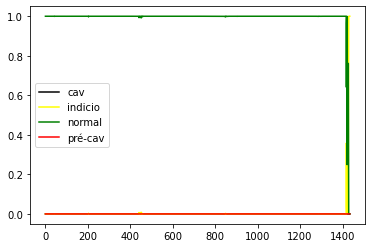

LSTM_DROP_ 28


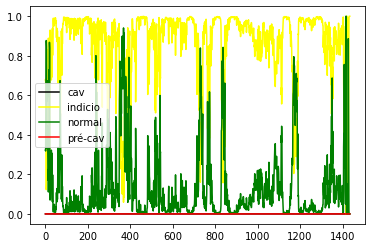

LSTM_DROP_ 29


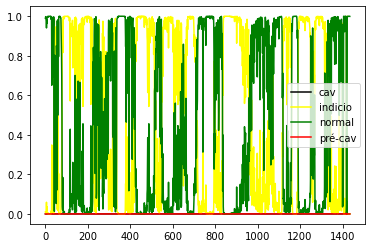

LSTM_DROP_ 30


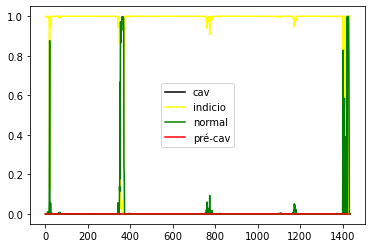

LSTM_DROP_ 31


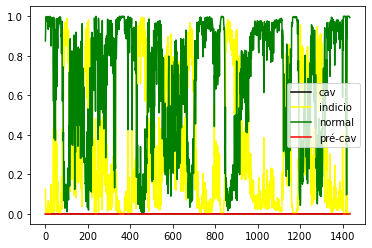

LSTM_DROP_ 32


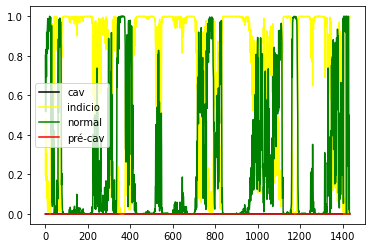

LSTM_DROP_ 33


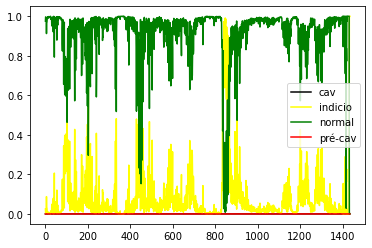

LSTM_DROP_ 34


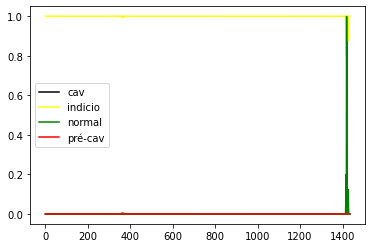

LSTM_DROP_ 35


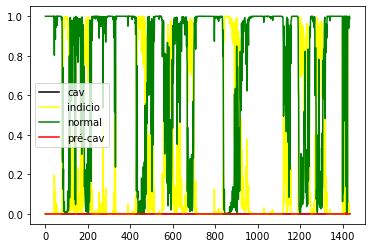

LSTM_DROP_ 36


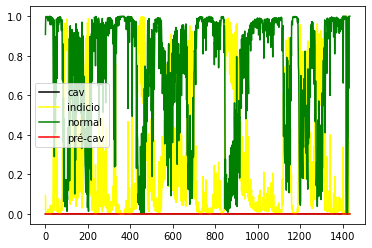

LSTM_DROP_ 37


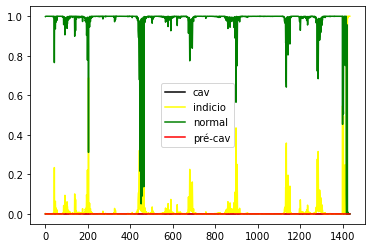

LSTM_DROP_ 38


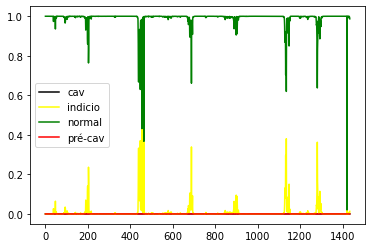

LSTM_DROP_ 39


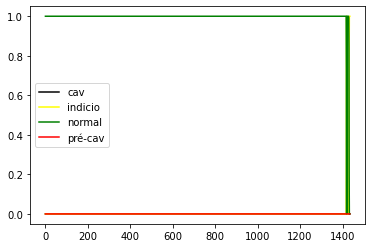

LSTM_DROP_ 40


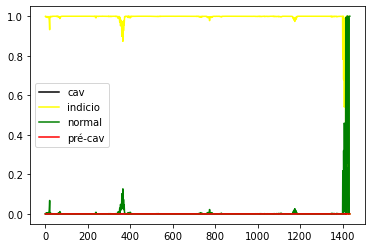

LSTM_DROP_ 41


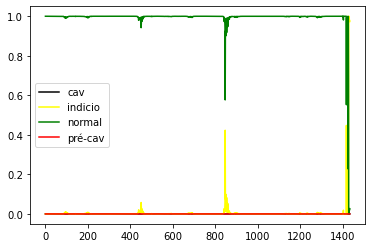

LSTM_DROP_ 42


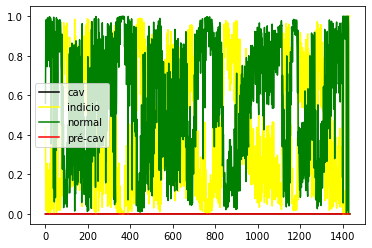

LSTM_DROP_ 43


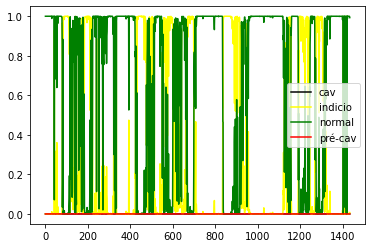

LSTM_DROP_ 44


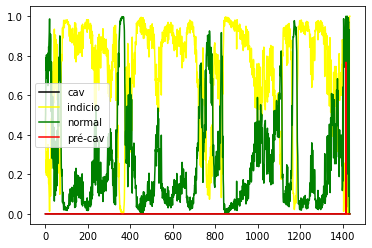

LSTM_DROP_ 45


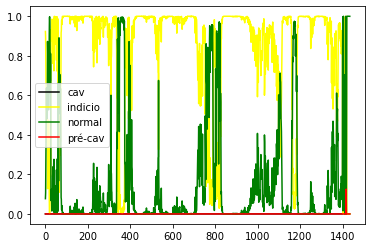

LSTM_DROP_ 46


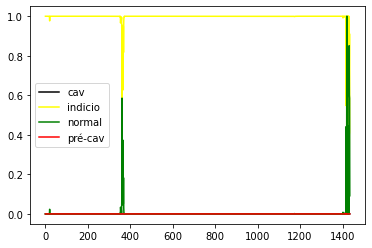

LSTM_DROP_ 47


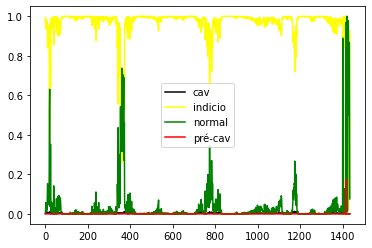

LSTM_DROP_ 48


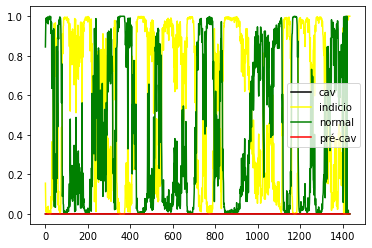

LSTM_DROP_ 49


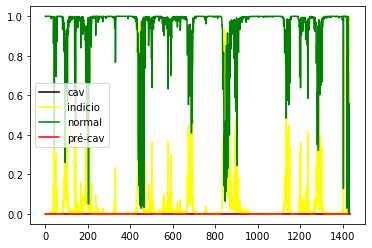

LSTM_DROP_ 50


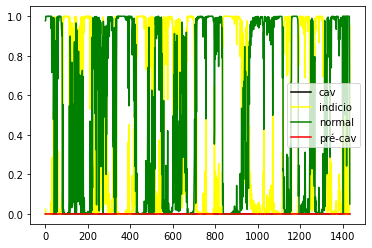

LSTM_DROP_ 51


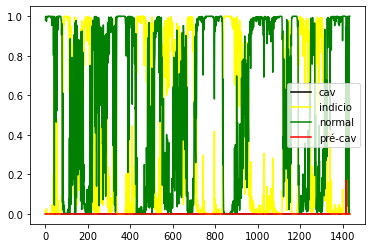

LSTM_DROP_ 52


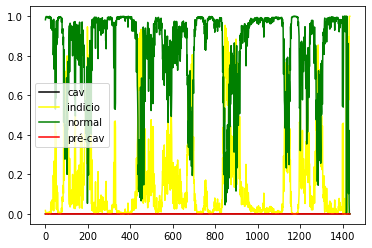

LSTM_DROP_ 53


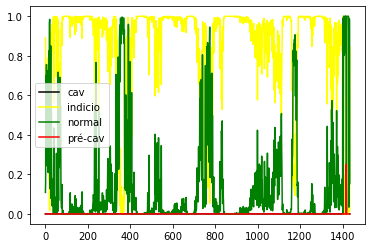

LSTM_DROP_ 54


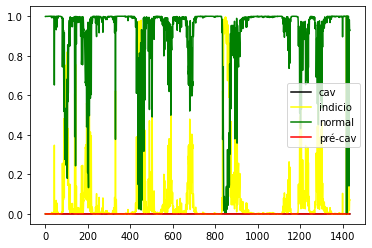

LSTM_DROP_ 55


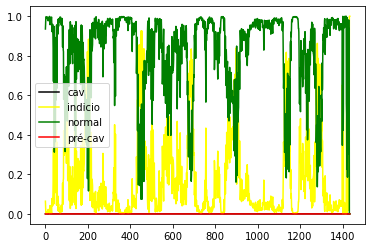

LSTM_DROP_ 56


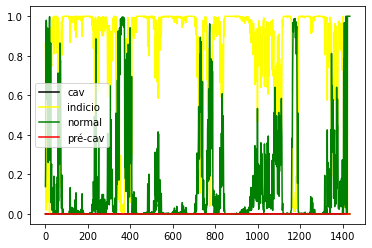

LSTM_DROP_ 57


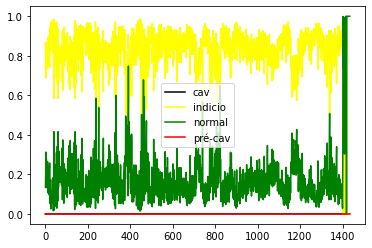

LSTM_DROP_ 58


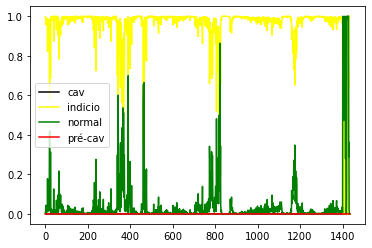

LSTM_DROP_ 59


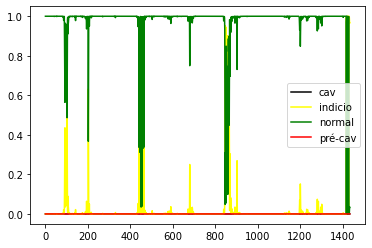

LSTM_DROP_ 60


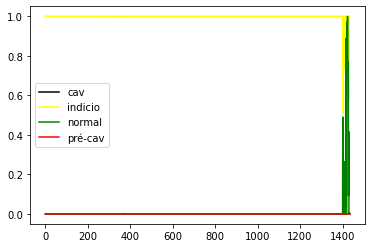

LSTM_DROP_ 61


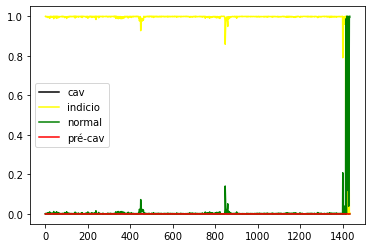

LSTM_DROP_ 62


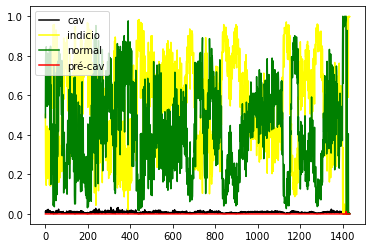

LSTM_DROP_ 63


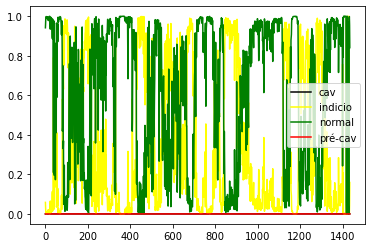

LSTM_DROP_ 64


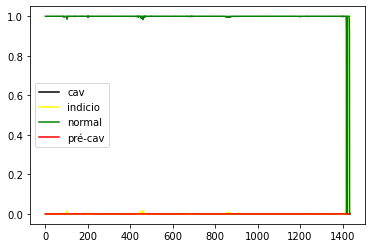

LSTM_DROP_ 65


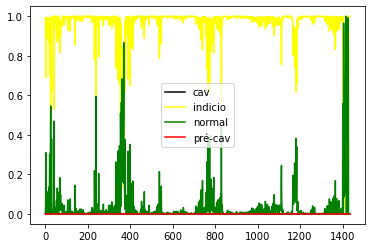

LSTM_DROP_ 66


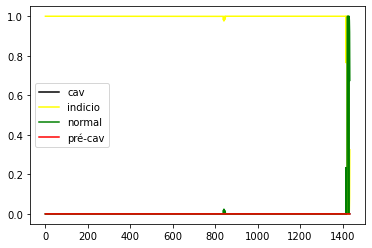

LSTM_DROP_ 67


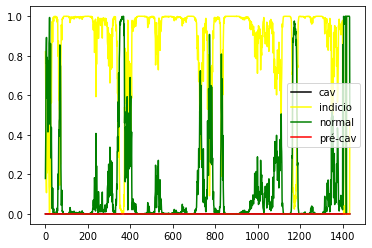

LSTM_DROP_ 68


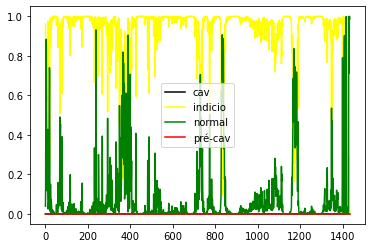

LSTM_DROP_ 69


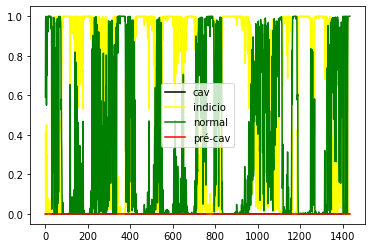

LSTM_DROP_ 70


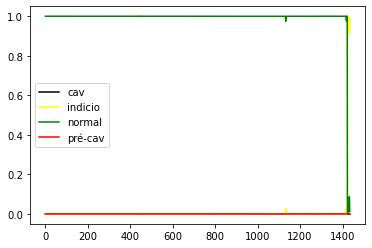

LSTM_DROP_ 71


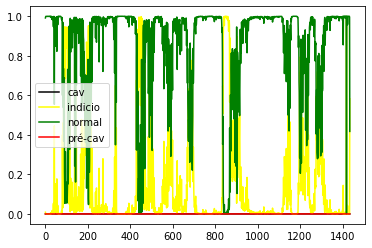

LSTM_DROP_ 72


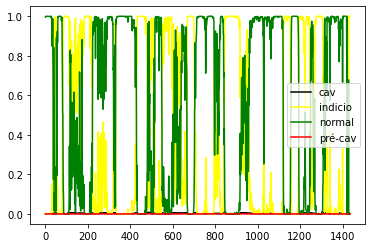

LSTM_DROP_ 73


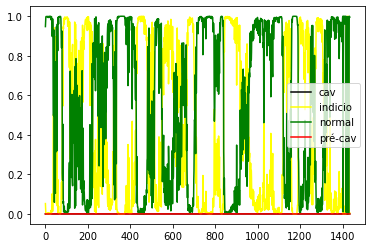

LSTM_DROP_ 74


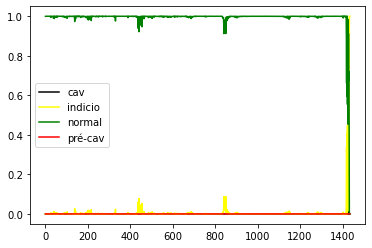

LSTM_DROP_ 75


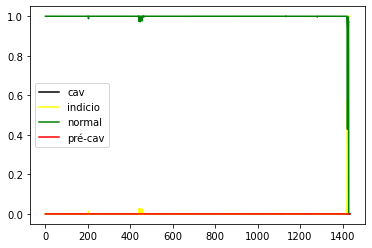

LSTM_DROP_ 76


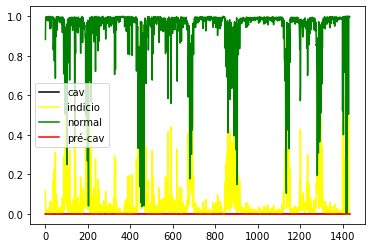

LSTM_DROP_ 77


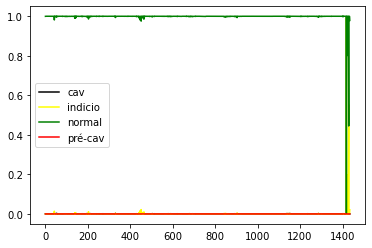

LSTM_DROP_ 78


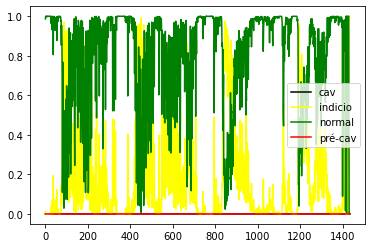

LSTM_DROP_ 79


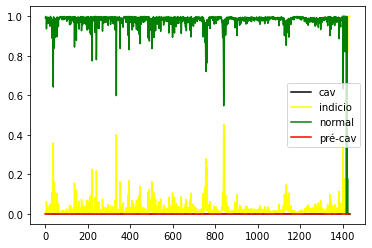

LSTM_DROP_ 80


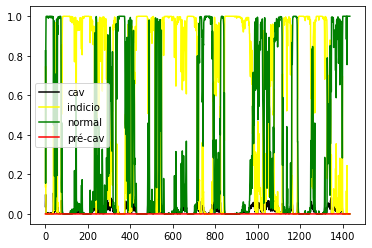

LSTM_DROP_ 81


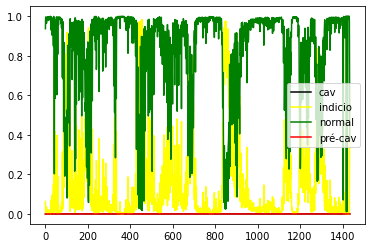

LSTM_DROP_ 82


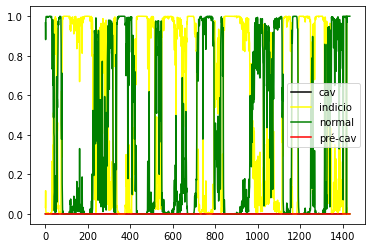

LSTM_DROP_ 83


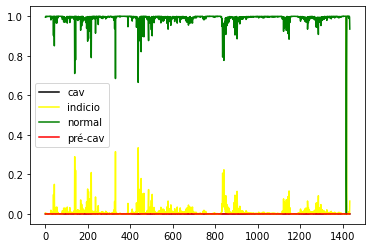

LSTM_DROP_ 84


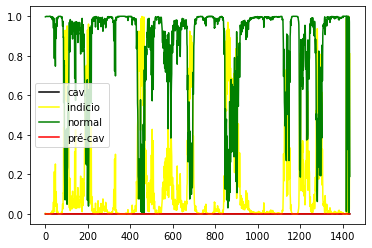

LSTM_DROP_ 85


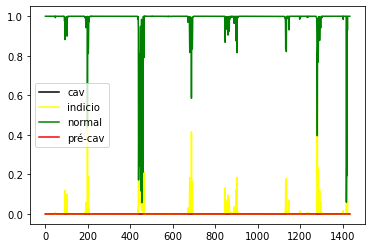

LSTM_DROP_ 86


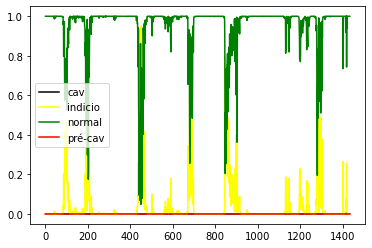

LSTM_DROP_ 87


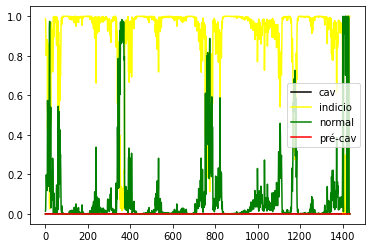

LSTM_DROP_ 88


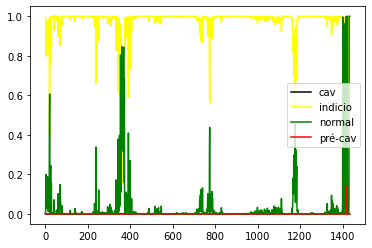

LSTM_DROP_ 89


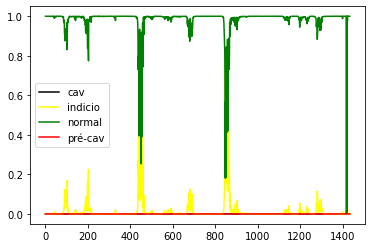

LSTM_DROP_ 90


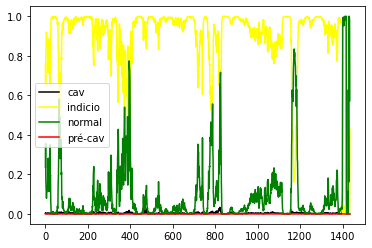

LSTM_DROP_ 91


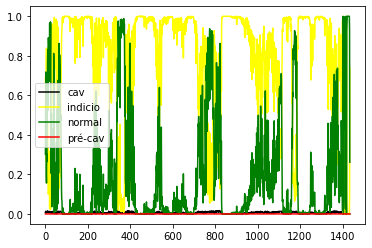

LSTM_DROP_ 92


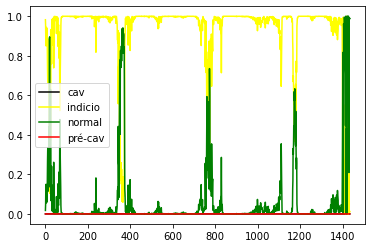

LSTM_DROP_ 93


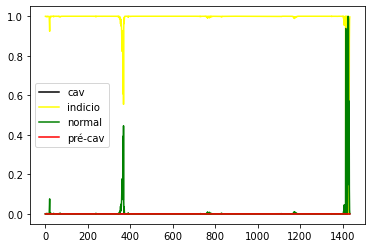

LSTM_DROP_ 94


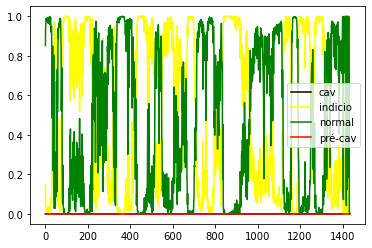

LSTM_DROP_ 95


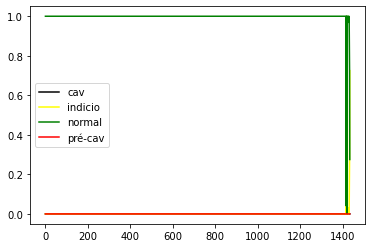

LSTM_DROP_ 96


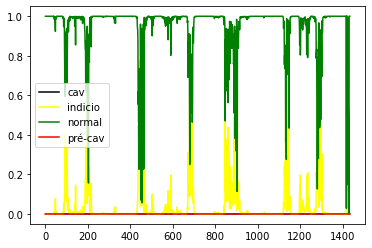

LSTM_DROP_ 97


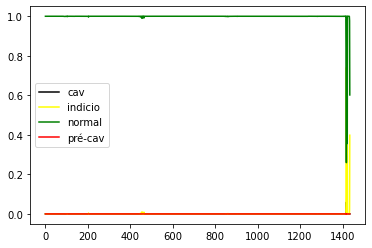

LSTM_DROP_ 98


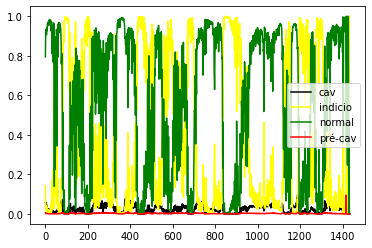

LSTM_DROP_ 99


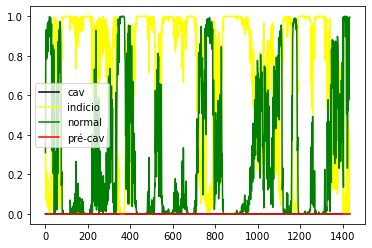

LSTM_2_DROP_ 0


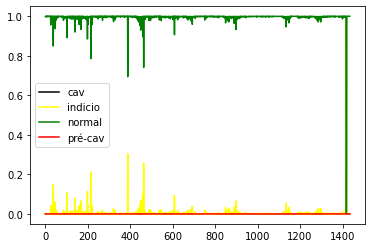

LSTM_2_DROP_ 1


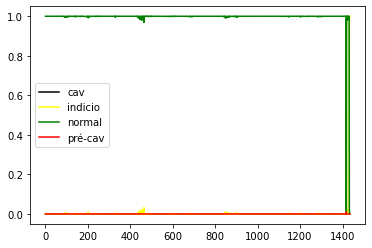

LSTM_2_DROP_ 2


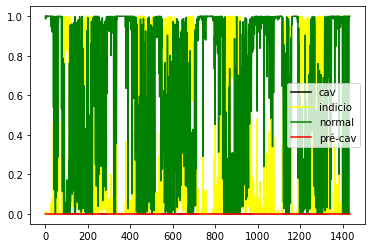

LSTM_2_DROP_ 3


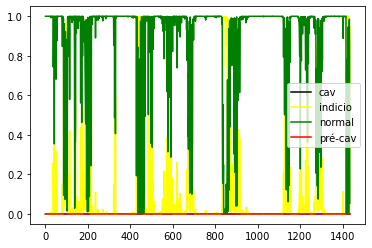

LSTM_2_DROP_ 4


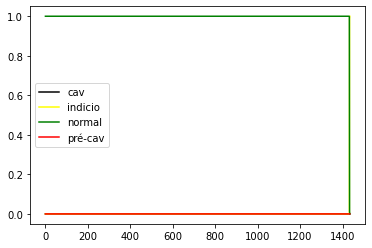

LSTM_2_DROP_ 5


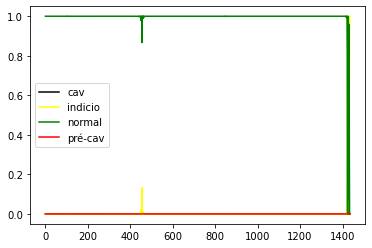

LSTM_2_DROP_ 6


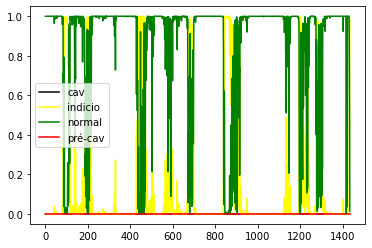

LSTM_2_DROP_ 7


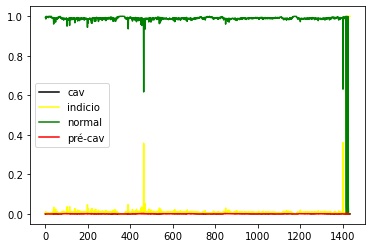

LSTM_2_DROP_ 8


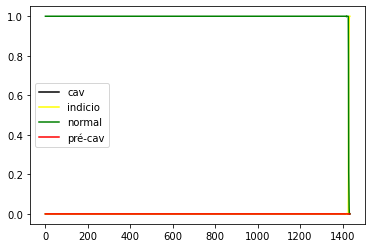

LSTM_2_DROP_ 9


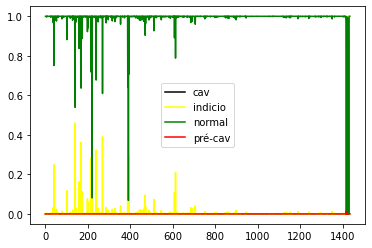

LSTM_2_DROP_ 10


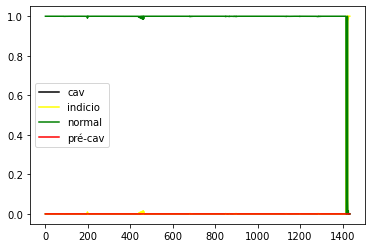

LSTM_2_DROP_ 11


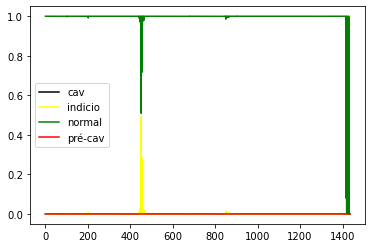

LSTM_2_DROP_ 12


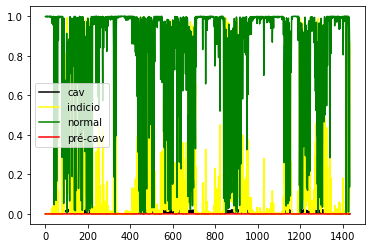

LSTM_2_DROP_ 13


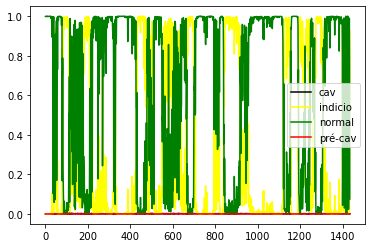

LSTM_2_DROP_ 14


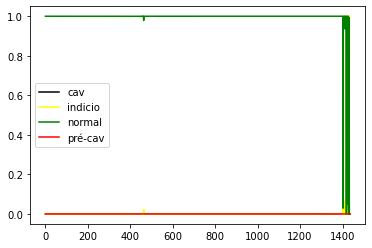

LSTM_2_DROP_ 15


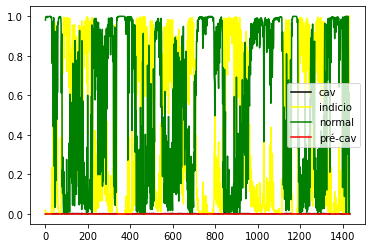

LSTM_2_DROP_ 16


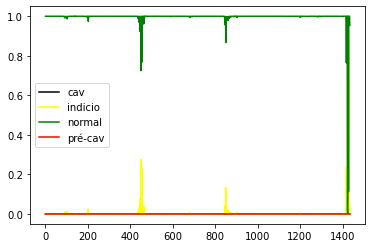

LSTM_2_DROP_ 17


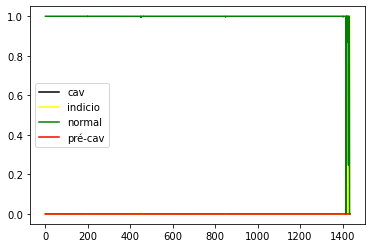

LSTM_2_DROP_ 18


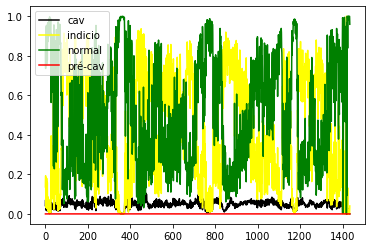

LSTM_2_DROP_ 19


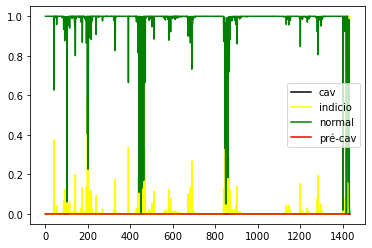

LSTM_2_DROP_ 20


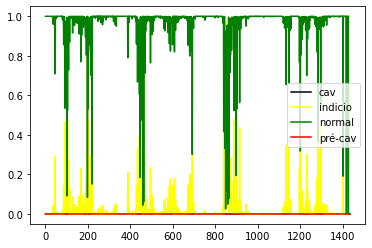

LSTM_2_DROP_ 21


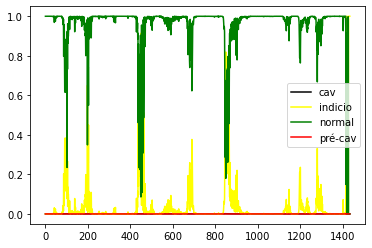

LSTM_2_DROP_ 22


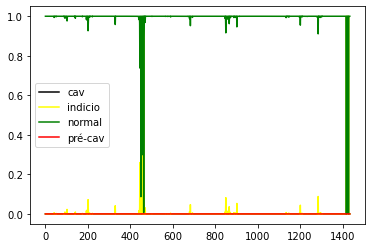

LSTM_2_DROP_ 23


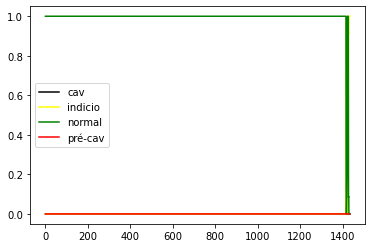

LSTM_2_DROP_ 24


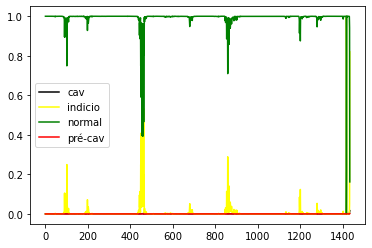

LSTM_2_DROP_ 25


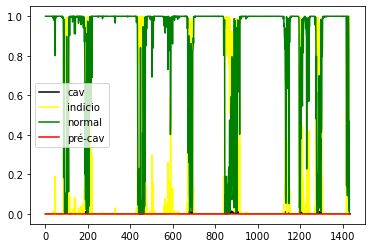

LSTM_2_DROP_ 26


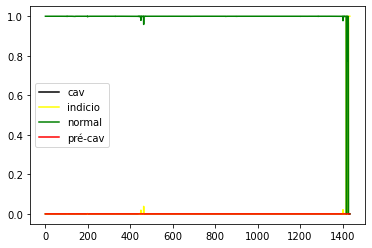

LSTM_2_DROP_ 27


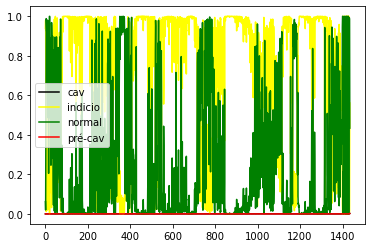

LSTM_2_DROP_ 28


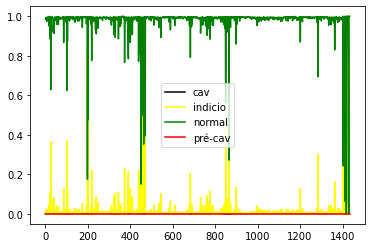

LSTM_2_DROP_ 29


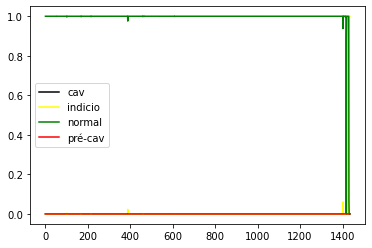

LSTM_2_DROP_ 30


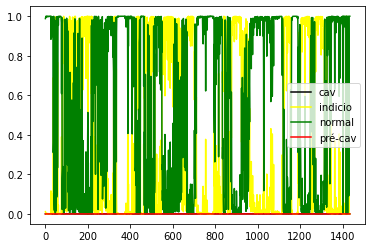

LSTM_2_DROP_ 31


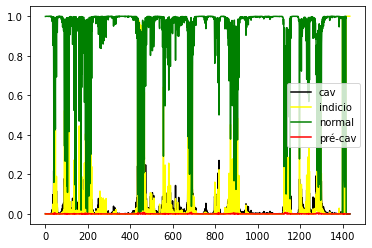

LSTM_2_DROP_ 32


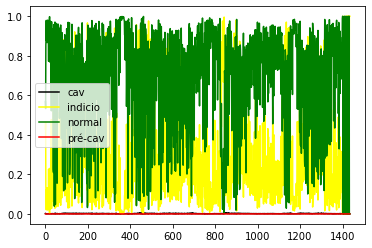

LSTM_2_DROP_ 33


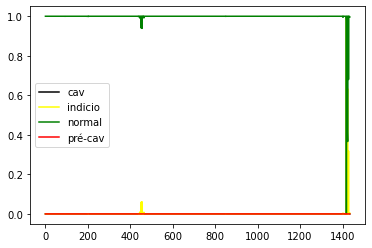

LSTM_2_DROP_ 34


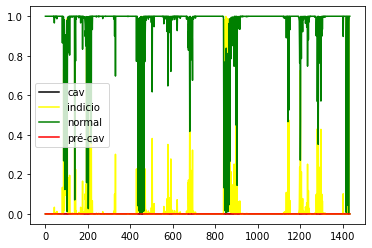

LSTM_2_DROP_ 35


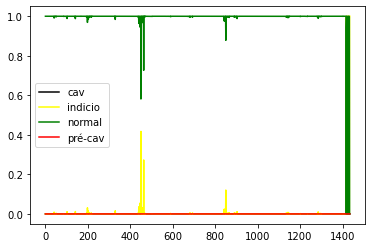

LSTM_2_DROP_ 36


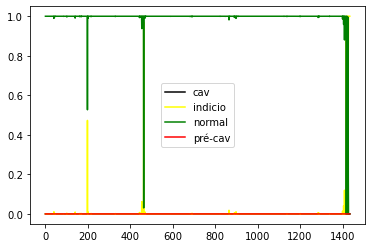

LSTM_2_DROP_ 37


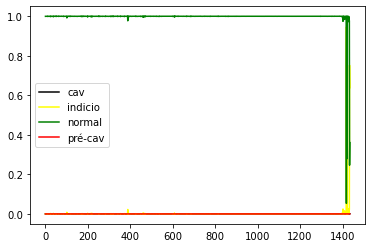

LSTM_2_DROP_ 38


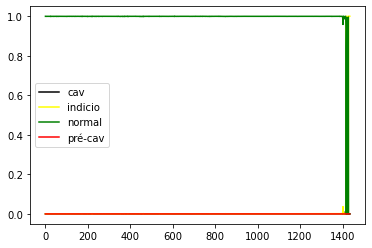

LSTM_2_DROP_ 39


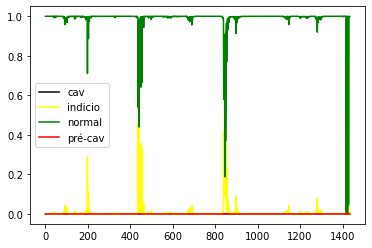

LSTM_2_DROP_ 40


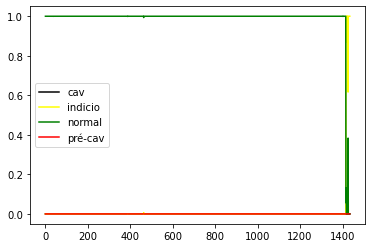

LSTM_2_DROP_ 41


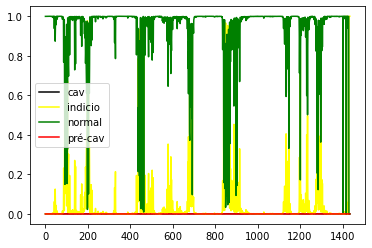

LSTM_2_DROP_ 42


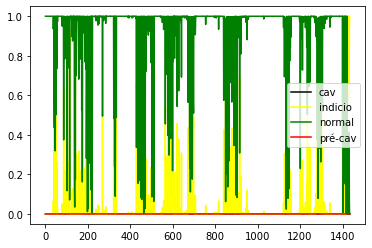

LSTM_2_DROP_ 43


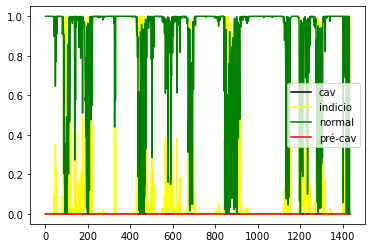

LSTM_2_DROP_ 44


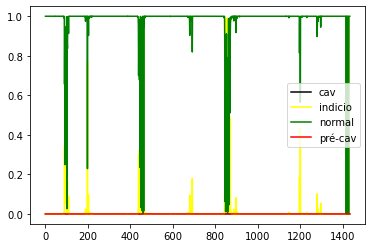

LSTM_2_DROP_ 45


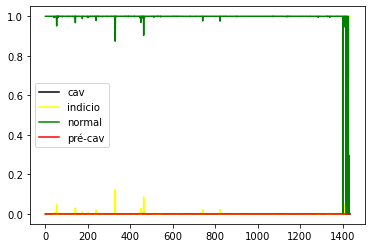

LSTM_2_DROP_ 46


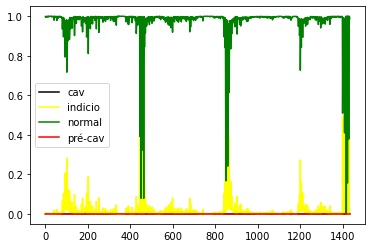

LSTM_2_DROP_ 47


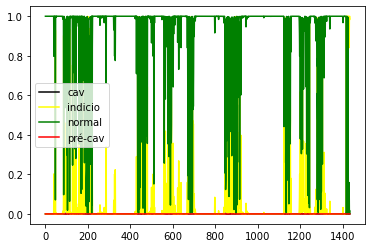

LSTM_2_DROP_ 48


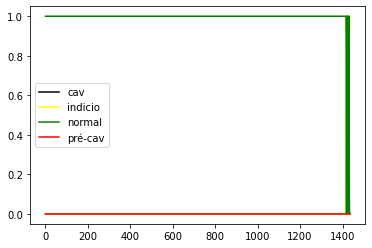

LSTM_2_DROP_ 49


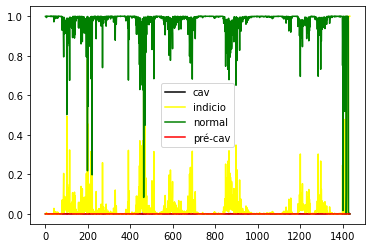

LSTM_2_DROP_ 50


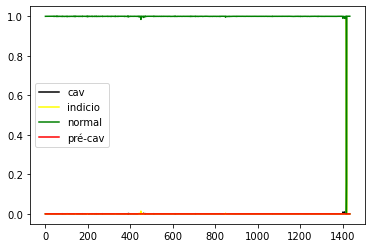

LSTM_2_DROP_ 51


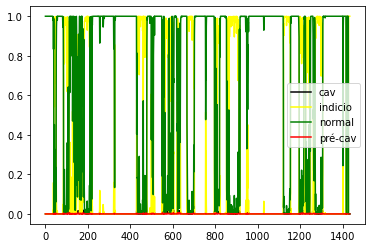

LSTM_2_DROP_ 52


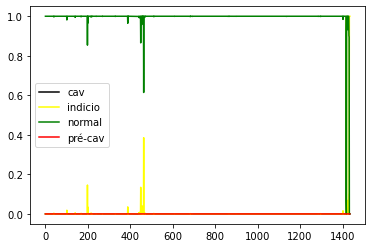

LSTM_2_DROP_ 53


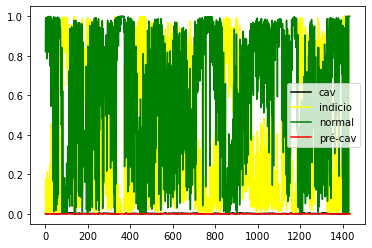

LSTM_2_DROP_ 54


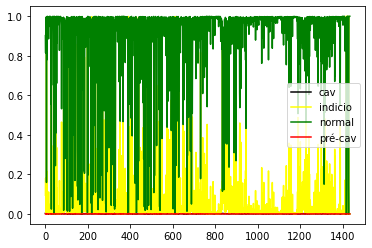

LSTM_2_DROP_ 55


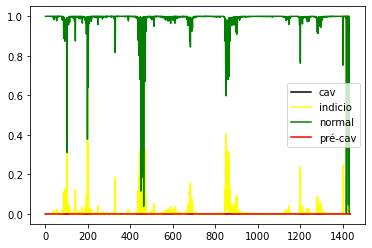

LSTM_2_DROP_ 56


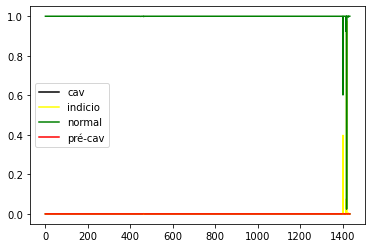

LSTM_2_DROP_ 57


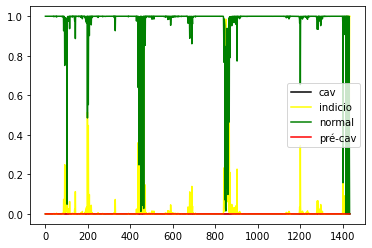

LSTM_2_DROP_ 58


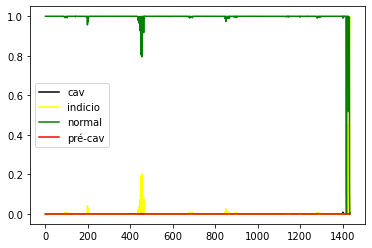

LSTM_2_DROP_ 59


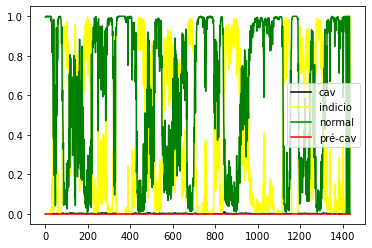

LSTM_2_DROP_ 60


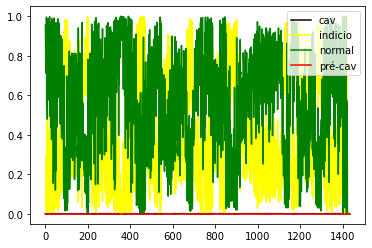

LSTM_2_DROP_ 61


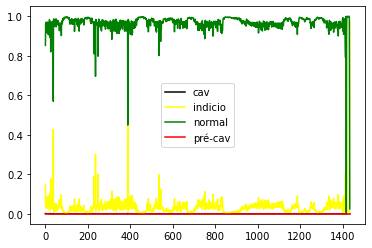

LSTM_2_DROP_ 62


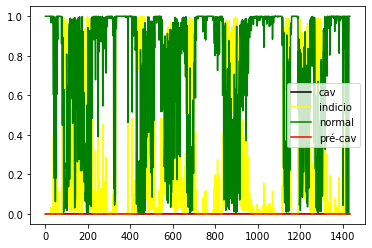

LSTM_2_DROP_ 63


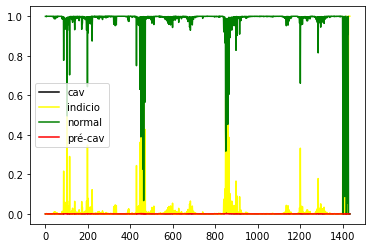

LSTM_2_DROP_ 64


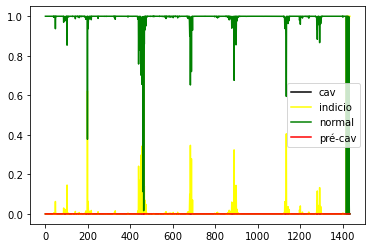

LSTM_2_DROP_ 65


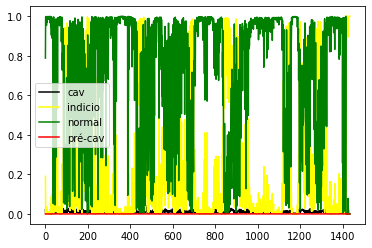

LSTM_2_DROP_ 66


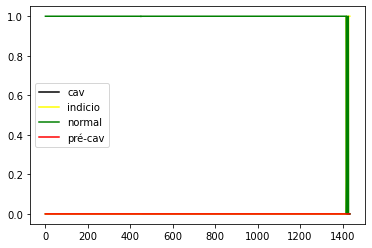

LSTM_2_DROP_ 67


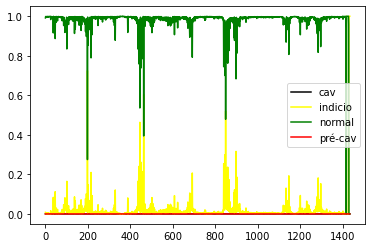

LSTM_2_DROP_ 68


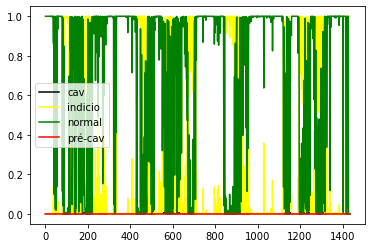

LSTM_2_DROP_ 69


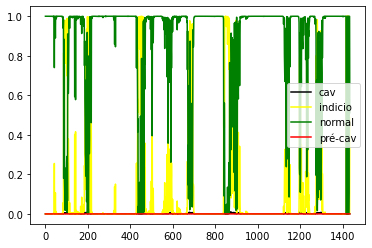

LSTM_2_DROP_ 70


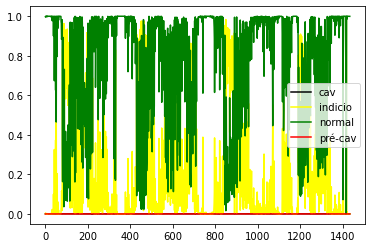

LSTM_2_DROP_ 71


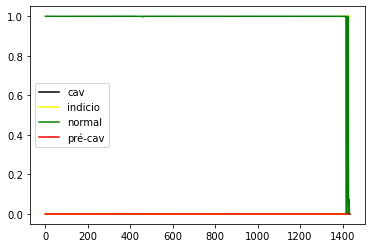

LSTM_2_DROP_ 72


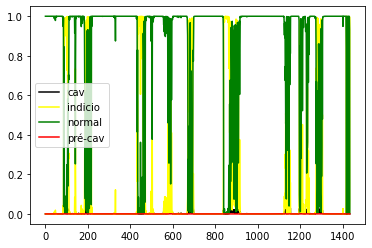

LSTM_2_DROP_ 73


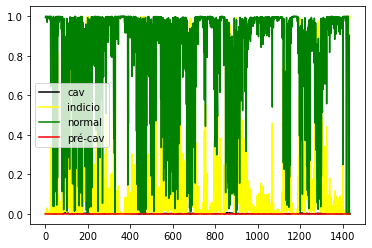

LSTM_2_DROP_ 74


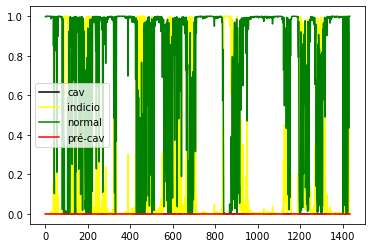

LSTM_2_DROP_ 75


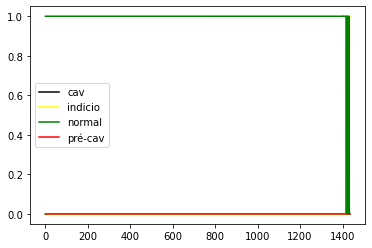

LSTM_2_DROP_ 76


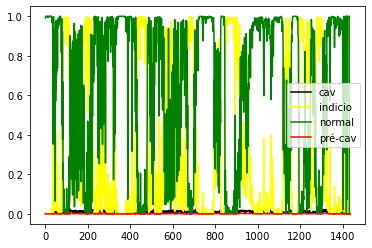

LSTM_2_DROP_ 77


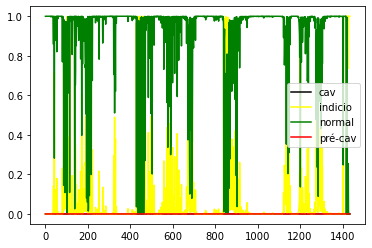

LSTM_2_DROP_ 78


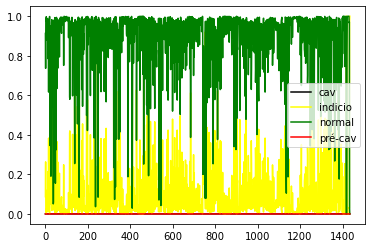

LSTM_2_DROP_ 79


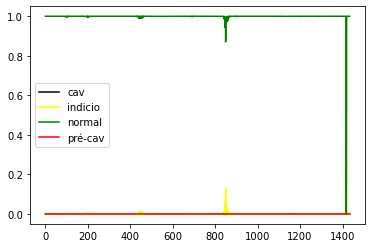

LSTM_2_DROP_ 80


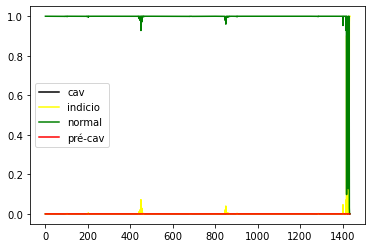

LSTM_2_DROP_ 81


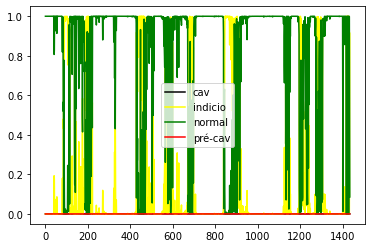

LSTM_2_DROP_ 82


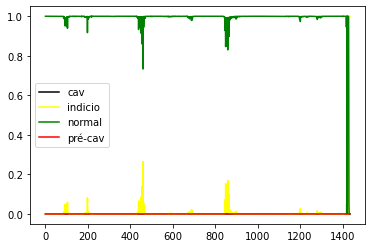

LSTM_2_DROP_ 83


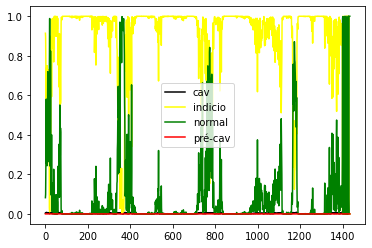

LSTM_2_DROP_ 84


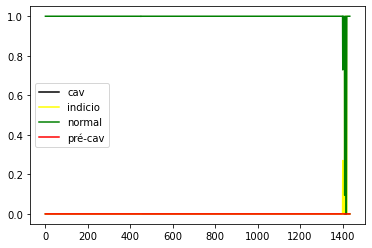

LSTM_2_DROP_ 85


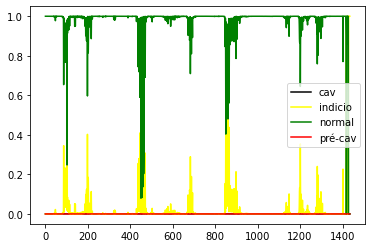

LSTM_2_DROP_ 86


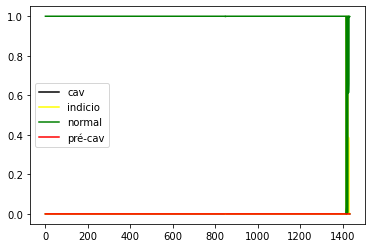

LSTM_2_DROP_ 87


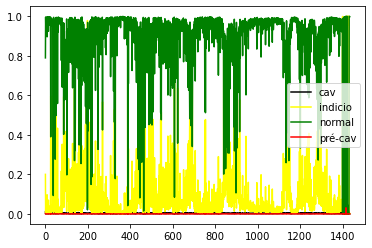

LSTM_2_DROP_ 88


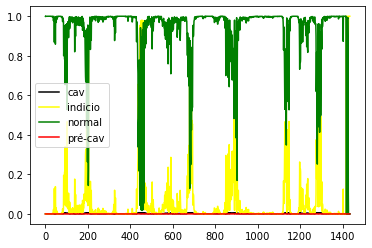

LSTM_2_DROP_ 89


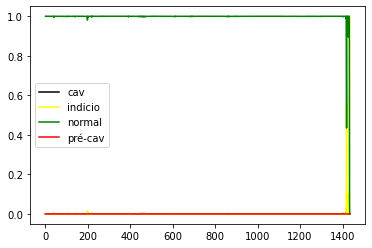

LSTM_2_DROP_ 90


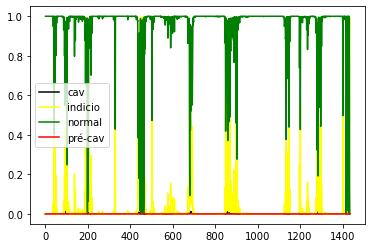

LSTM_2_DROP_ 91


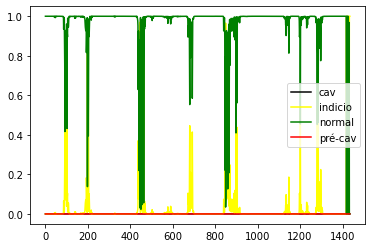

LSTM_2_DROP_ 92


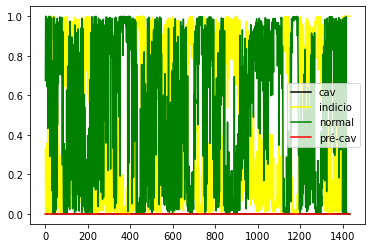

LSTM_2_DROP_ 93


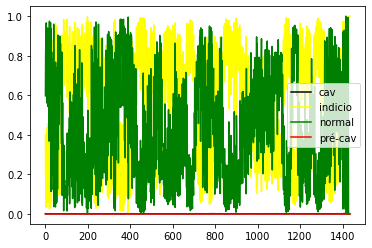

LSTM_2_DROP_ 94


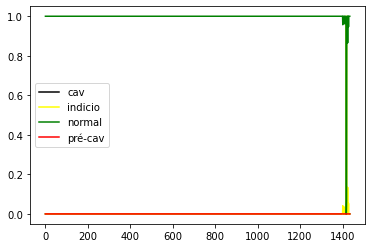

LSTM_2_DROP_ 95


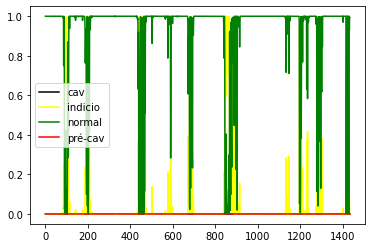

LSTM_2_DROP_ 96


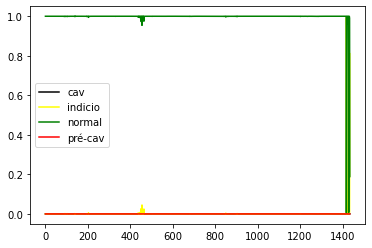

LSTM_2_DROP_ 97


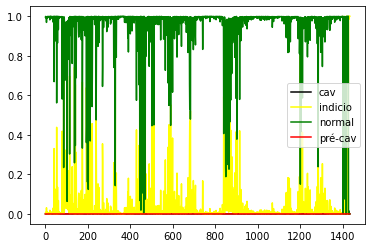

LSTM_2_DROP_ 98


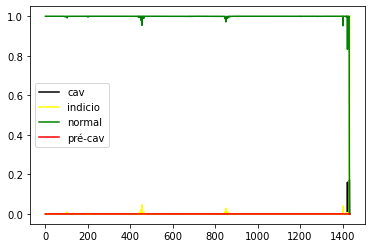

LSTM_2_DROP_ 99


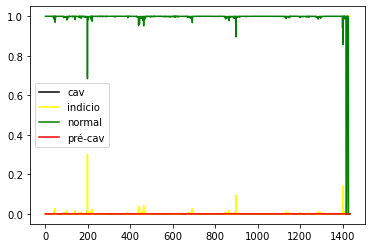

CNN_DROP_ 0


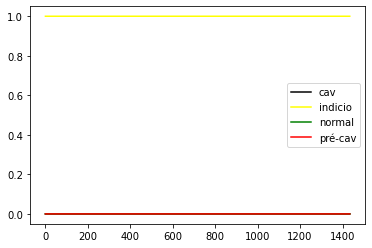

CNN_DROP_ 1


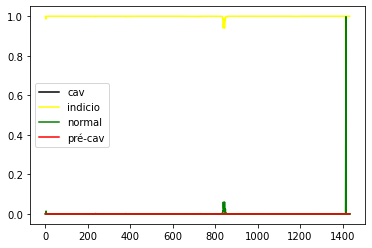

CNN_DROP_ 2


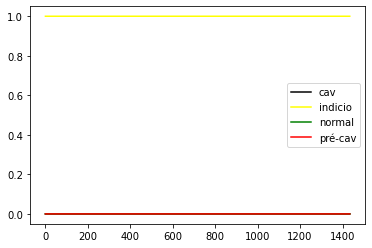

CNN_DROP_ 3


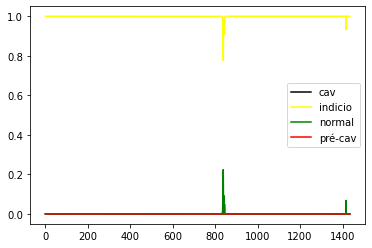

CNN_DROP_ 4


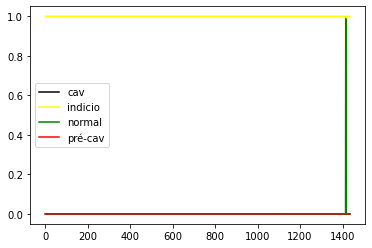

CNN_DROP_ 5


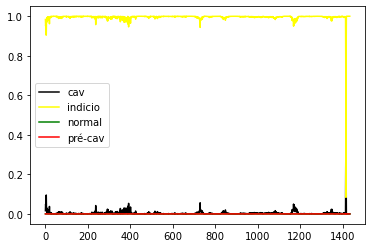

CNN_DROP_ 6


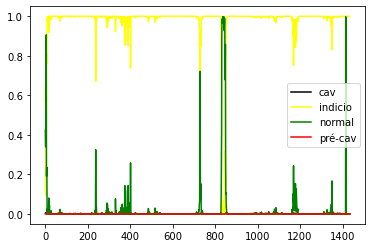

CNN_DROP_ 7


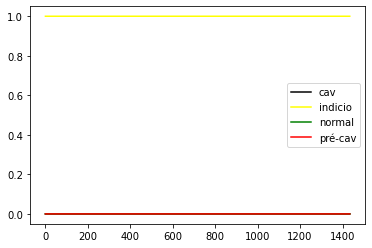

CNN_DROP_ 8


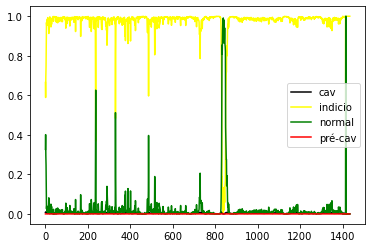

CNN_DROP_ 9


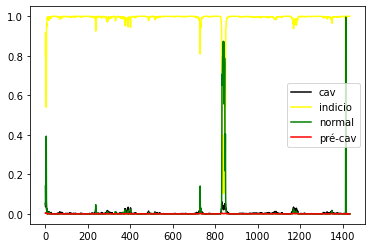

CNN_DROP_ 10


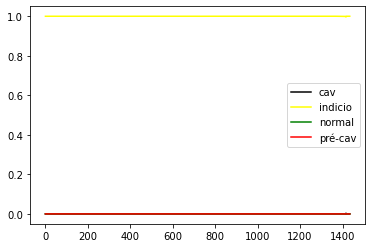

CNN_DROP_ 11


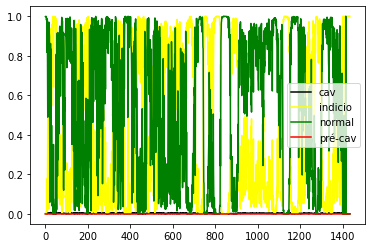

CNN_DROP_ 12


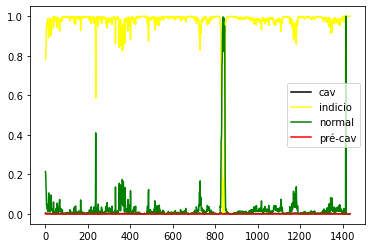

CNN_DROP_ 13


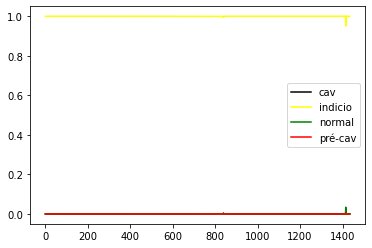

CNN_DROP_ 14


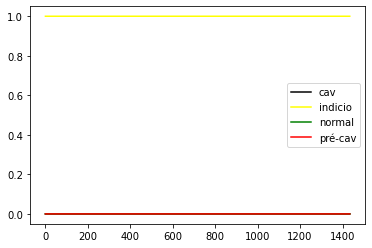

CNN_DROP_ 15


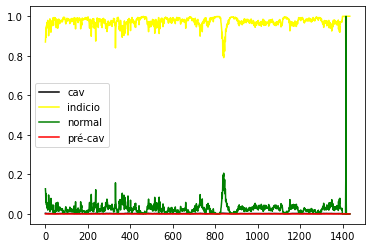

CNN_DROP_ 16


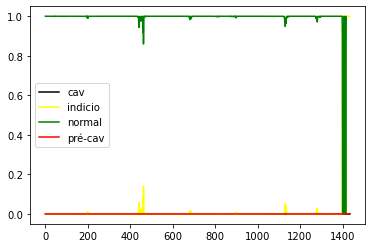

CNN_DROP_ 17


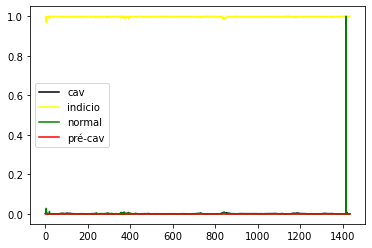

CNN_DROP_ 18


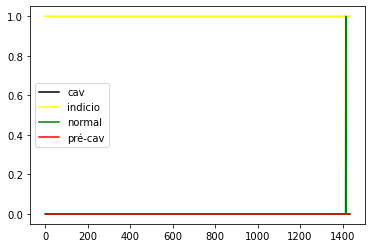

CNN_DROP_ 19


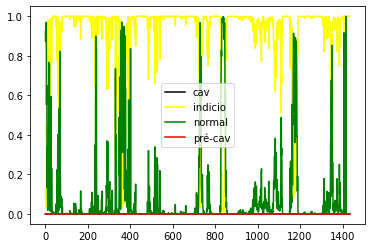

CNN_DROP_ 20


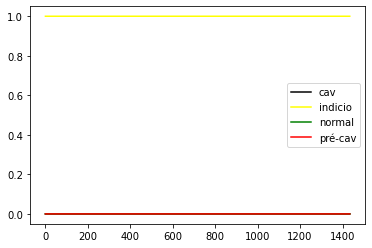

CNN_DROP_ 21


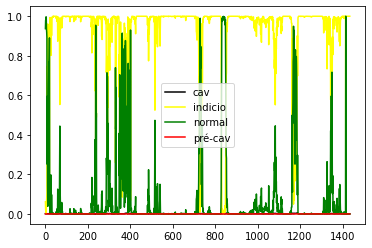

CNN_DROP_ 22


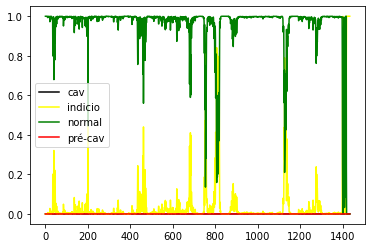

CNN_DROP_ 23


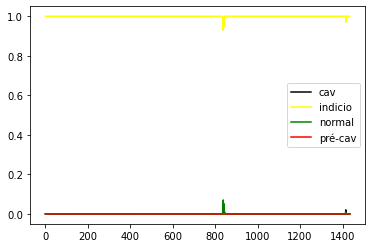

CNN_DROP_ 24


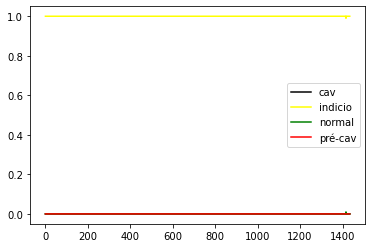

CNN_DROP_ 25


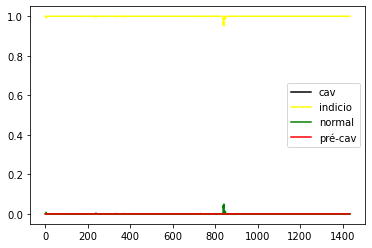

CNN_DROP_ 26


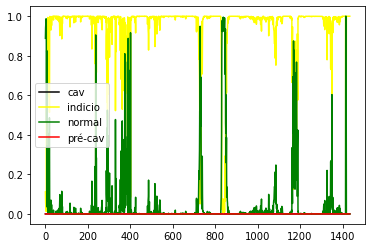

CNN_DROP_ 27


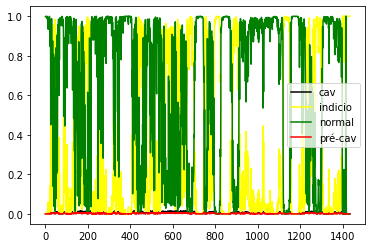

CNN_DROP_ 28


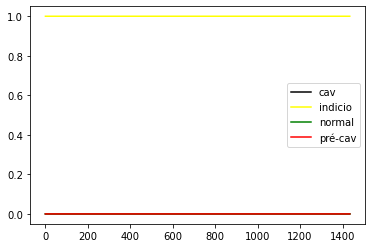

CNN_DROP_ 29


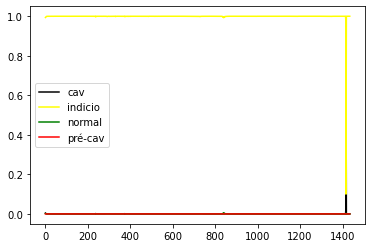

CNN_DROP_ 30


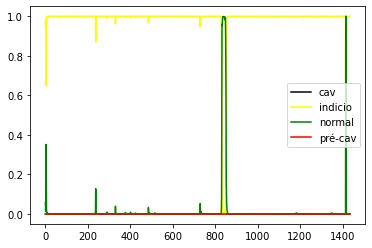

CNN_DROP_ 31


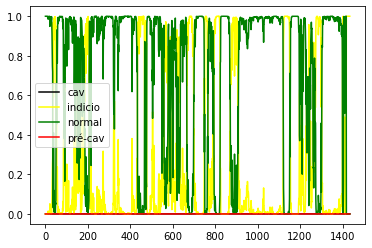

CNN_DROP_ 32


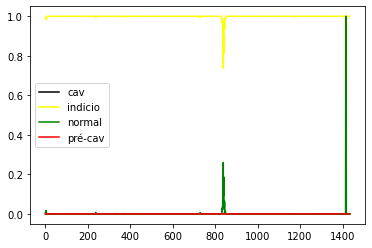

CNN_DROP_ 33


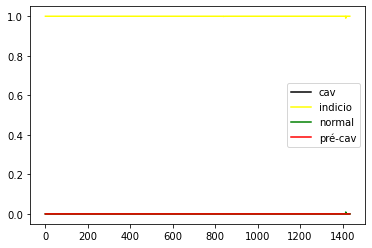

CNN_DROP_ 34


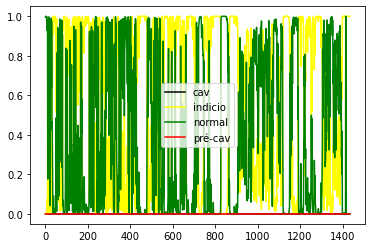

CNN_DROP_ 35


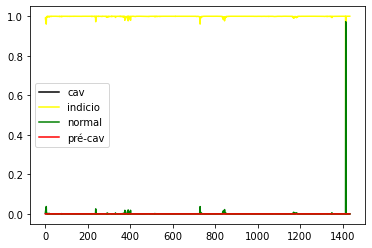

CNN_DROP_ 36


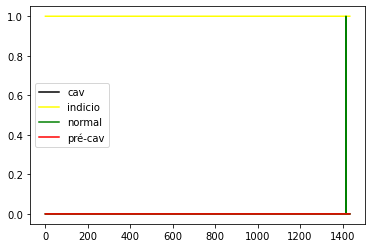

CNN_DROP_ 37


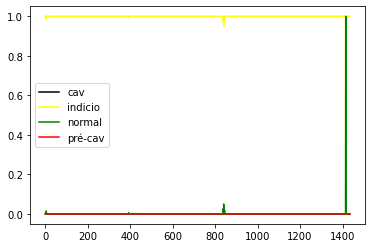

CNN_DROP_ 38


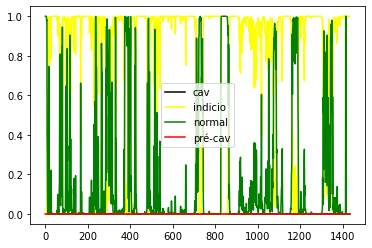

CNN_DROP_ 39


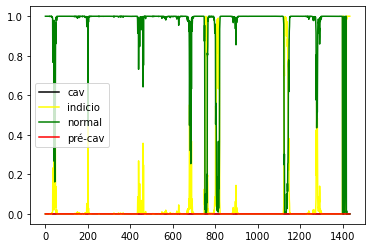

CNN_DROP_ 40


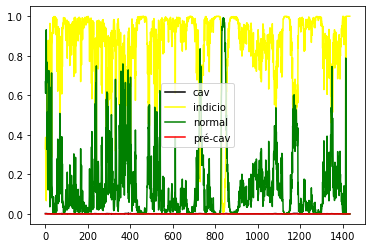

CNN_DROP_ 41


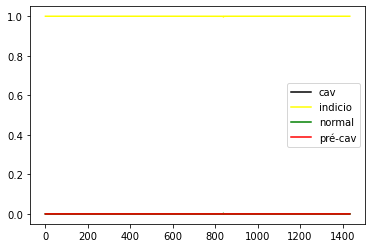

CNN_DROP_ 42


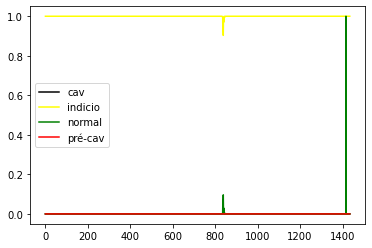

CNN_DROP_ 43


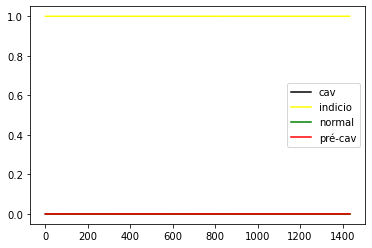

CNN_DROP_ 44


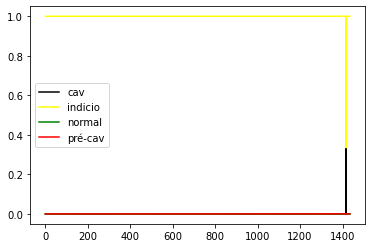

CNN_DROP_ 45


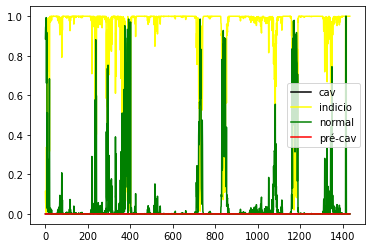

CNN_DROP_ 46


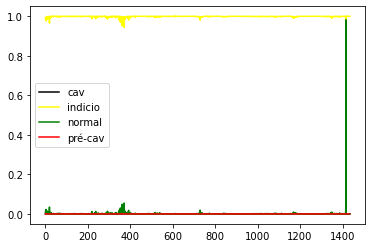

CNN_DROP_ 47


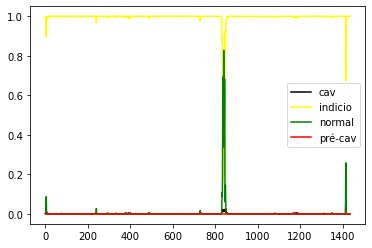

CNN_DROP_ 48


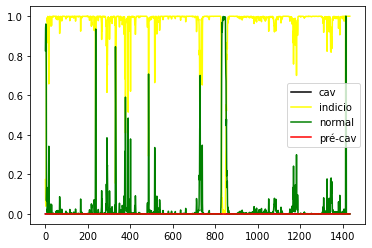

CNN_DROP_ 49


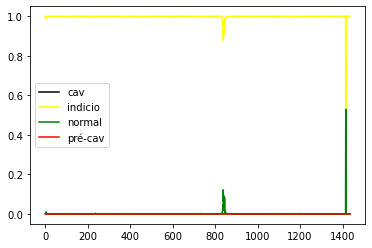

CNN_DROP_ 50


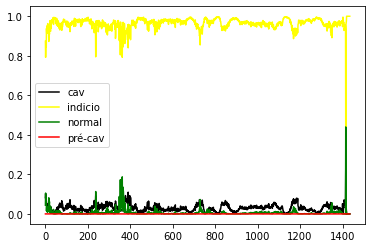

CNN_DROP_ 51


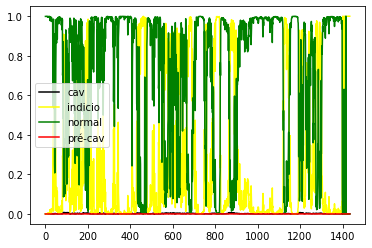

CNN_DROP_ 52


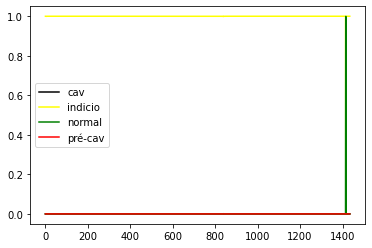

CNN_DROP_ 53


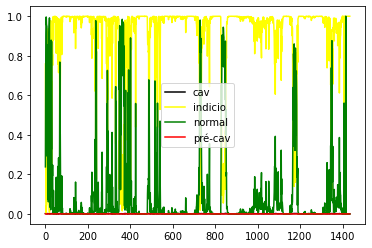

CNN_DROP_ 54


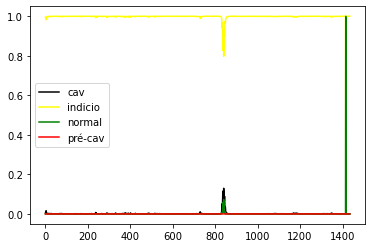

CNN_DROP_ 55


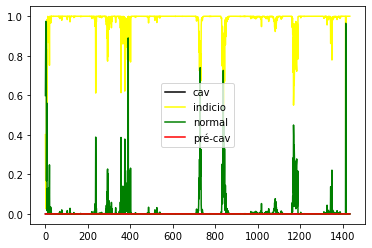

CNN_DROP_ 56


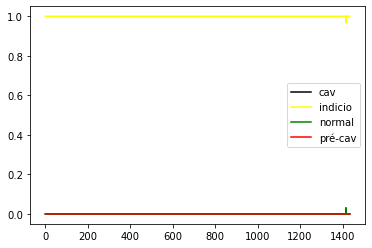

CNN_DROP_ 57


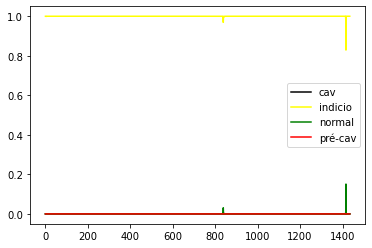

CNN_DROP_ 58


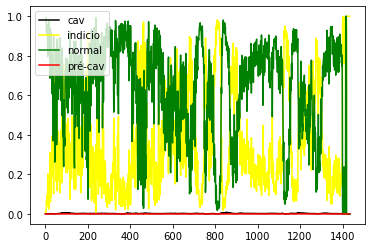

CNN_DROP_ 59


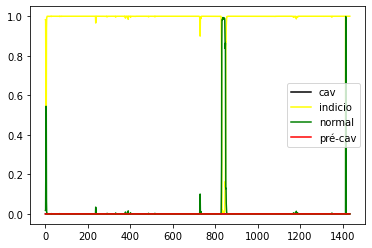

CNN_DROP_ 60


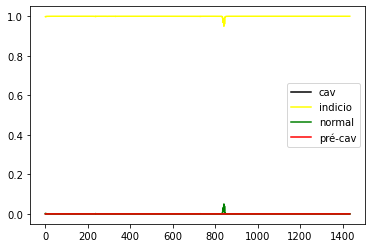

CNN_DROP_ 61


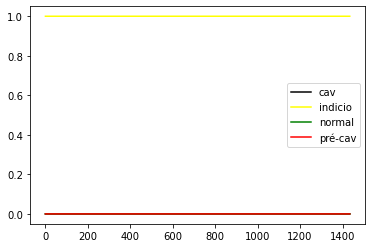

CNN_DROP_ 62


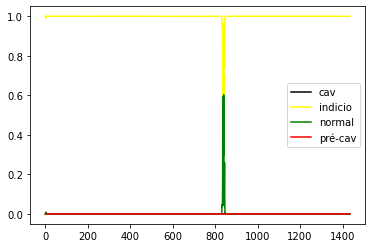

CNN_DROP_ 63


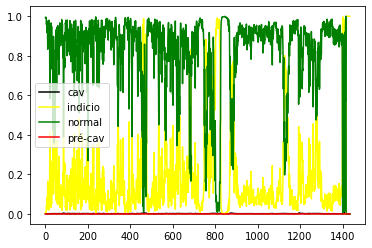

CNN_DROP_ 64


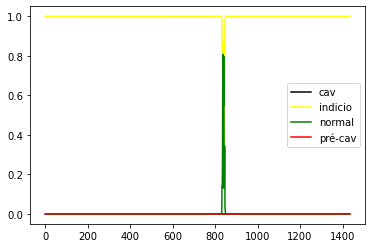

CNN_DROP_ 65


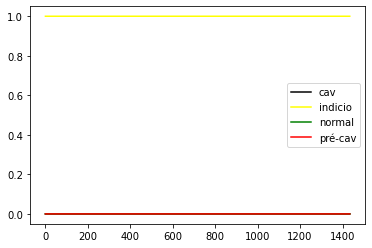

CNN_DROP_ 66


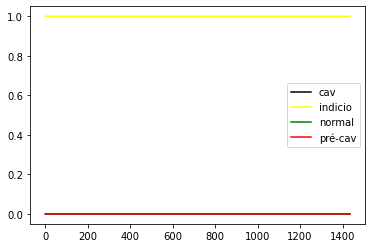

CNN_DROP_ 67


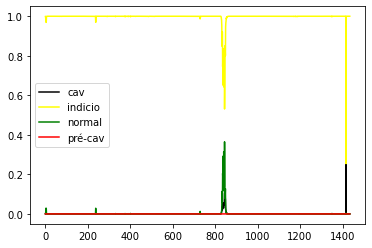

CNN_DROP_ 68


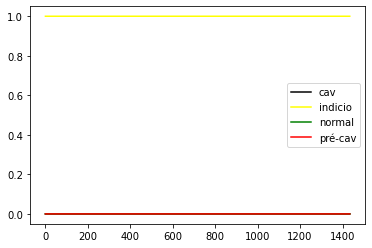

CNN_DROP_ 69


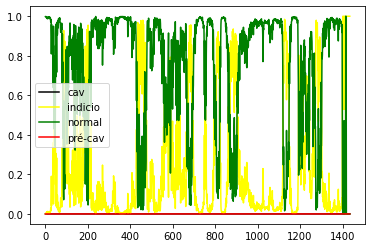

CNN_DROP_ 70


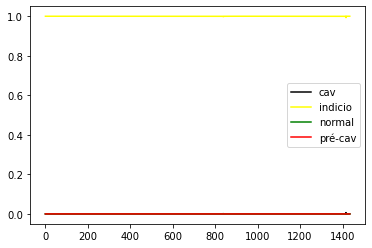

CNN_DROP_ 71


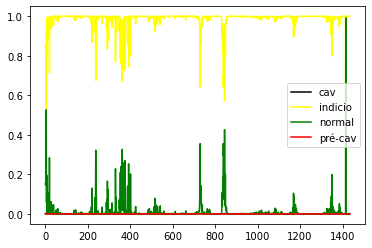

CNN_DROP_ 72


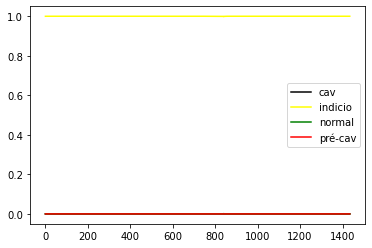

CNN_DROP_ 73


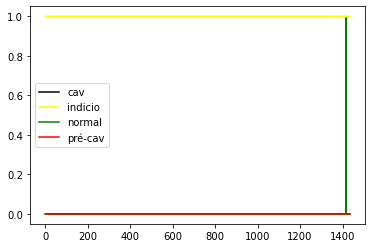

CNN_DROP_ 74


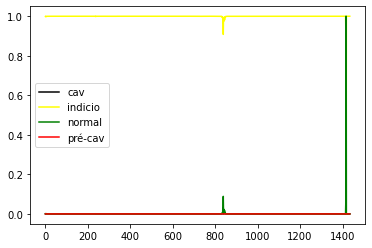

CNN_DROP_ 75


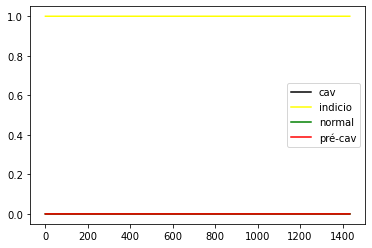

CNN_DROP_ 76


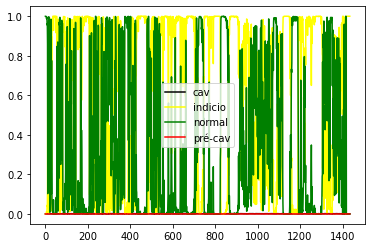

CNN_DROP_ 77


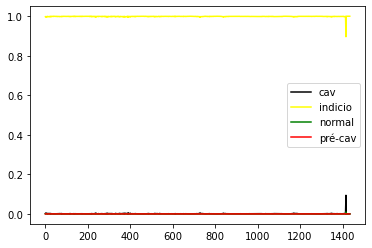

CNN_DROP_ 78


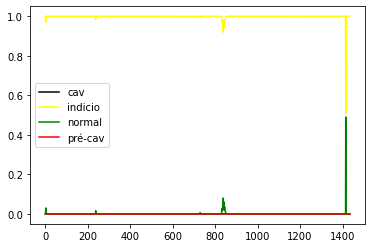

CNN_DROP_ 79


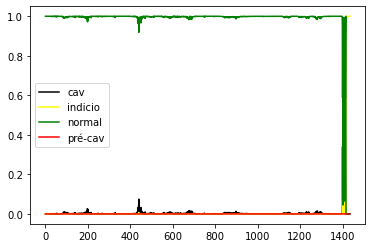

CNN_DROP_ 80


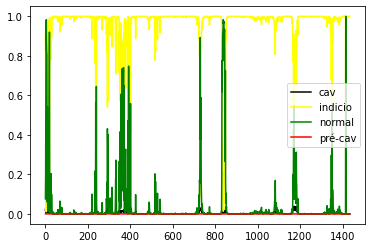

CNN_DROP_ 81


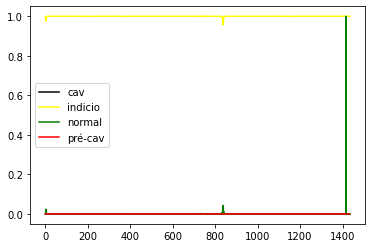

CNN_DROP_ 82


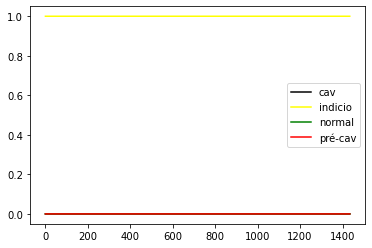

CNN_DROP_ 83


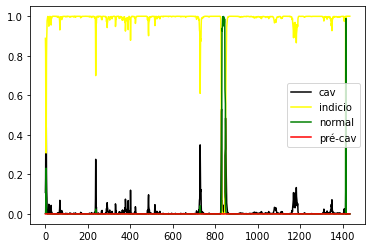

CNN_DROP_ 84


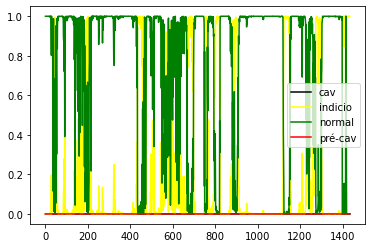

CNN_DROP_ 85


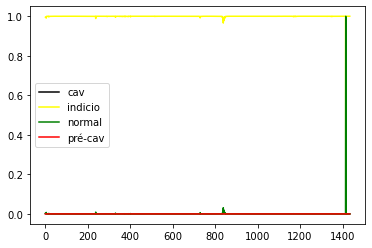

CNN_DROP_ 86


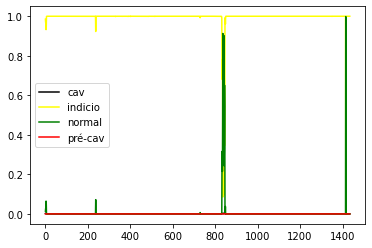

CNN_DROP_ 87


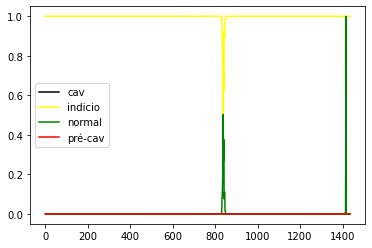

CNN_DROP_ 88


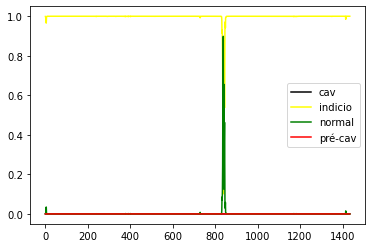

CNN_DROP_ 89


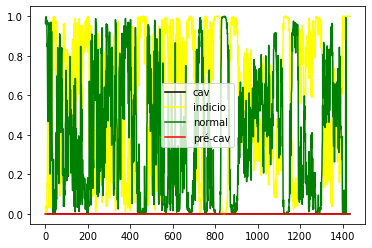

CNN_DROP_ 90


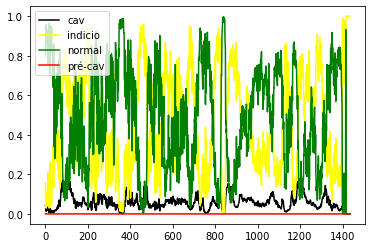

CNN_DROP_ 91


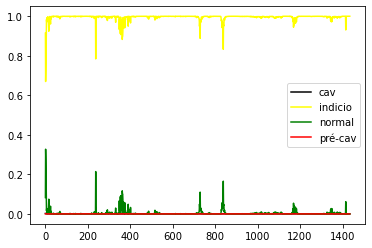

CNN_DROP_ 92


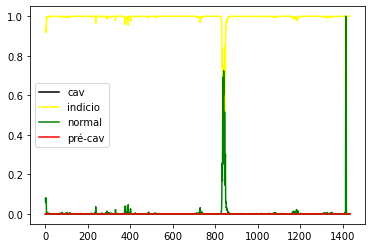

CNN_DROP_ 93


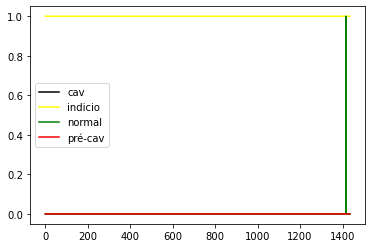

CNN_DROP_ 94


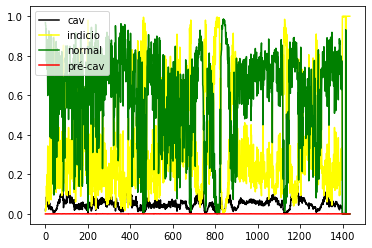

CNN_DROP_ 95


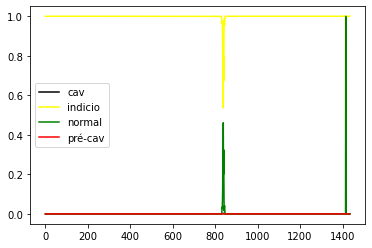

CNN_DROP_ 96


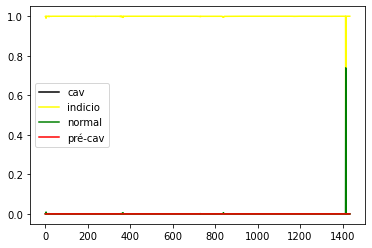

CNN_DROP_ 97


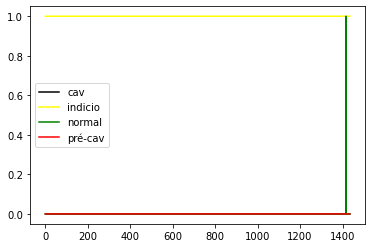

CNN_DROP_ 98


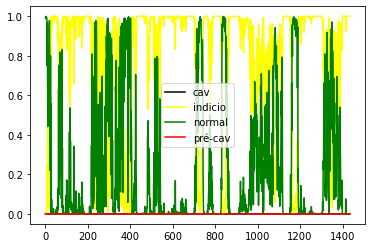

CNN_DROP_ 99


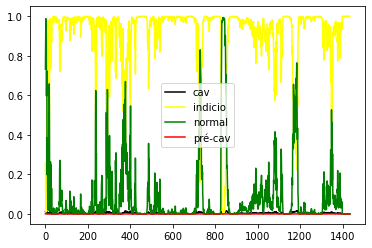

In [30]:
lstm_drop_list = range(0,n_training)
lstm_2_drop_list = range(0,n_training)
cnn_drop_list = range(0,n_training)

start = 0

yhat_out = []

for i in lstm_drop_list:
  print("LSTM_DROP_",i)
  yhat = models_lstm_drop[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

for i in lstm_2_drop_list:
  print("LSTM_2_DROP_",i)
  yhat = models_lstm_2_drop[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

for i in cnn_drop_list:
  print("CNN_DROP_",i)
  yhat = models_cnn_drop[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

LSTM_DROP_ 0


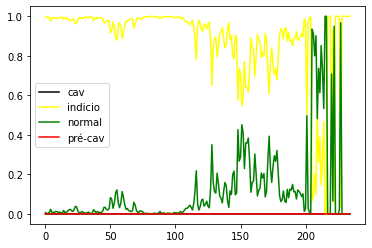

LSTM_DROP_ 1


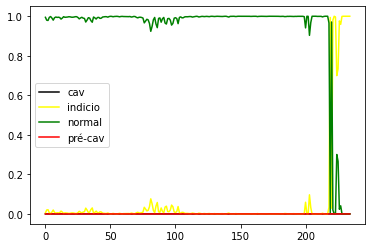

LSTM_DROP_ 2


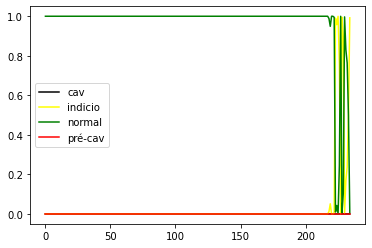

LSTM_DROP_ 3


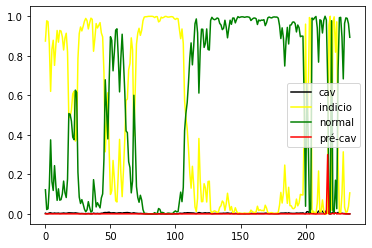

LSTM_DROP_ 4


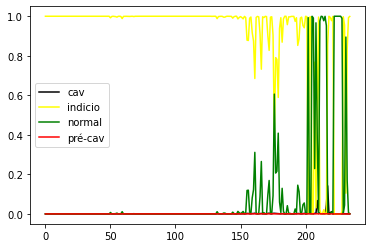

LSTM_DROP_ 5


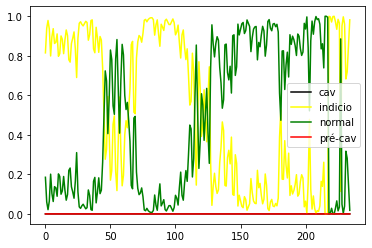

LSTM_DROP_ 6


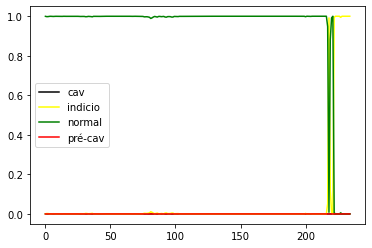

LSTM_DROP_ 7


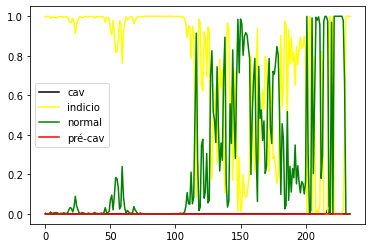

LSTM_DROP_ 8


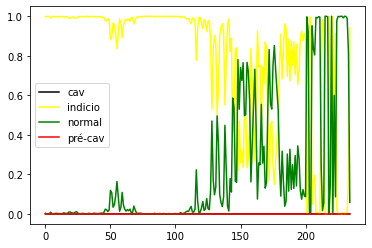

LSTM_DROP_ 9


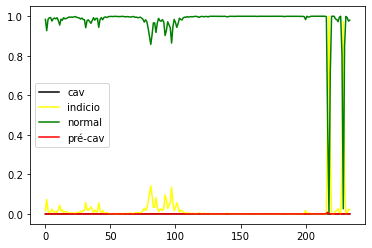

LSTM_DROP_ 10


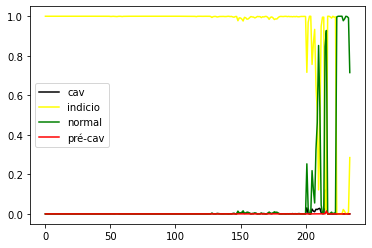

LSTM_DROP_ 11


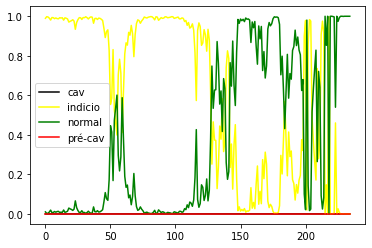

LSTM_DROP_ 12


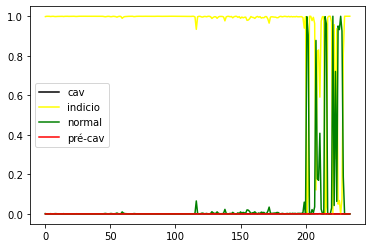

LSTM_DROP_ 13


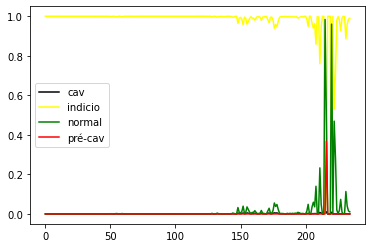

LSTM_DROP_ 14


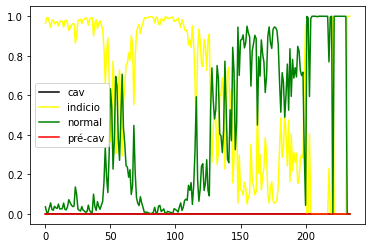

LSTM_DROP_ 15


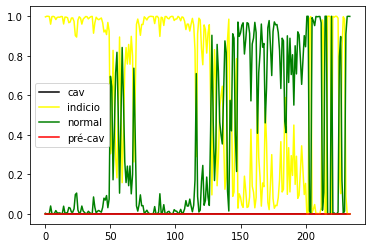

LSTM_DROP_ 16


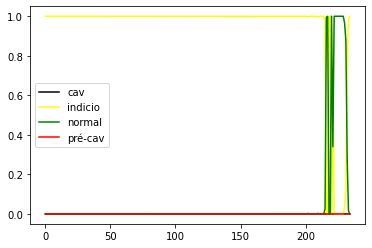

LSTM_DROP_ 17


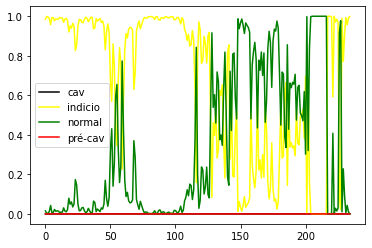

LSTM_DROP_ 18


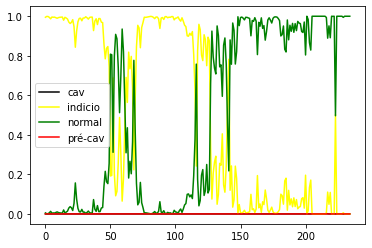

LSTM_DROP_ 19


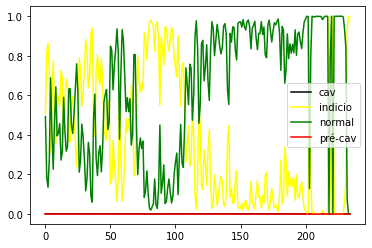

LSTM_DROP_ 20


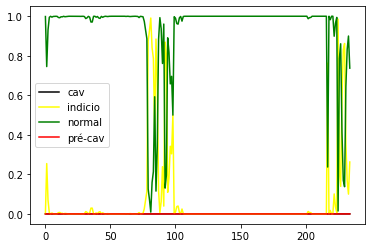

LSTM_DROP_ 21


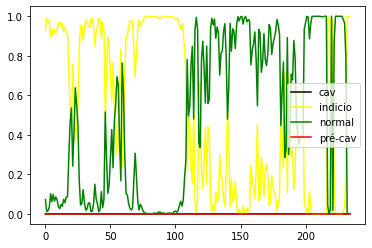

LSTM_DROP_ 22


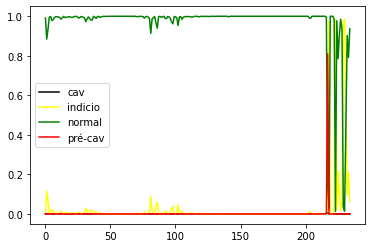

LSTM_DROP_ 23


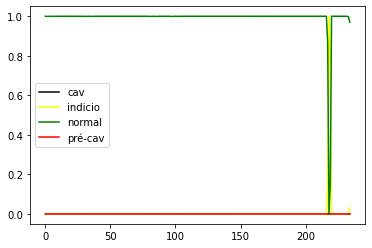

LSTM_DROP_ 24


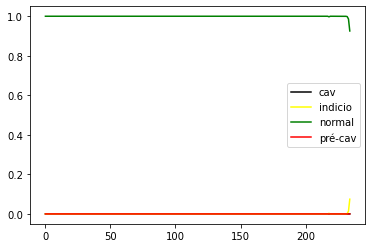

LSTM_DROP_ 25


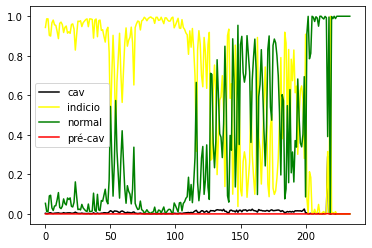

LSTM_DROP_ 26


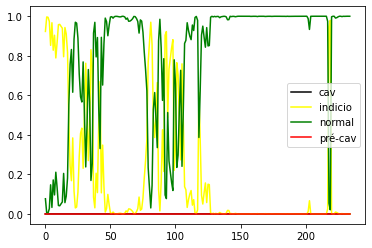

LSTM_DROP_ 27


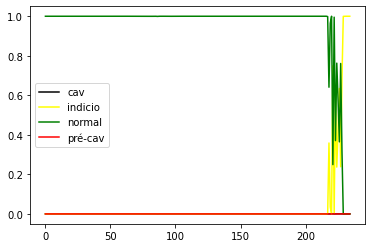

LSTM_DROP_ 28


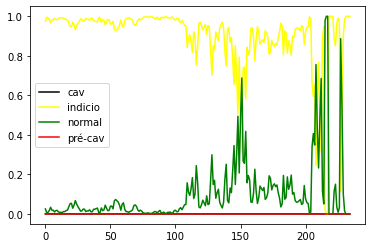

LSTM_DROP_ 29


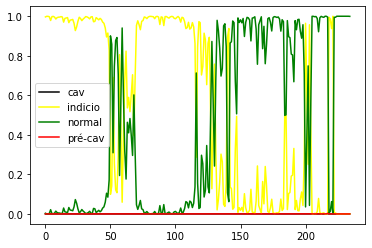

LSTM_DROP_ 30


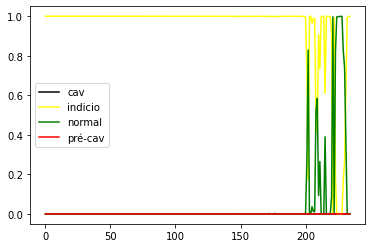

LSTM_DROP_ 31


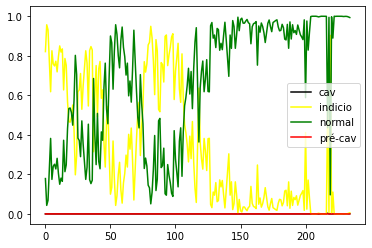

LSTM_DROP_ 32


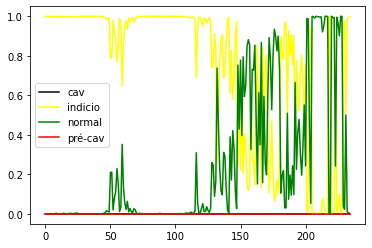

LSTM_DROP_ 33


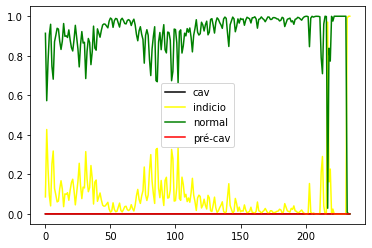

LSTM_DROP_ 34


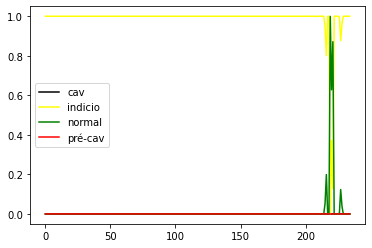

LSTM_DROP_ 35


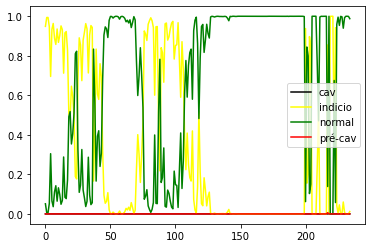

LSTM_DROP_ 36


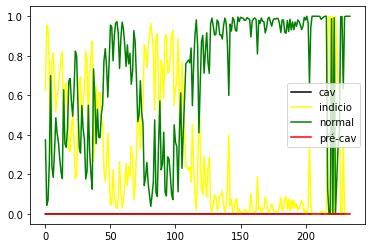

LSTM_DROP_ 37


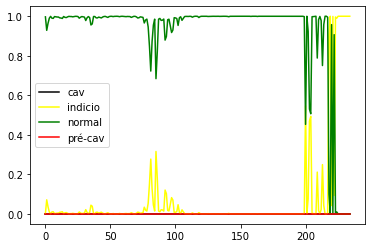

LSTM_DROP_ 38


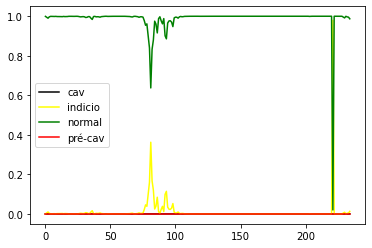

LSTM_DROP_ 39


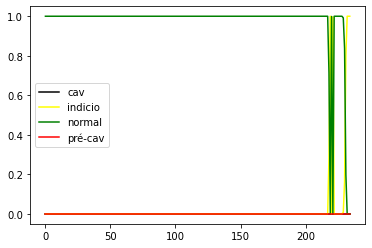

LSTM_DROP_ 40


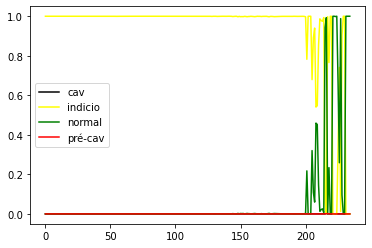

LSTM_DROP_ 41


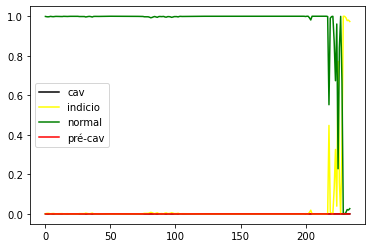

LSTM_DROP_ 42


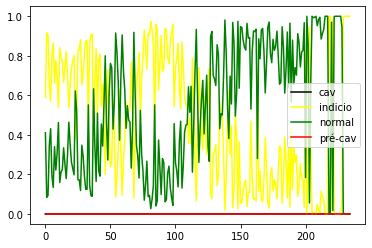

LSTM_DROP_ 43


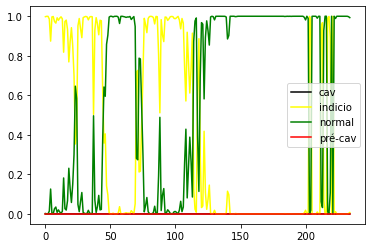

LSTM_DROP_ 44


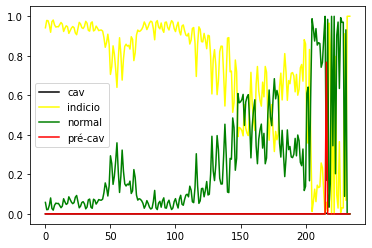

LSTM_DROP_ 45


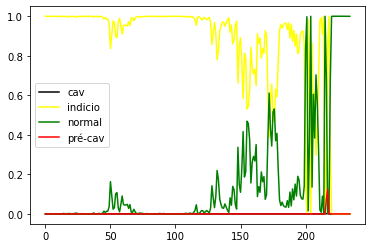

LSTM_DROP_ 46


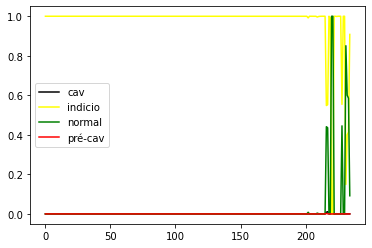

LSTM_DROP_ 47


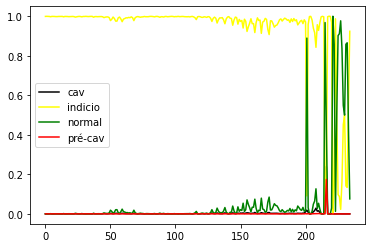

LSTM_DROP_ 48


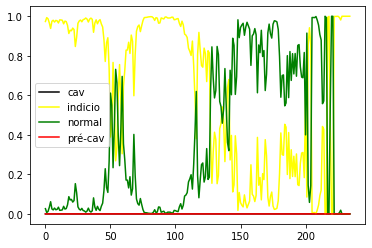

LSTM_DROP_ 49


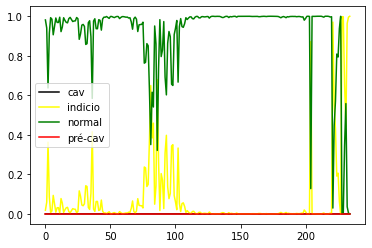

LSTM_DROP_ 50


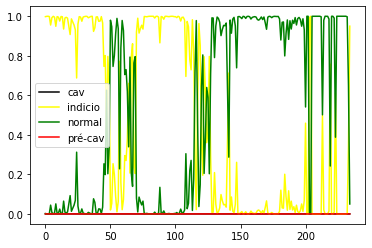

LSTM_DROP_ 51


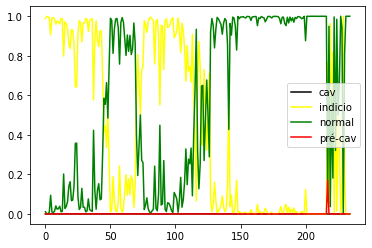

LSTM_DROP_ 52


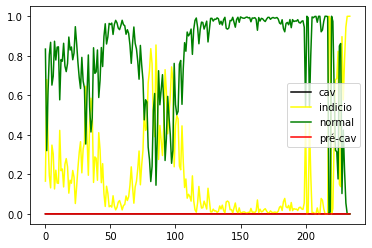

LSTM_DROP_ 53


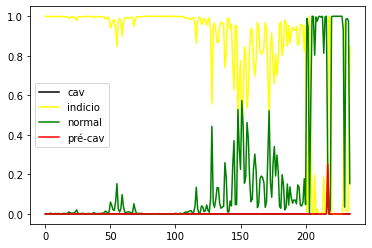

LSTM_DROP_ 54


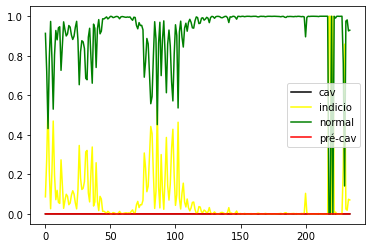

LSTM_DROP_ 55


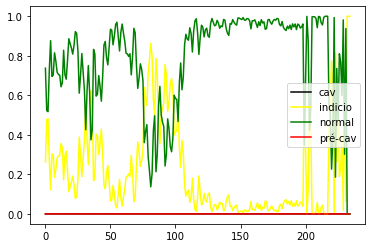

LSTM_DROP_ 56


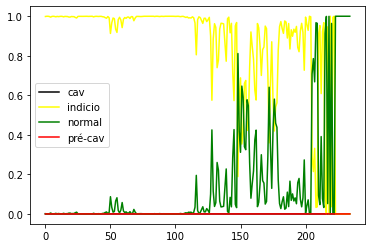

LSTM_DROP_ 57


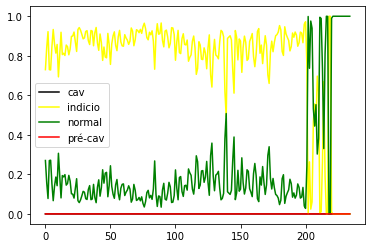

LSTM_DROP_ 58


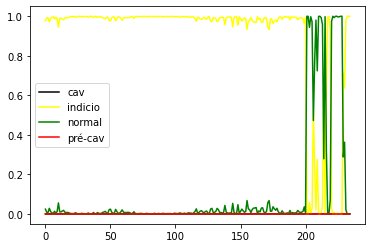

LSTM_DROP_ 59


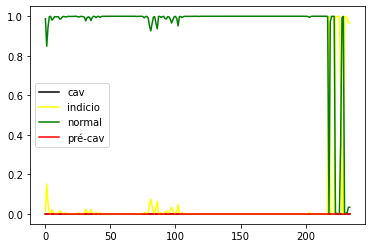

LSTM_DROP_ 60


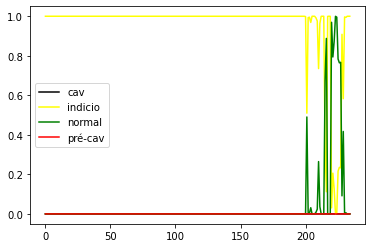

LSTM_DROP_ 61


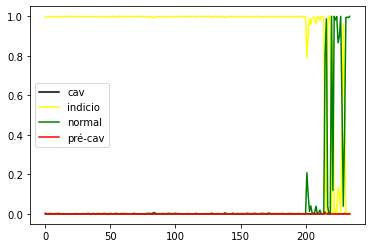

LSTM_DROP_ 62


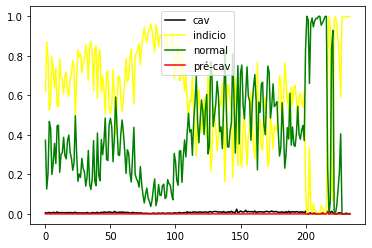

LSTM_DROP_ 63


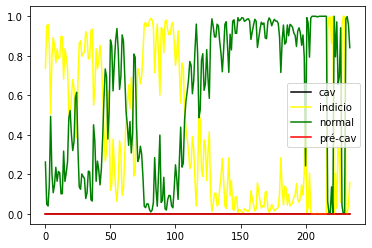

LSTM_DROP_ 64


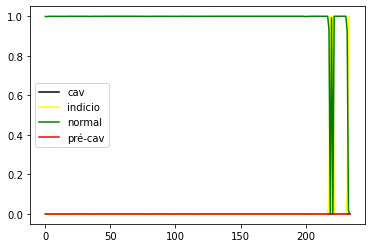

LSTM_DROP_ 65


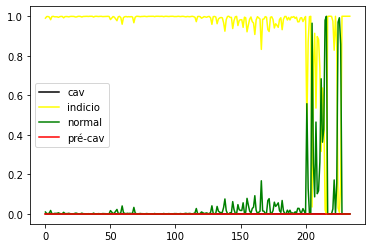

LSTM_DROP_ 66


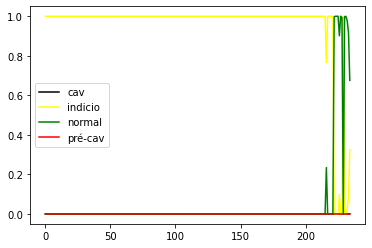

LSTM_DROP_ 67


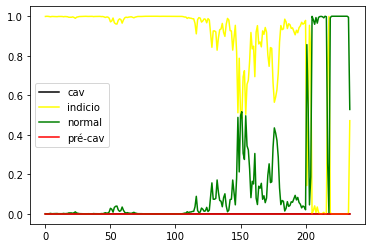

LSTM_DROP_ 68


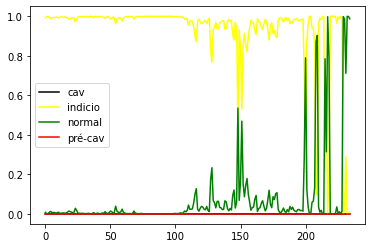

LSTM_DROP_ 69


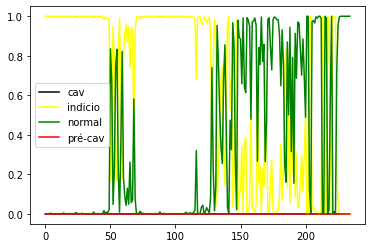

LSTM_DROP_ 70


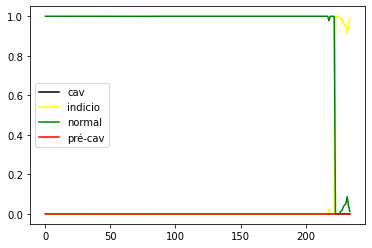

LSTM_DROP_ 71


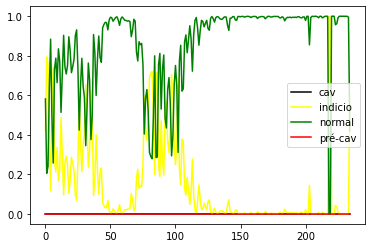

LSTM_DROP_ 72


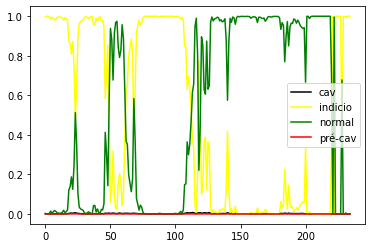

LSTM_DROP_ 73


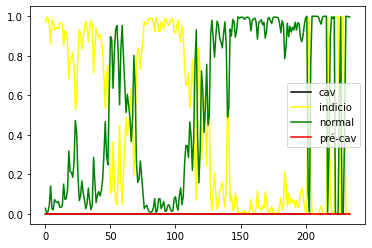

LSTM_DROP_ 74


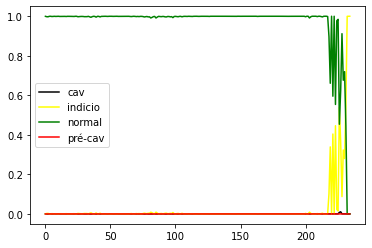

LSTM_DROP_ 75


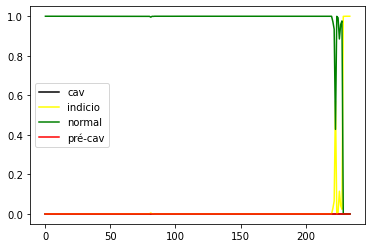

LSTM_DROP_ 76


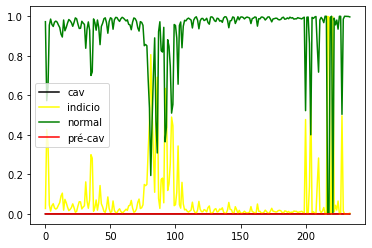

LSTM_DROP_ 77


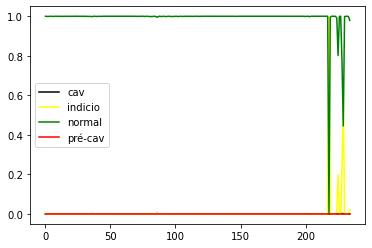

LSTM_DROP_ 78


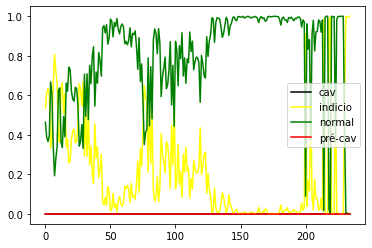

LSTM_DROP_ 79


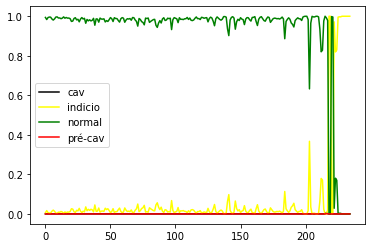

LSTM_DROP_ 80


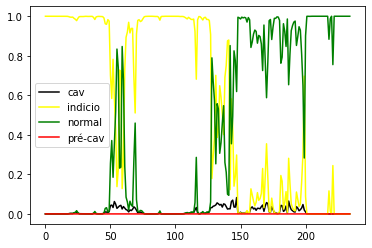

LSTM_DROP_ 81


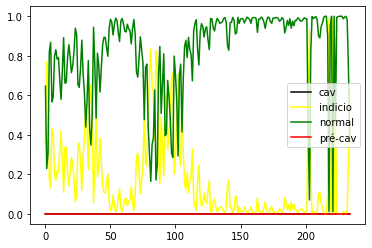

LSTM_DROP_ 82


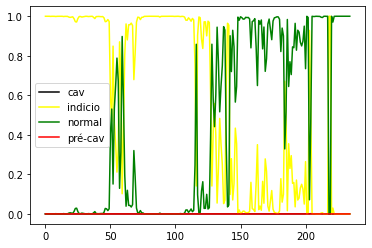

LSTM_DROP_ 83


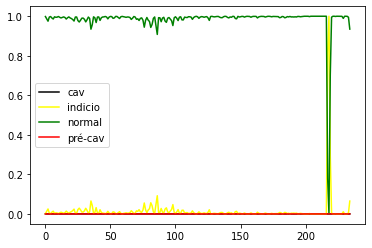

LSTM_DROP_ 84


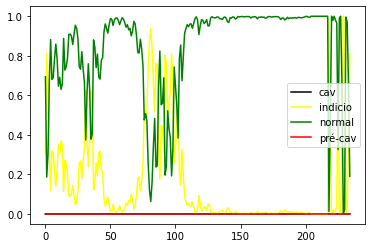

LSTM_DROP_ 85


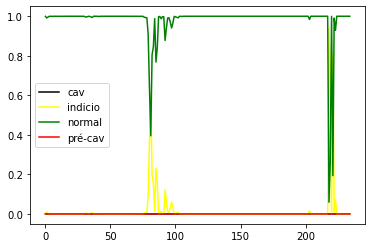

LSTM_DROP_ 86


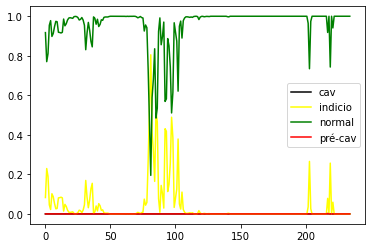

LSTM_DROP_ 87


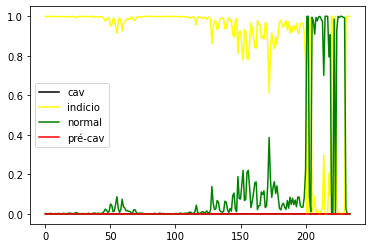

LSTM_DROP_ 88


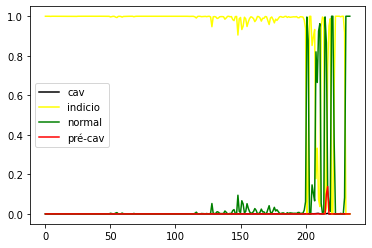

LSTM_DROP_ 89


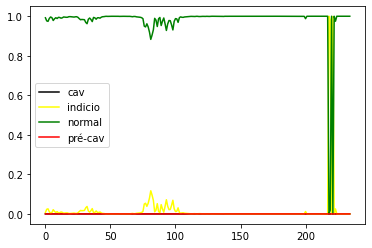

LSTM_DROP_ 90


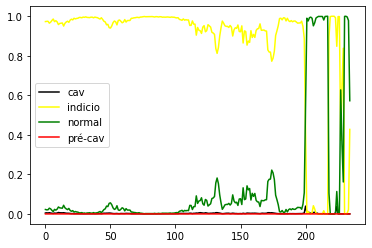

LSTM_DROP_ 91


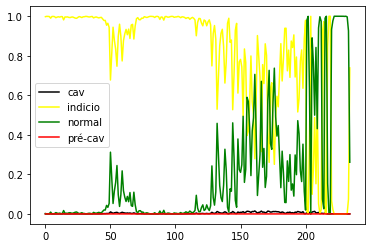

LSTM_DROP_ 92


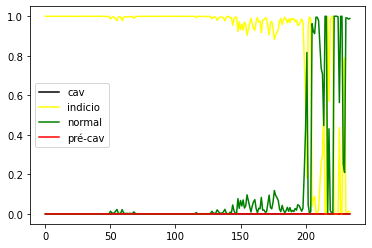

LSTM_DROP_ 93


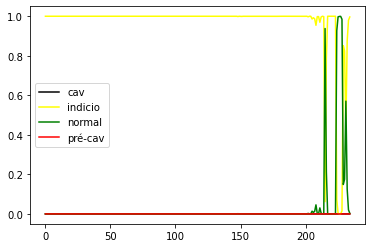

LSTM_DROP_ 94


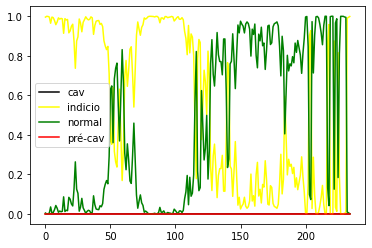

LSTM_DROP_ 95


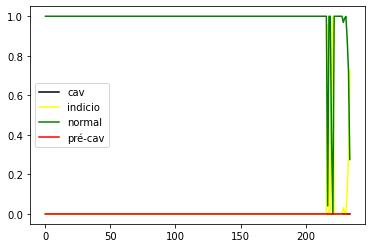

LSTM_DROP_ 96


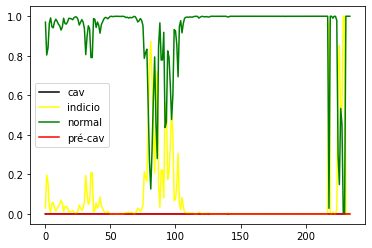

LSTM_DROP_ 97


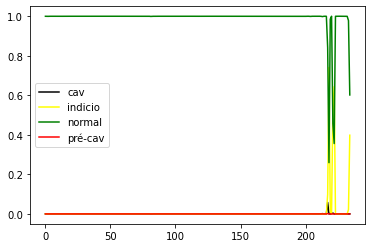

LSTM_DROP_ 98


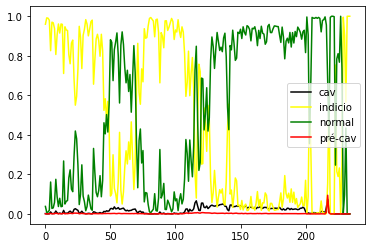

LSTM_DROP_ 99


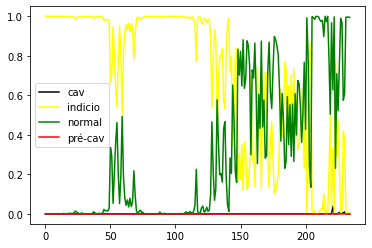

LSTM_2_DROP_ 0


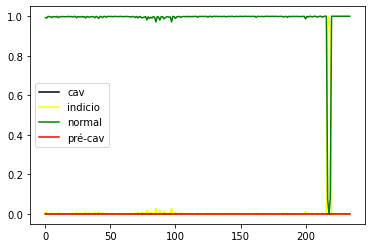

LSTM_2_DROP_ 1


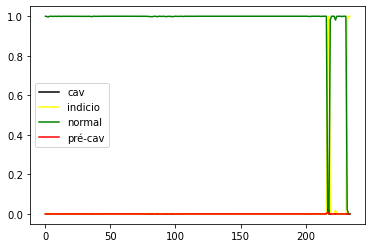

LSTM_2_DROP_ 2


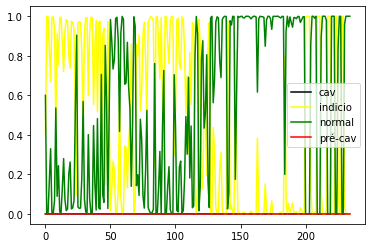

LSTM_2_DROP_ 3


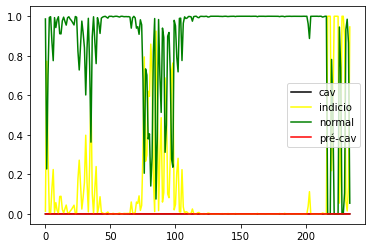

LSTM_2_DROP_ 4


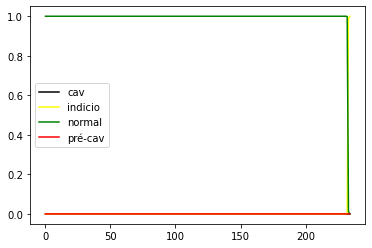

LSTM_2_DROP_ 5


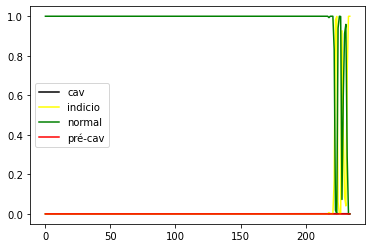

LSTM_2_DROP_ 6


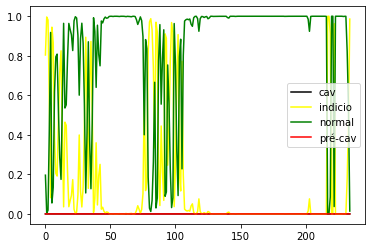

LSTM_2_DROP_ 7


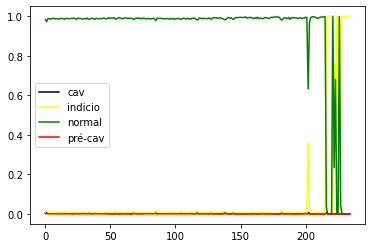

LSTM_2_DROP_ 8


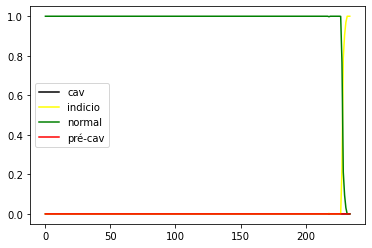

LSTM_2_DROP_ 9


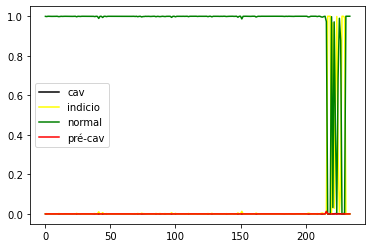

LSTM_2_DROP_ 10


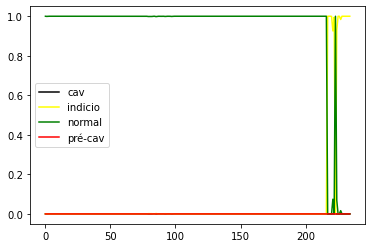

LSTM_2_DROP_ 11


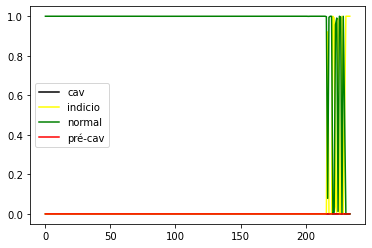

LSTM_2_DROP_ 12


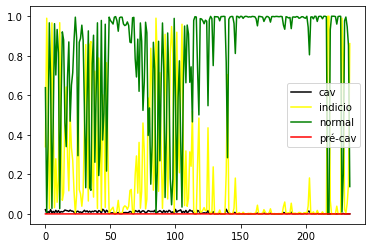

LSTM_2_DROP_ 13


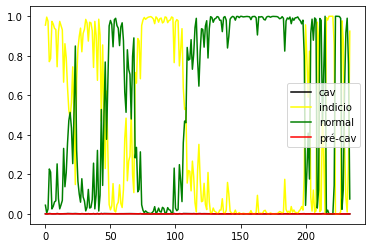

LSTM_2_DROP_ 14


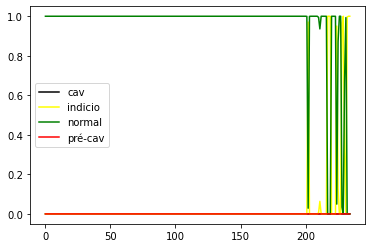

LSTM_2_DROP_ 15


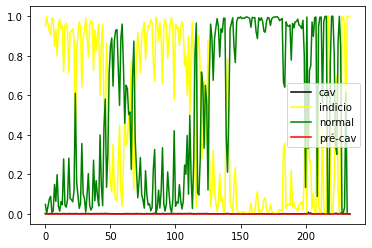

LSTM_2_DROP_ 16


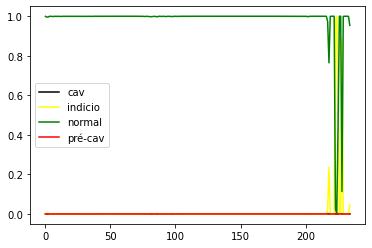

LSTM_2_DROP_ 17


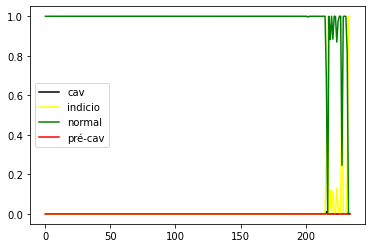

LSTM_2_DROP_ 18


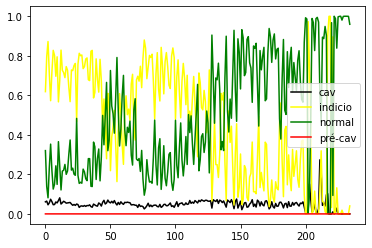

LSTM_2_DROP_ 19


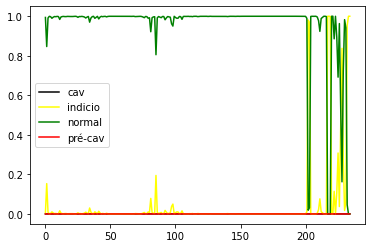

LSTM_2_DROP_ 20


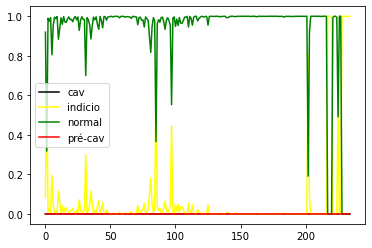

LSTM_2_DROP_ 21


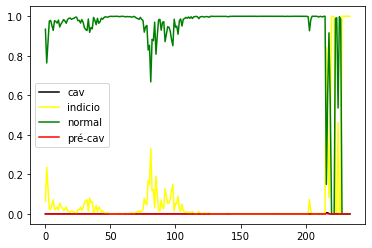

LSTM_2_DROP_ 22


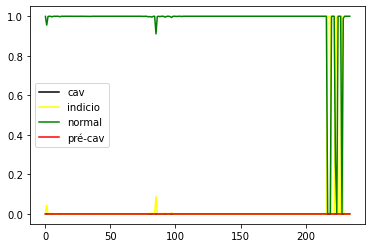

LSTM_2_DROP_ 23


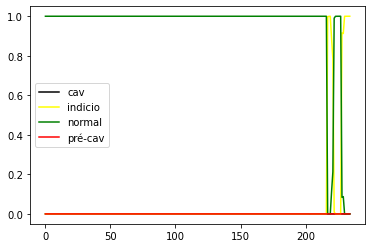

LSTM_2_DROP_ 24


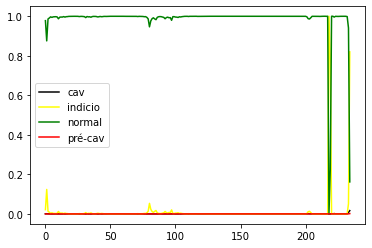

LSTM_2_DROP_ 25


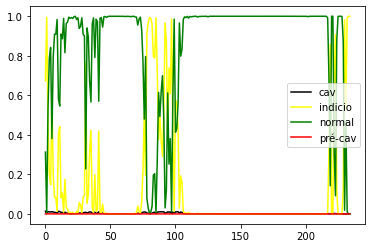

LSTM_2_DROP_ 26


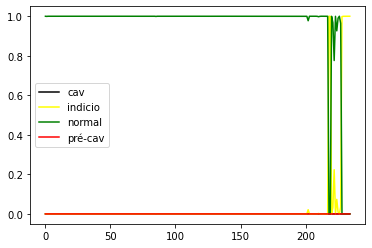

LSTM_2_DROP_ 27


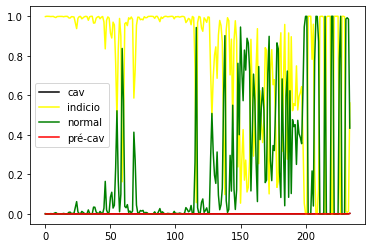

LSTM_2_DROP_ 28


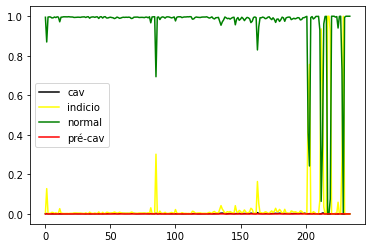

LSTM_2_DROP_ 29


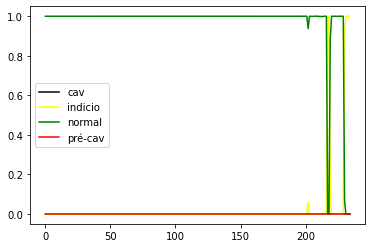

LSTM_2_DROP_ 30


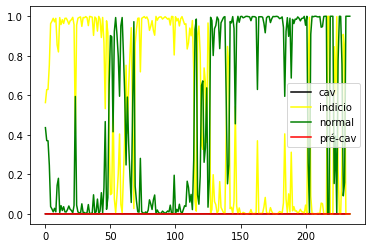

LSTM_2_DROP_ 31


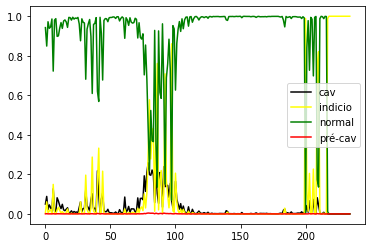

LSTM_2_DROP_ 32


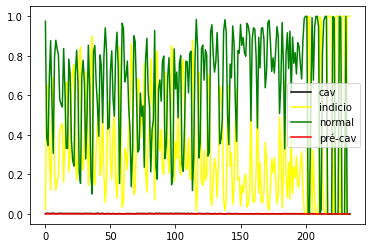

LSTM_2_DROP_ 33


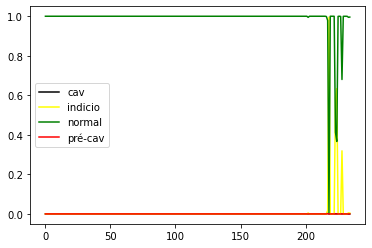

LSTM_2_DROP_ 34


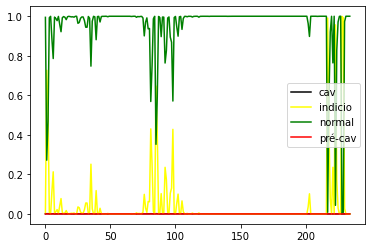

LSTM_2_DROP_ 35


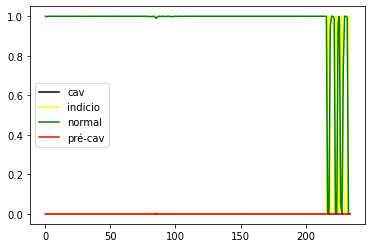

LSTM_2_DROP_ 36


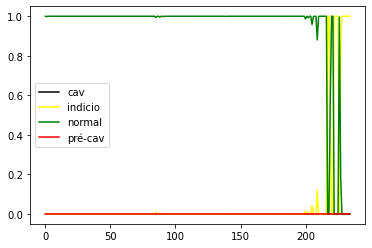

LSTM_2_DROP_ 37


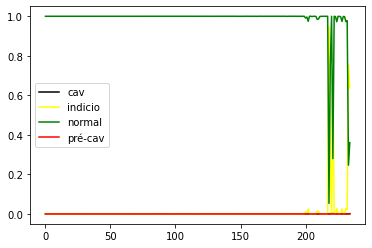

LSTM_2_DROP_ 38


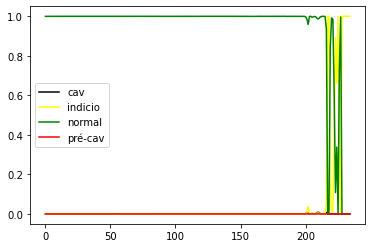

LSTM_2_DROP_ 39


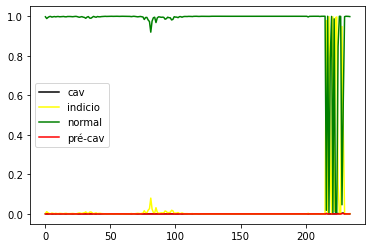

LSTM_2_DROP_ 40


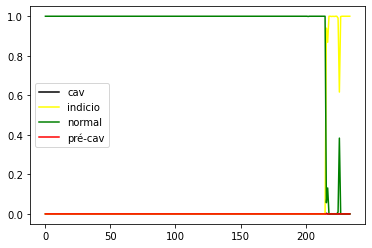

LSTM_2_DROP_ 41


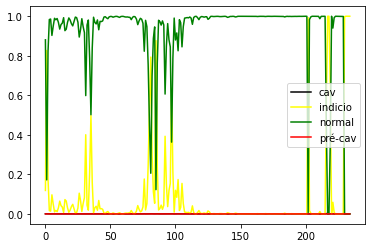

LSTM_2_DROP_ 42


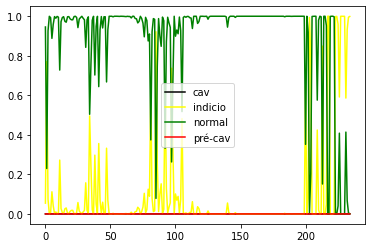

LSTM_2_DROP_ 43


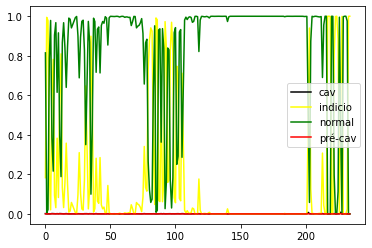

LSTM_2_DROP_ 44


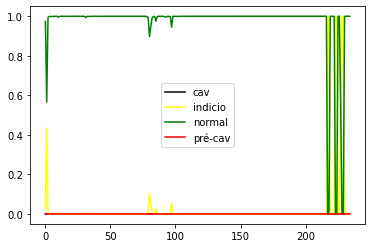

LSTM_2_DROP_ 45


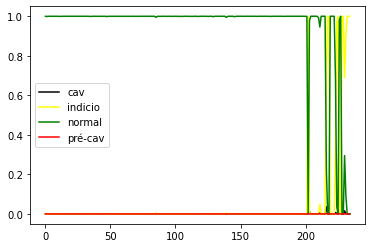

LSTM_2_DROP_ 46


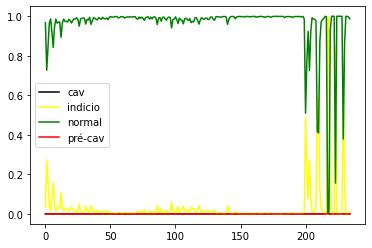

LSTM_2_DROP_ 47


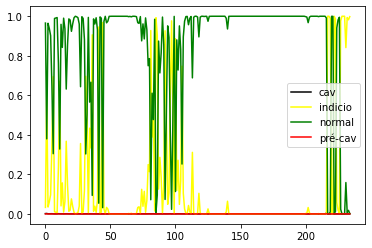

LSTM_2_DROP_ 48


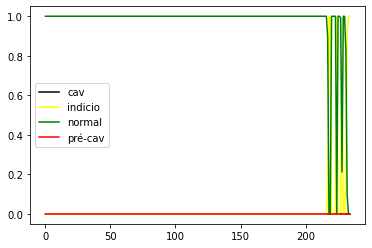

LSTM_2_DROP_ 49


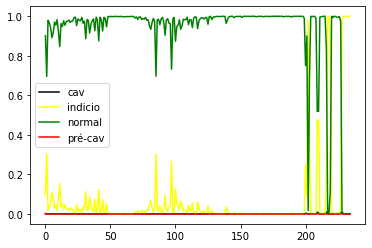

LSTM_2_DROP_ 50


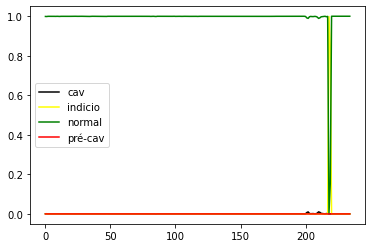

LSTM_2_DROP_ 51


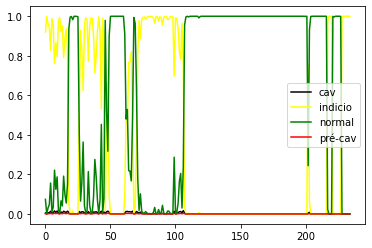

LSTM_2_DROP_ 52


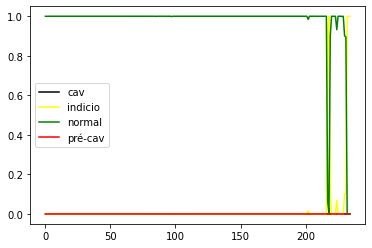

LSTM_2_DROP_ 53


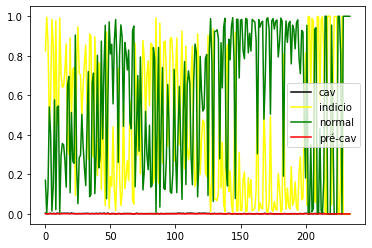

LSTM_2_DROP_ 54


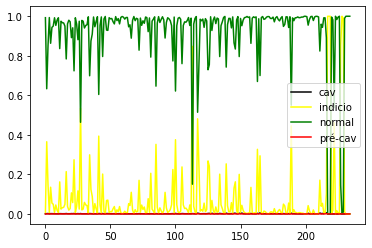

LSTM_2_DROP_ 55


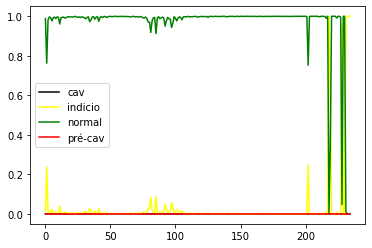

LSTM_2_DROP_ 56


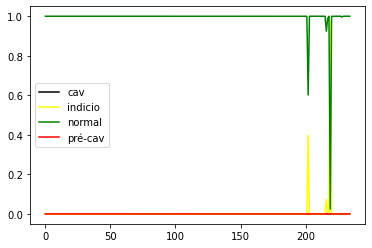

LSTM_2_DROP_ 57


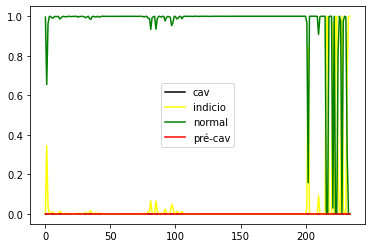

LSTM_2_DROP_ 58


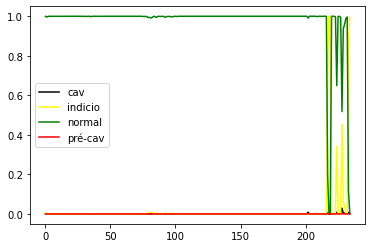

LSTM_2_DROP_ 59


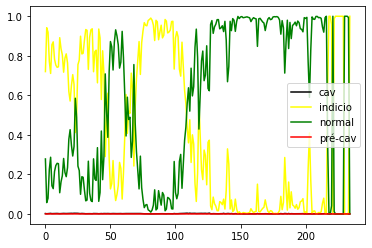

LSTM_2_DROP_ 60


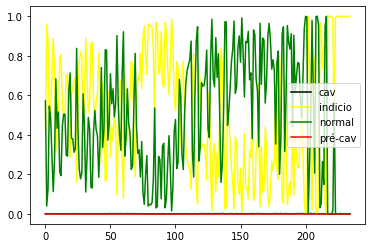

LSTM_2_DROP_ 61


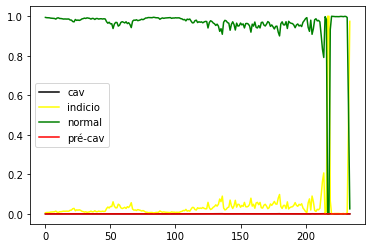

LSTM_2_DROP_ 62


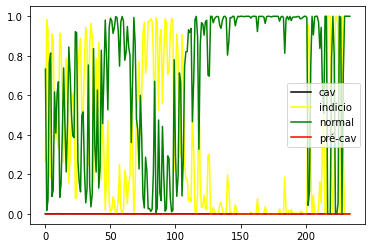

LSTM_2_DROP_ 63


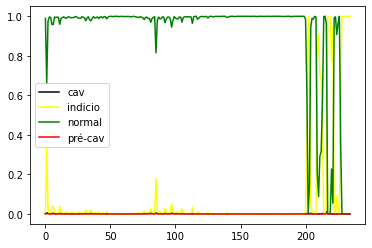

LSTM_2_DROP_ 64


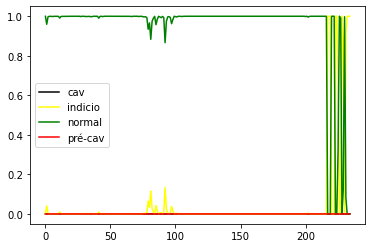

LSTM_2_DROP_ 65


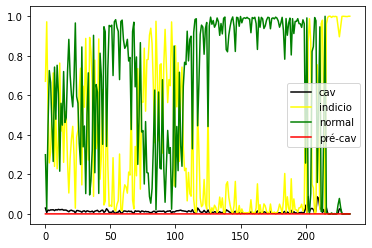

LSTM_2_DROP_ 66


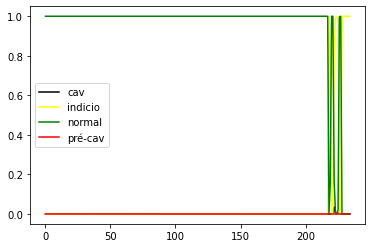

LSTM_2_DROP_ 67


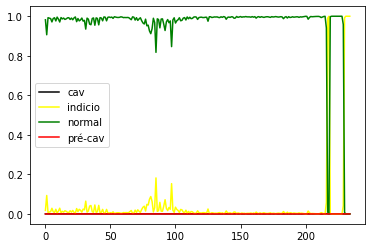

LSTM_2_DROP_ 68


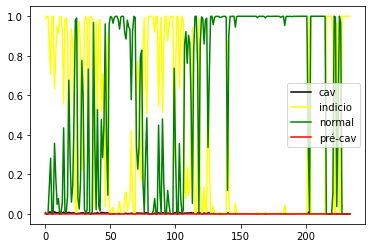

LSTM_2_DROP_ 69


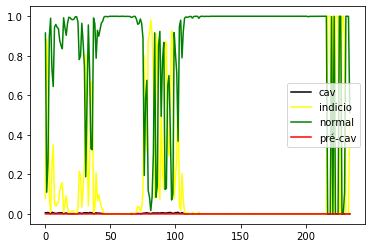

LSTM_2_DROP_ 70


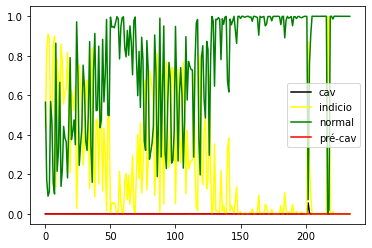

LSTM_2_DROP_ 71


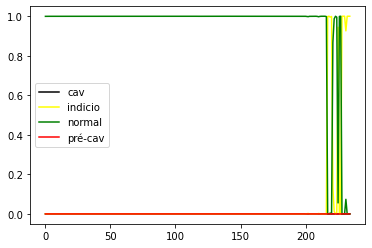

LSTM_2_DROP_ 72


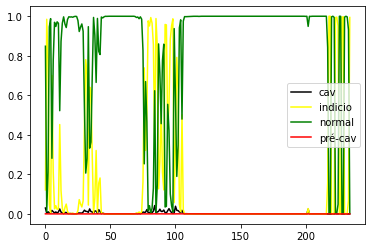

LSTM_2_DROP_ 73


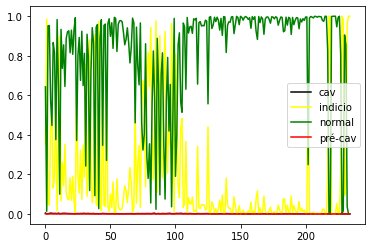

LSTM_2_DROP_ 74


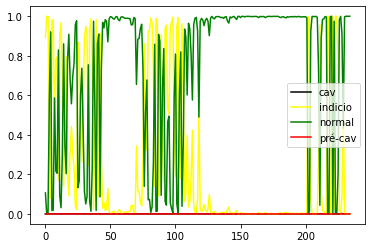

LSTM_2_DROP_ 75


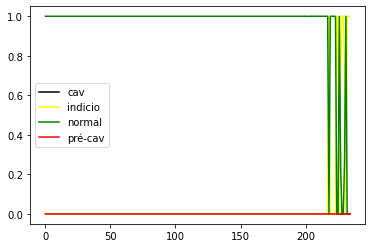

LSTM_2_DROP_ 76


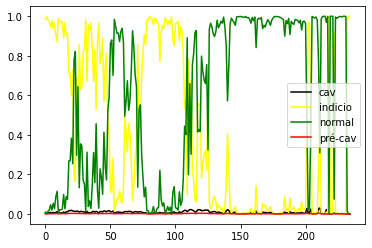

LSTM_2_DROP_ 77


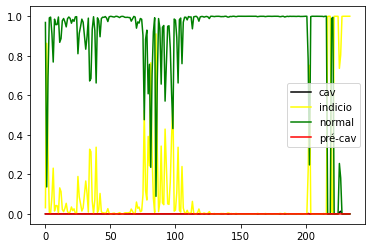

LSTM_2_DROP_ 78


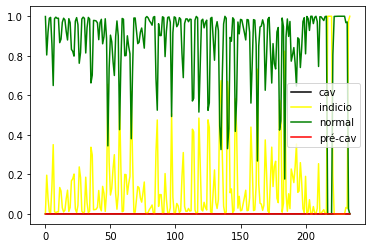

LSTM_2_DROP_ 79


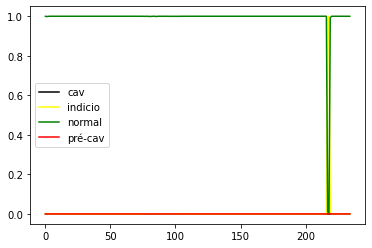

LSTM_2_DROP_ 80


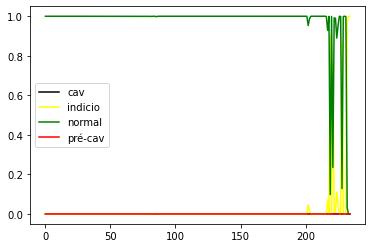

LSTM_2_DROP_ 81


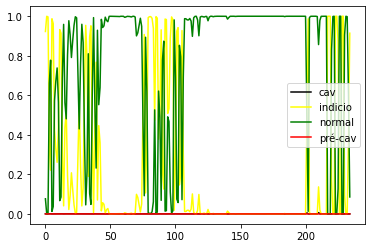

LSTM_2_DROP_ 82


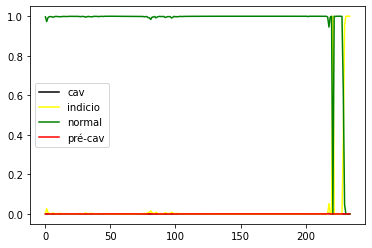

LSTM_2_DROP_ 83


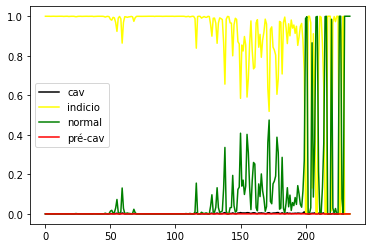

LSTM_2_DROP_ 84


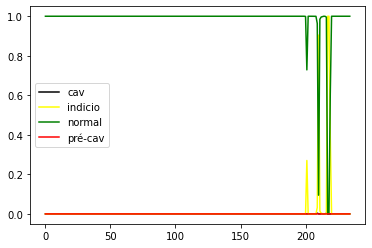

LSTM_2_DROP_ 85


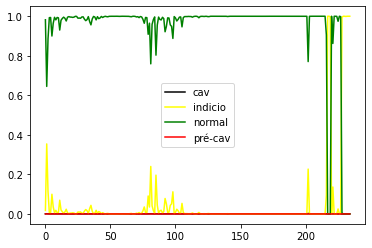

LSTM_2_DROP_ 86


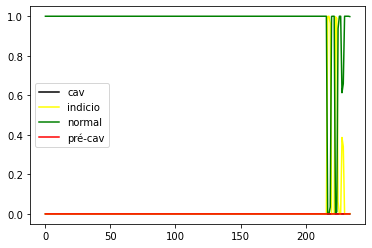

LSTM_2_DROP_ 87


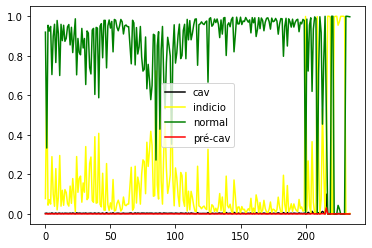

LSTM_2_DROP_ 88


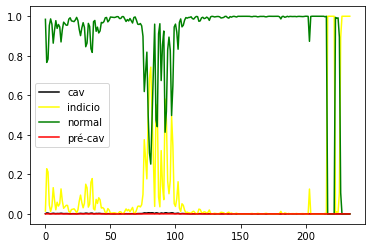

LSTM_2_DROP_ 89


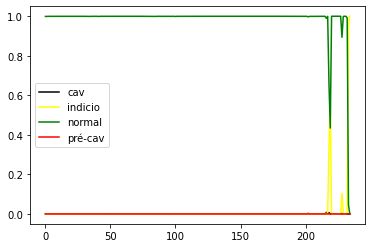

LSTM_2_DROP_ 90


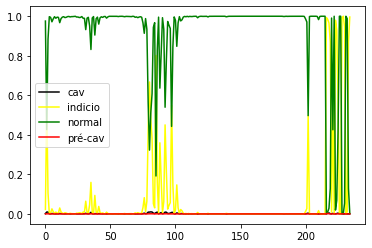

LSTM_2_DROP_ 91


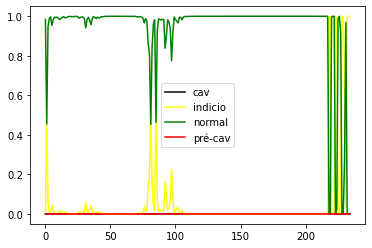

LSTM_2_DROP_ 92


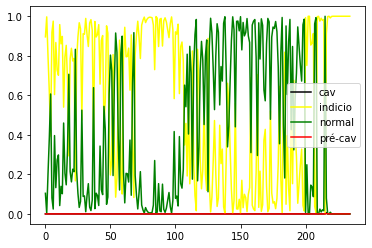

LSTM_2_DROP_ 93


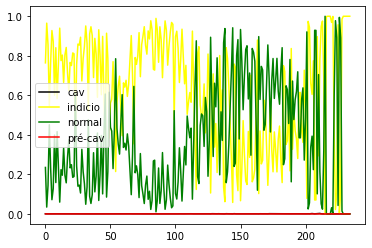

LSTM_2_DROP_ 94


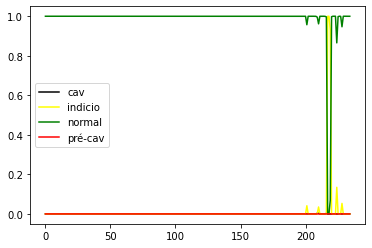

LSTM_2_DROP_ 95


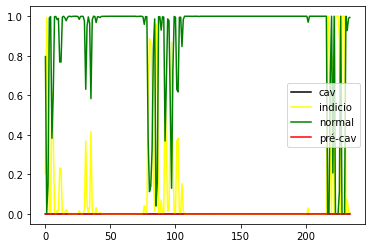

LSTM_2_DROP_ 96


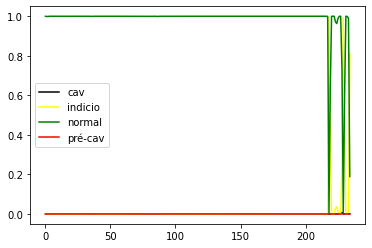

LSTM_2_DROP_ 97


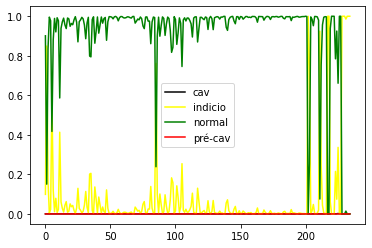

LSTM_2_DROP_ 98


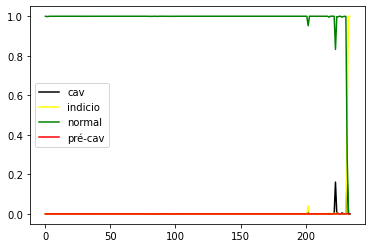

LSTM_2_DROP_ 99


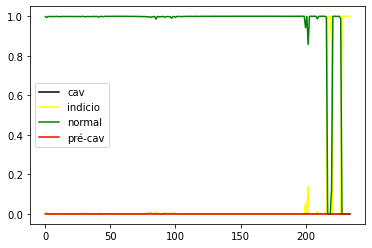

CNN_DROP_ 0


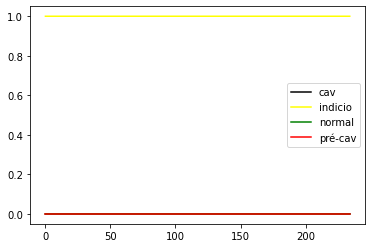

CNN_DROP_ 1


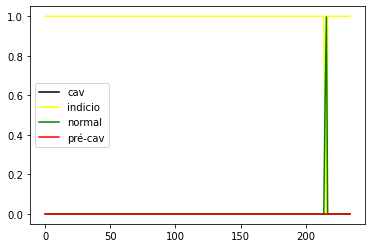

CNN_DROP_ 2


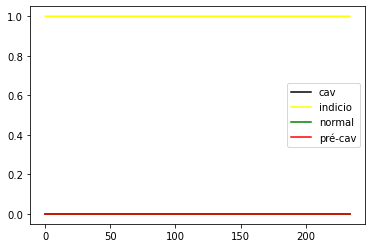

CNN_DROP_ 3


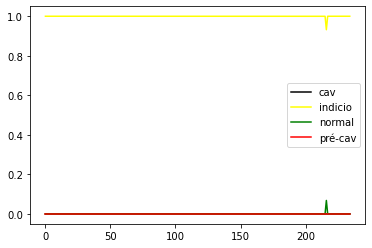

CNN_DROP_ 4


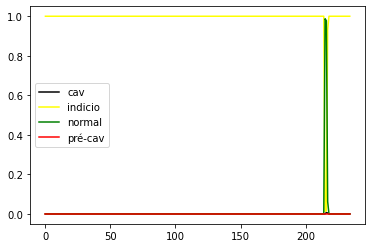

CNN_DROP_ 5


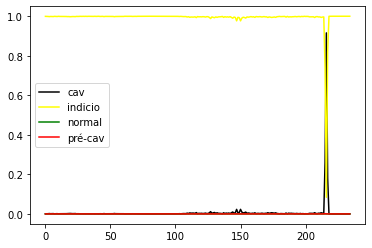

CNN_DROP_ 6


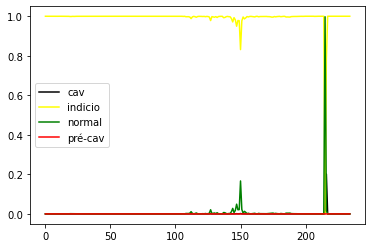

CNN_DROP_ 7


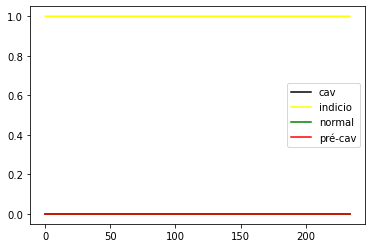

CNN_DROP_ 8


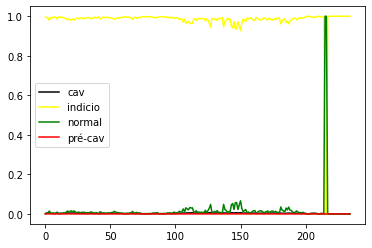

CNN_DROP_ 9


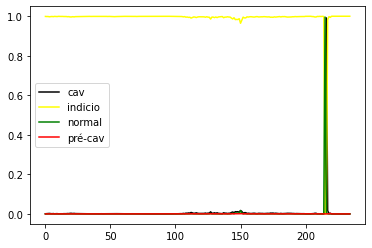

CNN_DROP_ 10


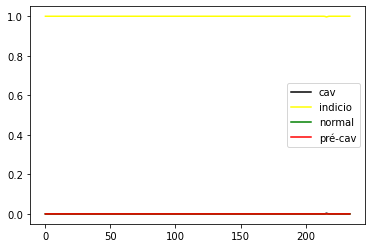

CNN_DROP_ 11


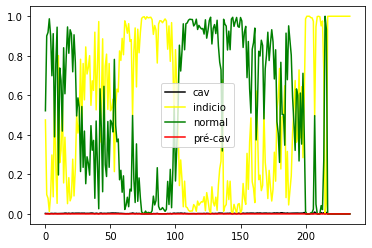

CNN_DROP_ 12


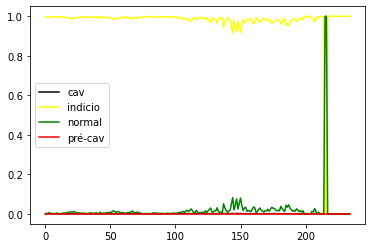

CNN_DROP_ 13


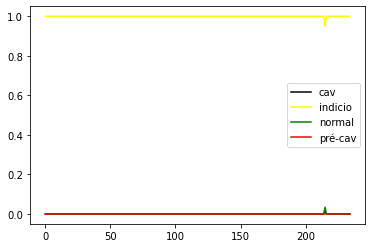

CNN_DROP_ 14


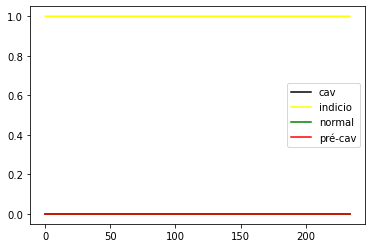

CNN_DROP_ 15


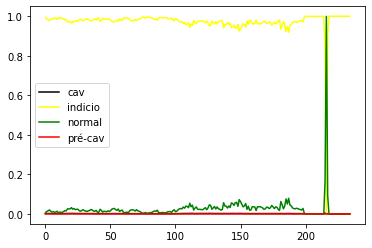

CNN_DROP_ 16


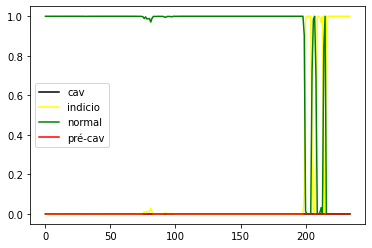

CNN_DROP_ 17


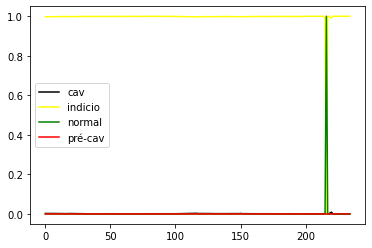

CNN_DROP_ 18


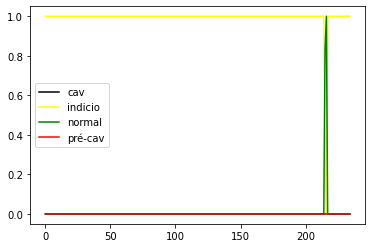

CNN_DROP_ 19


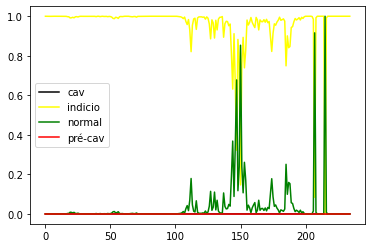

CNN_DROP_ 20


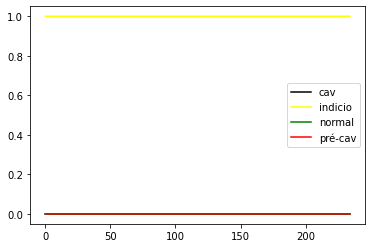

CNN_DROP_ 21


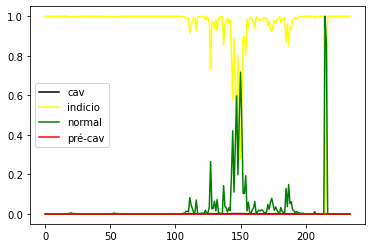

CNN_DROP_ 22


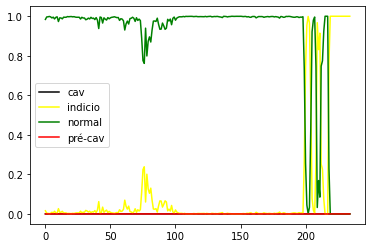

CNN_DROP_ 23


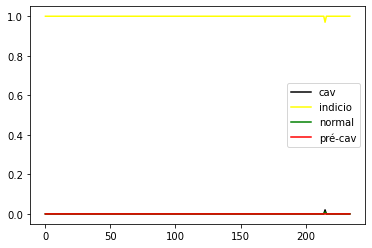

CNN_DROP_ 24


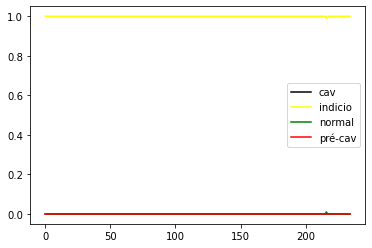

CNN_DROP_ 25


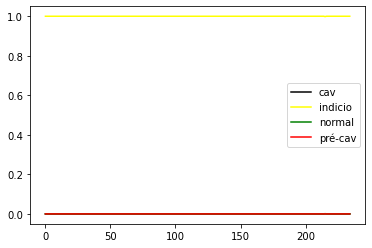

CNN_DROP_ 26


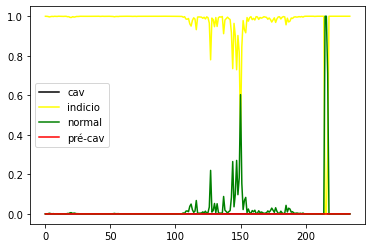

CNN_DROP_ 27


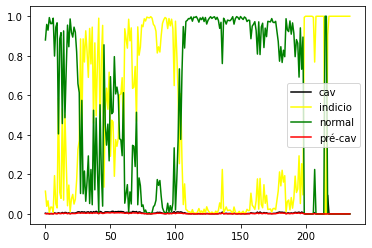

CNN_DROP_ 28


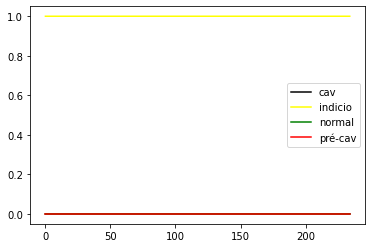

CNN_DROP_ 29


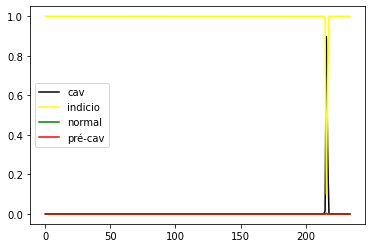

CNN_DROP_ 30


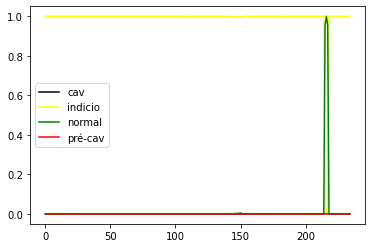

CNN_DROP_ 31


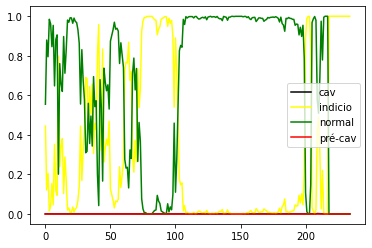

CNN_DROP_ 32


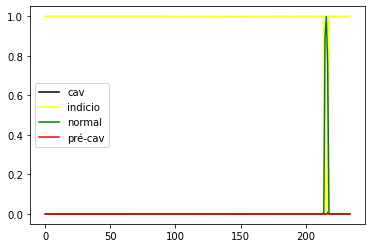

CNN_DROP_ 33


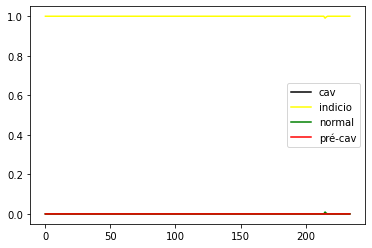

CNN_DROP_ 34


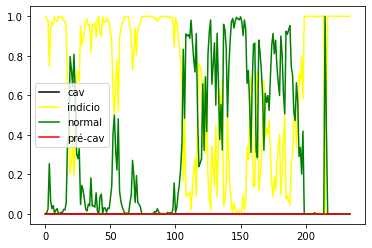

CNN_DROP_ 35


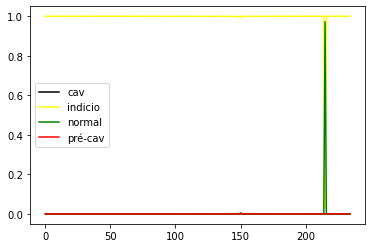

CNN_DROP_ 36


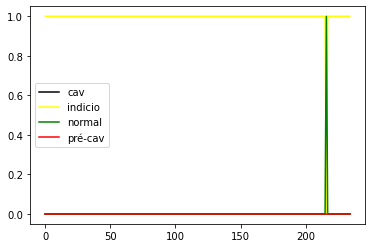

CNN_DROP_ 37


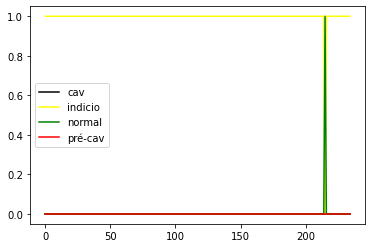

CNN_DROP_ 38


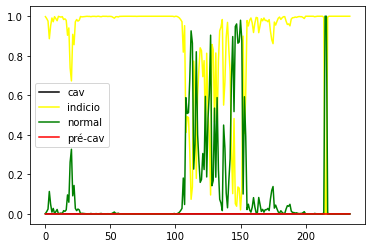

CNN_DROP_ 39


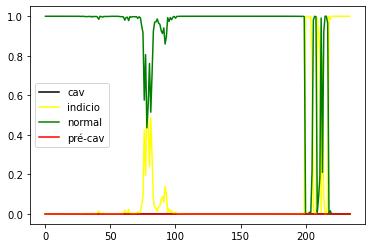

CNN_DROP_ 40


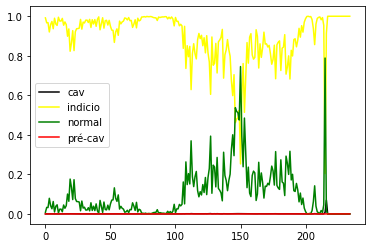

CNN_DROP_ 41


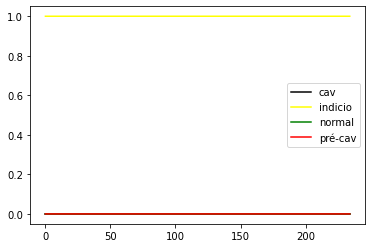

CNN_DROP_ 42


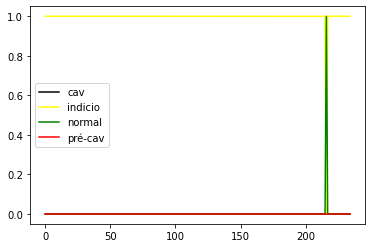

CNN_DROP_ 43


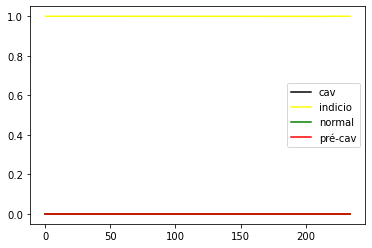

CNN_DROP_ 44


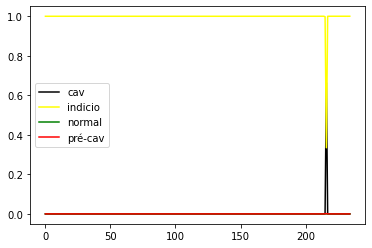

CNN_DROP_ 45


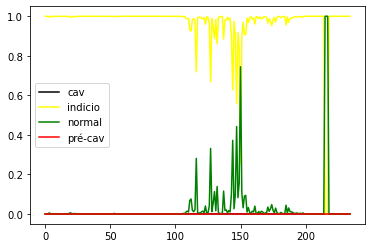

CNN_DROP_ 46


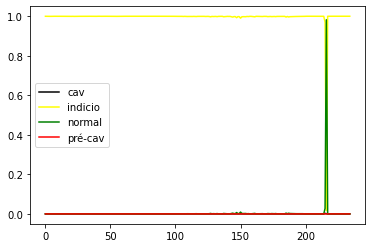

CNN_DROP_ 47


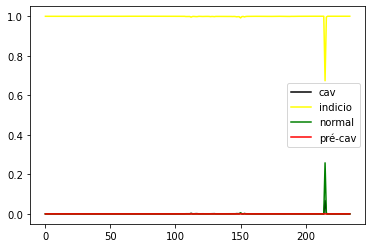

CNN_DROP_ 48


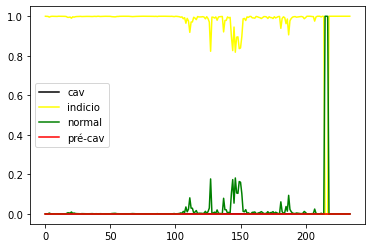

CNN_DROP_ 49


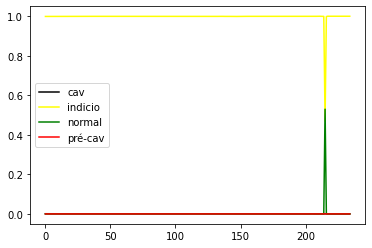

CNN_DROP_ 50


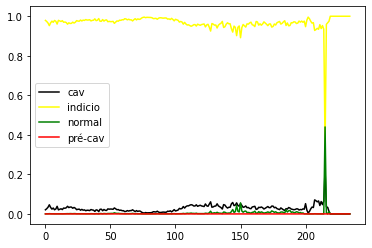

CNN_DROP_ 51


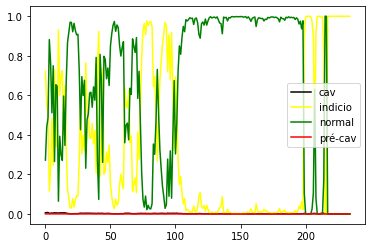

CNN_DROP_ 52


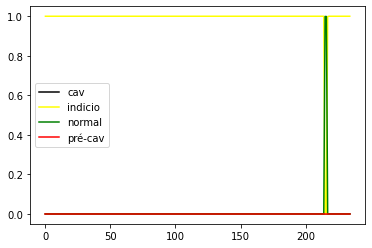

CNN_DROP_ 53


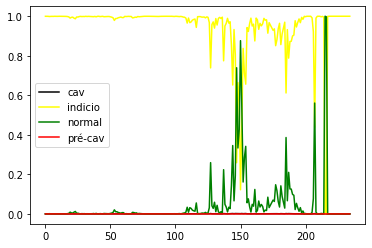

CNN_DROP_ 54


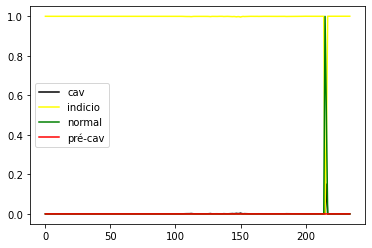

CNN_DROP_ 55


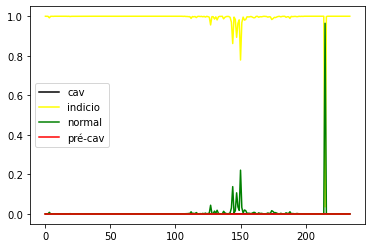

CNN_DROP_ 56


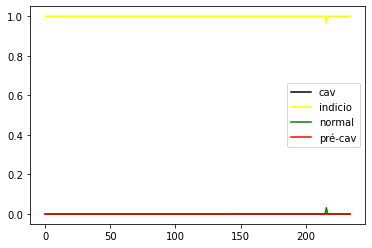

CNN_DROP_ 57


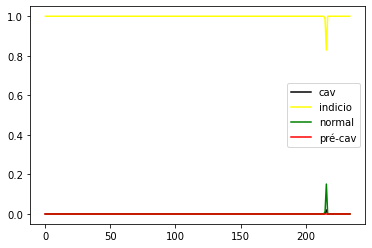

CNN_DROP_ 58


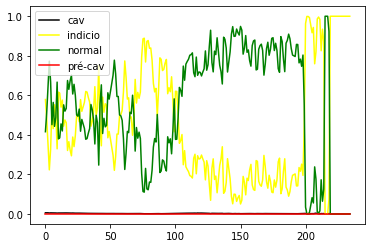

CNN_DROP_ 59


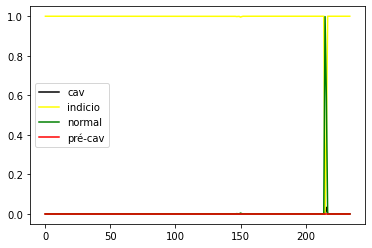

CNN_DROP_ 60


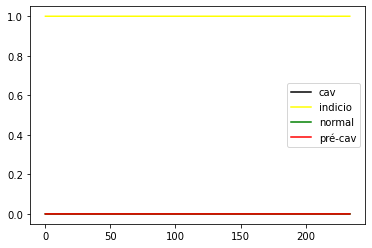

CNN_DROP_ 61


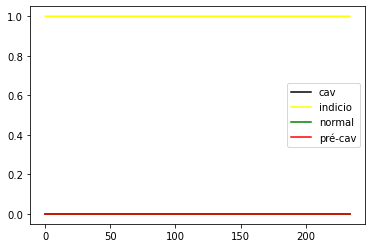

CNN_DROP_ 62


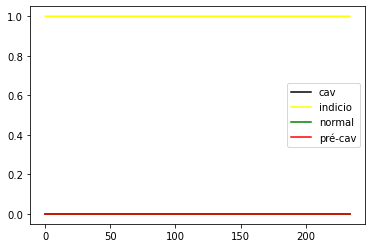

CNN_DROP_ 63


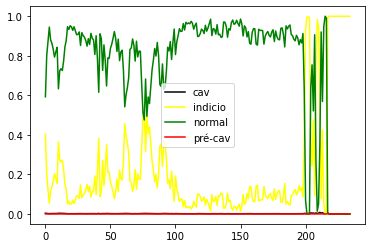

CNN_DROP_ 64


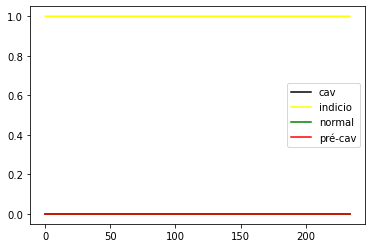

CNN_DROP_ 65


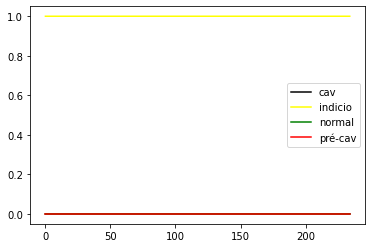

CNN_DROP_ 66


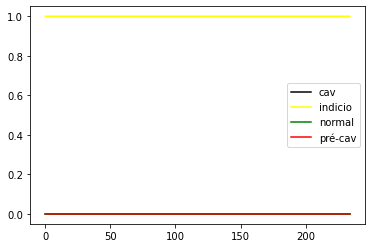

CNN_DROP_ 67


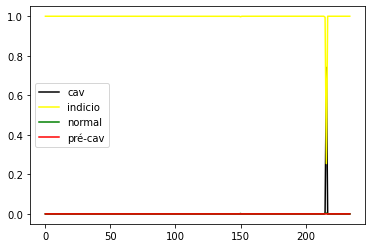

CNN_DROP_ 68


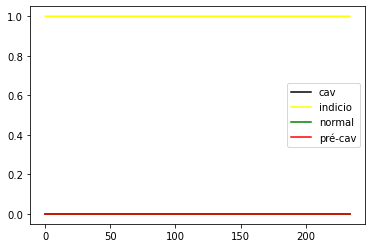

CNN_DROP_ 69


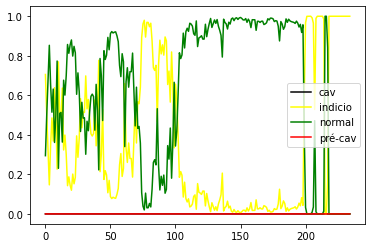

CNN_DROP_ 70


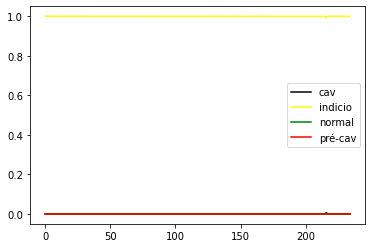

CNN_DROP_ 71


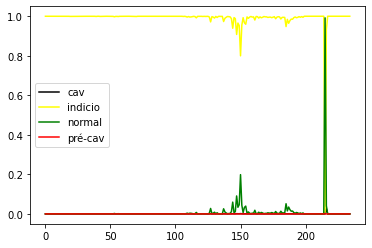

CNN_DROP_ 72


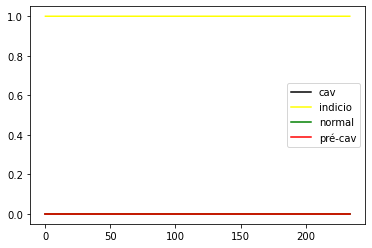

CNN_DROP_ 73


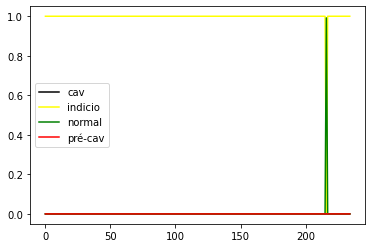

CNN_DROP_ 74


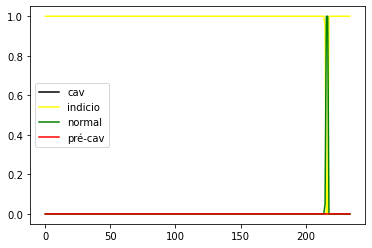

CNN_DROP_ 75


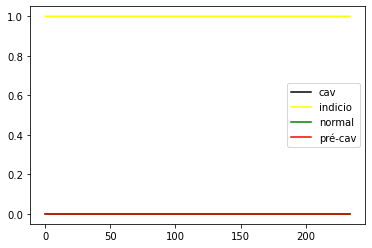

CNN_DROP_ 76


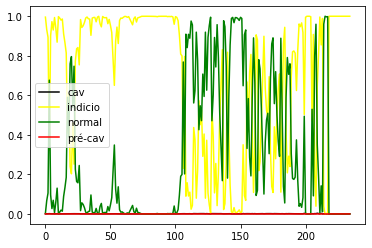

CNN_DROP_ 77


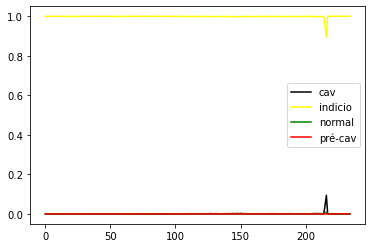

CNN_DROP_ 78


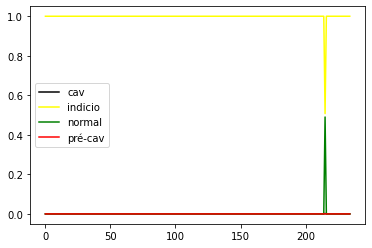

CNN_DROP_ 79


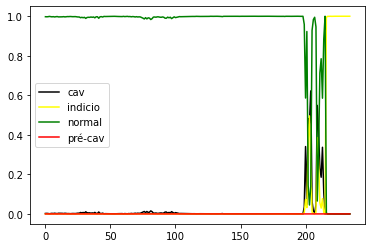

CNN_DROP_ 80


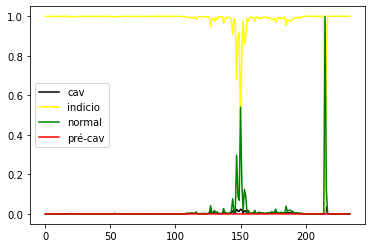

CNN_DROP_ 81


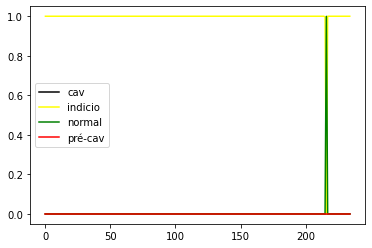

CNN_DROP_ 82


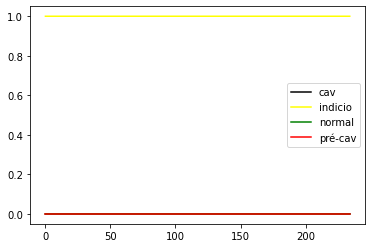

CNN_DROP_ 83


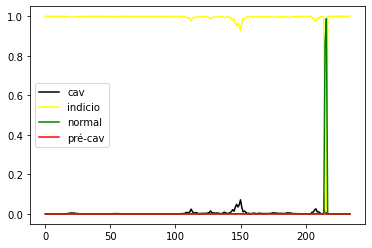

CNN_DROP_ 84


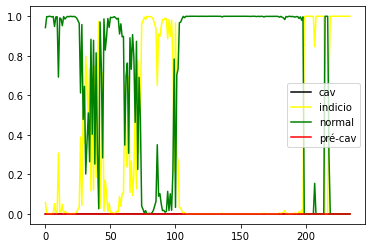

CNN_DROP_ 85


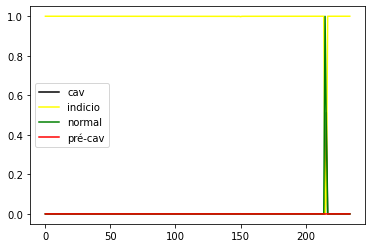

CNN_DROP_ 86


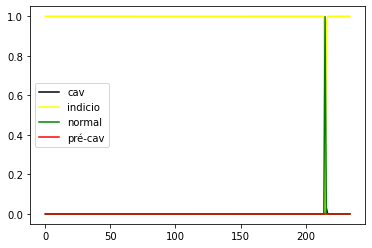

CNN_DROP_ 87


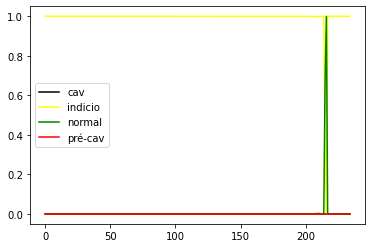

CNN_DROP_ 88


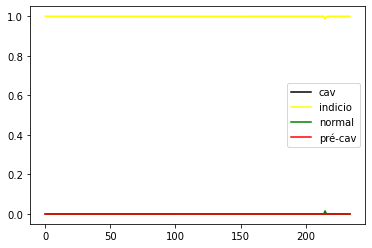

CNN_DROP_ 89


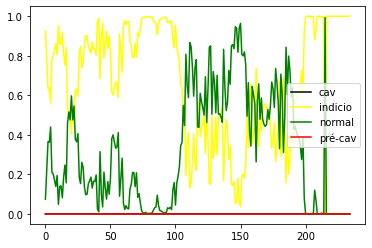

CNN_DROP_ 90


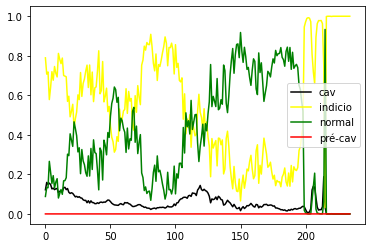

CNN_DROP_ 91


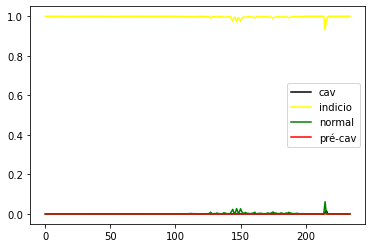

CNN_DROP_ 92


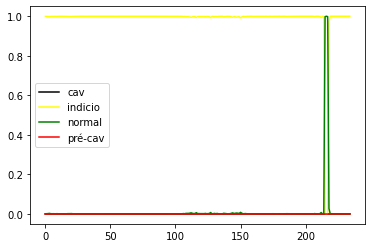

CNN_DROP_ 93


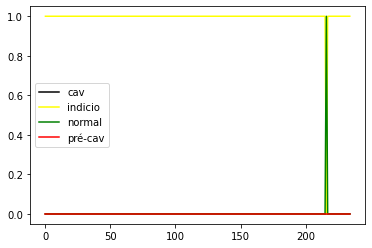

CNN_DROP_ 94


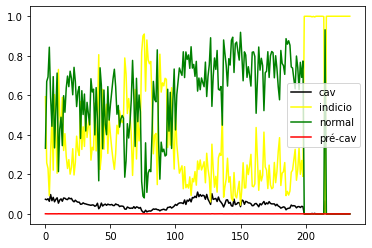

CNN_DROP_ 95


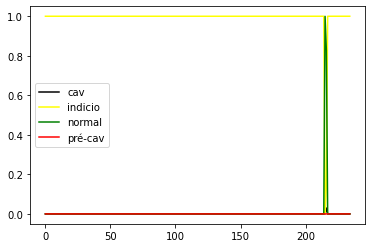

CNN_DROP_ 96


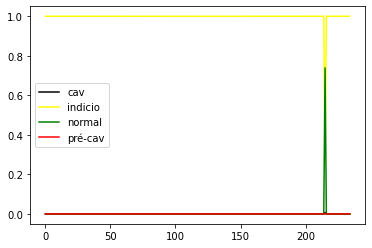

CNN_DROP_ 97


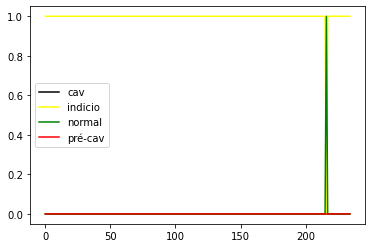

CNN_DROP_ 98


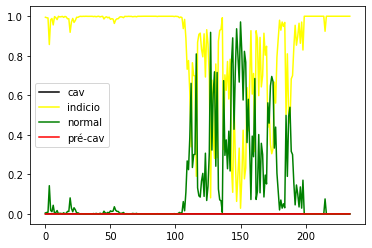

CNN_DROP_ 99


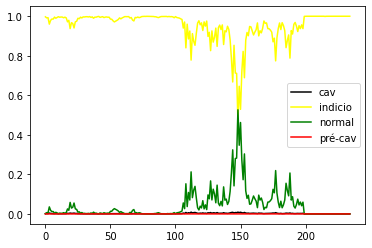

In [31]:
lstm_drop_list = range(0,n_training)
lstm_2_drop_list = range(0,n_training)
cnn_drop_list = range(0,n_training)

start = 1200

yhat_out = []

for i in lstm_drop_list:
  print("LSTM_DROP_",i)
  yhat = models_lstm_drop[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

for i in lstm_2_drop_list:
  print("LSTM_2_DROP_",i)
  yhat = models_lstm_2_drop[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

for i in cnn_drop_list:
  print("CNN_DROP_",i)
  yhat = models_cnn_drop[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

In [32]:
preds_lstm_drop_conv = []
preds_lstm_2_drop_conv = []
preds_cnn_drop_conv = []
for i in range(0,n_training):
  b = np.zeros_like(preds_lstm_drop[i])
  b[np.arange(len(preds_lstm_drop[i])), preds_lstm_drop[i].argmax(1)] = 1
  preds_lstm_drop_conv.append(b)

  b = np.zeros_like(preds_lstm_2_drop[i])
  b[np.arange(len(preds_lstm_2_drop[i])), preds_lstm_2_drop[i].argmax(1)] = 1
  preds_lstm_2_drop_conv.append(b)

  b = np.zeros_like(preds_cnn_drop[i])
  b[np.arange(len(preds_cnn_drop[i])), preds_cnn_drop[i].argmax(1)] = 1
  preds_cnn_drop_conv.append(b)

In [34]:
preds_lstm_drop_ensemble = []
preds_lstm_2_drop_ensemble = []
preds_cnn_drop_ensemble = []

for i in range(0,len(preds_lstm_drop_conv[0])):
    
    temp_lstm_drop = np.array((0,0,0,0))
    temp_lstm_2_drop = np.array((0,0,0,0))
    temp_cnn_drop = np.array((0,0,0,0))
    
    for j in range(0,len(preds_lstm_drop_conv)):
        
        vote_lstm_drop = np.argmax(preds_lstm_drop_conv[j][i])
        vote_lstm_2_drop = np.argmax(preds_lstm_2_drop_conv[j][i])
        vote_cnn_drop = np.argmax(preds_cnn_drop_conv[j][i])
        
        temp_lstm_drop[vote_lstm_drop] = temp_lstm_drop[vote_lstm_drop] + 1
        temp_lstm_2_drop[vote_lstm_2_drop] = temp_lstm_2_drop[vote_lstm_2_drop] + 1
        temp_cnn_drop[vote_cnn_drop] = temp_cnn_drop[vote_cnn_drop] + 1
        
    preds_lstm_drop_ensemble.append(temp_lstm_drop)
    preds_lstm_2_drop_ensemble.append(temp_lstm_2_drop)
    preds_cnn_drop_ensemble.append(temp_cnn_drop)

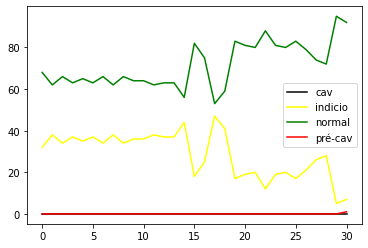

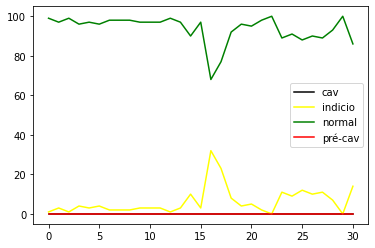

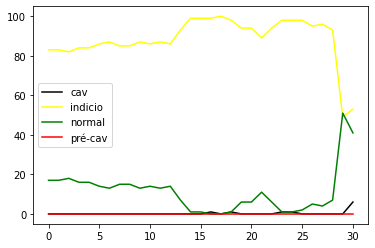

In [35]:
  pyplot.plot(np.array(preds_lstm_drop_ensemble)[:,0],label="cav",color='black')
  pyplot.plot(np.array(preds_lstm_drop_ensemble)[:,1],label="indicio",color='yellow')
  pyplot.plot(np.array(preds_lstm_drop_ensemble)[:,2],label="normal",color='green')
  pyplot.plot(np.array(preds_lstm_drop_ensemble)[:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

  pyplot.plot(np.array(preds_lstm_2_drop_ensemble)[:,0],label="cav",color='black')
  pyplot.plot(np.array(preds_lstm_2_drop_ensemble)[:,1],label="indicio",color='yellow')
  pyplot.plot(np.array(preds_lstm_2_drop_ensemble)[:,2],label="normal",color='green')
  pyplot.plot(np.array(preds_lstm_2_drop_ensemble)[:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

  pyplot.plot(np.array(preds_cnn_drop_ensemble)[:,0],label="cav",color='black')
  pyplot.plot(np.array(preds_cnn_drop_ensemble)[:,1],label="indicio",color='yellow')
  pyplot.plot(np.array(preds_cnn_drop_ensemble)[:,2],label="normal",color='green')
  pyplot.plot(np.array(preds_cnn_drop_ensemble)[:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

In [36]:
from sklearn.metrics import confusion_matrix,classification_report,f1_score,cohen_kappa_score

In [37]:
lstm_drop_f1 = []
lstm_drop_kappa = []
for i in range(0,n_training):
    f1 = f1_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_drop_conv[i])),average='weighted')
    kappa = cohen_kappa_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_drop_conv[i])))
    print("LSTM_DROP_",i)
    #print(confusion_matrix(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_drop_conv[i]))))
    print("weighted f1-score: ",f1)
    print("kappa score: ",kappa)
    
    lstm_drop_f1.append(f1)
    lstm_drop_kappa.append(kappa)

LSTM_DROP_ 0
weighted f1-score:  0.1935483870967742
kappa score:  -0.4362934362934361
LSTM_DROP_ 1
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_DROP_ 2
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_DROP_ 3
weighted f1-score:  0.47631578947368425
kappa score:  0.21090909090909093
LSTM_DROP_ 4
weighted f1-score:  0.2150537634408602
kappa score:  -0.3817829457364339
LSTM_DROP_ 5
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_DROP_ 6
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_DROP_ 7
weighted f1-score:  0.25614439324116745
kappa score:  -0.3166023166023164
LSTM_DROP_ 8
weighted f1-score:  0.16589861751152074
kappa score:  -0.49613899613899615
LSTM_DROP_ 9
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_DROP_ 10
weighted f1-score:  0.2995391705069125
kappa score:  -0.1071428571428572
LSTM_DROP_ 11
weighted f1-score:  0.6341013824884792
kappa score:  0.42592592592592593
LSTM_DROP_ 12
weighted f1-score:  0.2

In [38]:
lstm_2_drop_f1 = []
lstm_2_drop_kappa = []
for i in range(0,n_training):
    f1 = f1_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_2_drop_conv[i])),average='weighted')
    kappa = cohen_kappa_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_2_drop_conv[i])))
    print("LSTM_2_DROP_",i)
    #print(confusion_matrix(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_2_drop_conv[i]))))
    print("weighted f1-score: ",f1)
    print("kappa score: ",kappa)
    
    lstm_2_drop_f1.append(f1)
    lstm_2_drop_kappa.append(kappa)

LSTM_2_DROP_ 0
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 1
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 2
weighted f1-score:  0.6025996671157962
kappa score:  0.37316176470588225
LSTM_2_DROP_ 3
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 4
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 5
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 6
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 7
weighted f1-score:  0.2535633908477119
kappa score:  -0.003597122302158251
LSTM_2_DROP_ 8
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 9
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 10
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 11
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 12
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_DROP_ 13


In [39]:
cnn_drop_f1 = []
cnn_drop_kappa = []
for i in range(0,n_training):
    f1 = f1_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_cnn_drop_conv[i])),average='weighted')
    kappa = cohen_kappa_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_cnn_drop_conv[i])))
    print("CNN_DROP_",i)
    #print(confusion_matrix(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_cnn_drop_conv[i]))))
    print("weighted f1-score: ",f1)
    print("kappa score: ",kappa)
    
    cnn_drop_f1.append(f1)
    cnn_drop_kappa.append(kappa)

CNN_DROP_ 0
weighted f1-score:  0.3155680224403927
kappa score:  0.0
CNN_DROP_ 1
weighted f1-score:  0.3299120234604106
kappa score:  0.008000000000000007
CNN_DROP_ 2
weighted f1-score:  0.3155680224403927
kappa score:  0.0
CNN_DROP_ 3
weighted f1-score:  0.3155680224403927
kappa score:  0.0
CNN_DROP_ 4
weighted f1-score:  0.3299120234604106
kappa score:  0.008000000000000007
CNN_DROP_ 5
weighted f1-score:  0.3548387096774194
kappa score:  0.08823529411764719
CNN_DROP_ 6
weighted f1-score:  0.3225806451612903
kappa score:  0.004016064257028273
CNN_DROP_ 7
weighted f1-score:  0.3155680224403927
kappa score:  0.0
CNN_DROP_ 8
weighted f1-score:  0.3299120234604106
kappa score:  0.008000000000000007
CNN_DROP_ 9
weighted f1-score:  0.3621700879765396
kappa score:  0.091796875
CNN_DROP_ 10
weighted f1-score:  0.3155680224403927
kappa score:  0.0
CNN_DROP_ 11
weighted f1-score:  0.7004174573055028
kappa score:  0.523076923076923
CNN_DROP_ 12
weighted f1-score:  0.3299120234604106
kappa score:

Gerando as estatísticas para cada um dos experimentos

In [40]:
f1_stats = pd.DataFrame(data = [lstm_drop_f1,lstm_2_drop_f1,cnn_drop_f1]).T
f1_stats.columns = ['LSTM_DROP','LSTM_2_DROP','CNN_DROP']

In [41]:
f1_stats.describe()

,LSTM_DROP,LSTM_2_DROP,CNN_DROP
count,100.000000,100.000000,100.000000
mean,0.273478,0.313157,0.388284
std,0.094961,0.111388,0.156331
min,0.033370,0.247801,0.307918
25%,0.247801,0.247801,0.315568
50%,0.247801,0.247801,0.322581
75%,0.315568,0.316527,0.329912
max,0.634101,0.766464,0.857663


<AxesSubplot:>

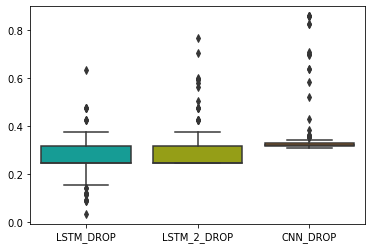

In [42]:
sns.boxplot(data=f1_stats)

In [43]:
kappa_stats = pd.DataFrame(data = [lstm_drop_kappa,lstm_2_drop_kappa,cnn_drop_kappa]).T
kappa_stats.columns = ['LSTM_DROP','LSTM_2_DROP','CNN_DROP']

In [44]:
kappa_stats.describe()

,LSTM_DROP,LSTM_2_DROP,CNN_DROP
count,100.000000,100.000000,100.000000
mean,-0.084406,0.055791,0.101062
std,0.237162,0.124944,0.230872
min,-0.754717,-0.276471,-0.054000
25%,-0.137626,0.000000,0.000000
50%,0.000000,0.000000,0.004016
75%,0.008000,0.052158,0.008000
max,0.425926,0.650376,0.823194


<AxesSubplot:>

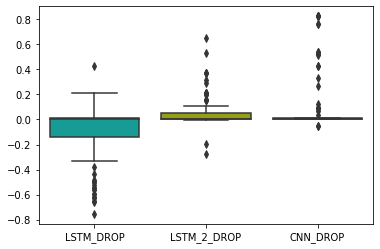

In [45]:
sns.boxplot(data=kappa_stats)

In [46]:
len(kappa_stats)

100

In [47]:
base_full = pd.DataFrame()
for i in range(0,8):
    base_full = pd.concat([base_full,base_treino[i]])

base_full = pd.concat([base_full,base_teste])

In [48]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [49]:
scaler = StandardScaler()
base_full_sc = scaler.fit_transform(base_full.drop('LABEL',axis=1))
pca = PCA(n_components = 2)
base_full_pca = pca.fit_transform(base_full_sc)
base_full_pca = pd.DataFrame(data=base_full_pca,columns=['pca1','pca2'])
base_full_pca['LABEL'] = label_encoder.transform(base_full.LABEL.values)

In [50]:
base_full_pca.LABEL.value_counts()

2    284
1    203
3     24
0      9
Name: LABEL, dtype: int64

<AxesSubplot:xlabel='pca1', ylabel='pca2'>

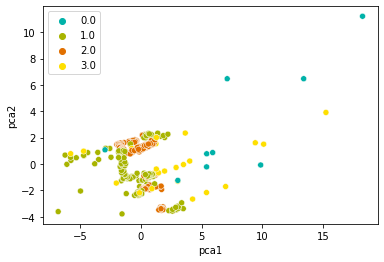

In [51]:
base_full_pca.loc[:,'LABEL'] = base_full_pca.LABEL.astype(np.float)
sns.scatterplot(x=base_full_pca.pca1,y=base_full_pca.pca2,hue=base_full_pca.LABEL.values,palette=flatui)